# Recommender systems, a celebration of collaborative filtering and content filtering

<br>
**Project website:** https://xuwd11.github.io/Recommender_Systems/

**Note:** This notebook is created by merging [notebooks](https://github.com/xuwd11/Recommender_Systems/tree/gh-pages/notebooks) directly used for building the project website.

**Note:** You can view source codes for this project on [GitHub](https://github.com/xuwd11/Recommender_Systems), including the python package [`recommender`](https://github.com/xuwd11/Recommender_Systems/tree/master/recommender) we wrote for this project.
<br>


## Project Statement and Motivation

Recommender systems can predict the rating a user would give to an item by learning from the historical data of user's ratings, or the attributes of users and items if available. In this project, we constructed a recommender system for restaurants using an ensemble method, which combines the prediction of several base estimators, including baseline estimators, collaborative filtering estimators, and content filtering estimators. We benchmarked these base estimators, followed by exploring strategies of building the ensemble estimator. We demonstrated our recommender system performs robustly on different size of datasets.
<br><br>

## Introduction and Description of Data

### Dataset

In this project, we use "review" (shape: 4736897 X 9), "business" (shape: 156639 X 101)  and "user" (shape: 1183362 X 22) from [Yelp academic dataset](https://www.yelp.com/dataset/challenge). Each row in "review" specifies a review that a user makes on a restaurant (or other business premises such as barbershop), including date, comment ("text") and rating ("stars"), as well as the number of votes of different attributes received on this review. "Business" contains information on restaurants and barbershops appearing in "review", including typical attributes defining a restaurant and average ratings. There are a lot of missing values in "business", mostly caused by the missing of attribute descriptions. "User" contains information on users, including profile summaries, social networks on yelp and average ratings. "Review", "business" and "user" are linked together through "user\_id" and "business\_id". A peek of raw data is available [here](https://github.com/xuwd11/Recommender_Systems/blob/master/01_rawdata_peek.ipynb).

### Data Wrangling

To wrangle data for EDA and predictive modeling, we first checked and cleaned duplicate reviews (an user reviews a business for multiple times). We identified 1 case of duplicates involving 2 reviews; we simply dropped one of them since the ratings happen to be the same. Then we dropped business places unrelated to restaurants and closed restaurants (~16.4% of rows in "business"), and kept reviews and users associated with remaining restaurants. We conducted a series of EDA and found that ratings are correlated with many of the attributes in "business", "user" and "review", which inspired us to propose a content filtering model. We checked the number of restaurants in each city (there are 980 cities in the remaining dataset), and sampled several sets of different sizes by extracting data associated with restaurants in several cities of different sizes respectively for benchmarking (we chose Champaign, Cleveland, Pittsburgh, Toronto, and Las_Vegas). 

To build a recommender system, we can do collaborative filtering or content filtering. To perform collaborative filtering, we only need restaurant ratings from each user, which we can obtain by keeping 3 columns, i.e., "user\_id", "business\_id" and "stars", in "review". Content filtering requires a profile for each user or restaurant, which can characterize its nature; we can obtain the required data by merging "review" with "user" and "business" through "user\_id" and "business\_id" respectively.
<br><br>

## Literature Review/Related Work

There are primarily [2 strategies](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf) for recommender systems, content filtering and [collaborative filtering](http://files.grouplens.org/papers/FnT%20CF%20Recsys%20Survey.pdf). Content filtering requires a profile for each user or restaurant, which captures its nature, and makes predictions by learning from user or restaurant profiles. Collaborative filtering makes predictions by analyzing only past user behavior, such as restaurant ratings. Although collaborative filtering suffers from cold start problem due to its inability to handle new users and restaurants, collaborative filtering is extremely helpful when user or restaurant profile data required for content filtering are not available, and is generally more accurate than content filtering methods.

Collaborative filtering approaches include neighborhood methods and latent factor models. As demonstrated by the [Netflix Prize competition](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf), matrix factorization based latent factor models generally performs better than neighborhood methods.

We implemented some baseline models and latent factor models from scratch (by using `numpy` and `scipy`'s linear algebra toolkits instead of well-established recommender system packages); we implemented other algorithms by wrapping around methods in a recommender system python package, [`scikit-surprise`](http://surpriselib.com/). Each algorithm we implemented by using the [`scikit-surprise`](http://surpriselib.com/) package is indicated by a * after its name.

Besides reporting root mean square error (RMSE) and $R^2$ score, we found it would be very helpful to visualize model's performance on different ratings by rounding the predicted ratings to integers (and setting ratings below 1 to 1 and above 5 to 5), and plotting the confusion matrix in a format used in [a related work](https://github.com/kevin11h/YelpDatasetChallengeDataScienceAndMachineLearningUCSD/blob/master/Yelp%20Predictive%20Analytics.ipynb). 

A comprehensive list of references can be found in [References](09_reference.html).
<br><br>

## Result summary

We benchmarked the base estimators and ensemble estimators in 6 datasets of different sizes. In each dataset, we randomly split the reviews into 3 sets: a training set (60%), a cross-validation set (16%) and a test set (24%). We train base estimators on the training set, and test on the test set; cross-validation set is used for the training of ensemble estimators. All experiments are run on a desktop with Inter Xeon CPU 3.10 GHz, 256 GB RAM.

Please see [EDA](03_EDA.html), [Collaborative Filtering](04_collaborative_filtering.html) and [Content Filtering](05_content_filtering.html) for modeling approaches and project trajectory.

Please see [Results](07_results.html) for detailed results including confusion matrix visualization (of rounded predictions) for each experiment we list below.

Please see [Conclusions](08_conclusions.html) for conclusions and future work.
<br><br>

In [1]:
import sys
import traceback
import pandas as pd
import numpy as np
import time
from copy import deepcopy

from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from scipy import sparse

import pickle

from IPython.display import display, HTML, Markdown

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

from surprise import Dataset, Reader
from surprise import NormalPredictor, BaselineOnly, SVD, SVDpp, NMF, \
SlopeOne, CoClustering, KNNBasic, KNNWithMeans, KNNBaseline

from recommender import plot_cm, get_results, show_results, IO, \
show_summaries, get_base_predictions, get_multi_base_predictions
from recommender import ModeClassifier, BaselineMean, BaselineRegression, ALS1, ALS2, RS_surprise, RS_ensemble

In [2]:
cities = ['Champaign', 'Cleveland', 'Pittsburgh', 'Toronto', 'Las_Vegas', 'Full']

for city in cities:
    data_dir = 'data/{}/'.format(city)
    model_names = IO(data_dir + 'results/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results/is_successful.pkl').read_pickle()
    sizes = IO(data_dir + 'sizes.pkl').read_pickle()
    
    display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                 format(city, sizes[0], sizes[1], sizes[2])))
    # display(Markdown('**Collaborative filtering**'))
    show_summaries(model_names, results, is_successful, title='Collaborative filtering')
    display(Markdown('<sup>(* shows the algorithms we implemented by wrapping around \
    methods in scikit-surprise python package)</sup>'))
    
    model_names = IO(data_dir + 'results05/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results05/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results05/is_successful.pkl').read_pickle()
    #sizes = IO(data_dir + 'sizes.pkl').read_pickle()

    #display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                     #format(city, sizes[0], sizes[1], sizes[2])))
    #display(Markdown('**Content filtering**'))
    show_summaries(model_names, results, is_successful, title='Content filtering')
    
    model_names = IO(data_dir + 'results06/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results06/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results06/is_successful.pkl').read_pickle()
    #sizes = IO(data_dir + 'sizes.pkl').read_pickle()

    #display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                     #format(city, sizes[0], sizes[1], sizes[2])))
    #display(Markdown('**Ensemble estimators**'))
    show_summaries(model_names, results, is_successful, title='Ensemble estimators')
    display(Markdown('<sup>(Ensemble1 represents the ensemble of collaborative filtering models; \
    Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>'))
        
    display(Markdown('''<br><br>'''))

### Champaign <sup>(20571 reviews, 878 restaurants, 8451 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.9995,2.0258,-0.9501,-0.9500
Normal predictor*,0.0870,1.8825,1.8821,-0.7286,-0.6833
Baseline (mean),0.0190,0.9485,1.4648,0.5612,-0.0195
Baseline (regression),0.0350,1.0481,1.3032,0.4642,0.1930
Baseline (ALS)*,0.0570,1.1981,1.3200,0.2998,0.1721
KNN (basic)*,0.9841,0.4328,1.4642,0.9086,-0.0187
KNN (with means)*,1.2851,0.5898,1.5310,0.8303,-0.1138
KNN (baseline)*,1.0201,0.4175,1.3718,0.9150,0.1058
SVD-ALS1,12.2077,0.6747,1.3064,0.7780,0.1891
SVD-ALS2,12.9087,0.6764,1.3092,0.7768,0.1855


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.0690,1.0773,1.0971,0.4339,0.4280
Random forest,1.0951,1.0262,1.0862,0.4864,0.4394


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.000,0.8527,1.3071,0.6454,0.1882
Ensemble1 (Ridge regression),0.011,1.3268,1.3026,0.1413,0.1937
Ensemble1 (random forest),0.220,1.0506,1.3048,0.4617,0.1910
Ensemble2 (weighted average),0.000,0.9007,1.1591,0.6043,0.3616
Ensemble2 (Ridge regression),0.004,1.2721,1.0830,0.2107,0.4426
Ensemble2 (random forest),0.271,1.0678,1.0847,0.4439,0.4409


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

### Cleveland <sup>(75932 reviews, 2500 restaurants, 30131 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8152,1.8262,-0.8226,-0.8371
Normal predictor*,0.2250,1.7514,1.7529,-0.6968,-0.6926
Baseline (mean),0.0550,0.8908,1.3417,0.5610,0.0084
Baseline (regression),0.1110,0.9870,1.2051,0.4611,0.2000
Baseline (ALS)*,0.2790,1.1171,1.2170,0.3097,0.1841
KNN (basic)*,13.4688,0.3952,1.3484,0.9136,-0.0016
KNN (with means)*,14.3168,0.5600,1.4020,0.8265,-0.0829
KNN (baseline)*,13.0127,0.3837,1.2612,0.9186,0.1237
SVD-ALS1,41.9954,0.5721,1.2095,0.8190,0.1941
SVD-ALS2,44.2825,0.5740,1.2121,0.8177,0.1907


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.2860,1.0195,1.0313,0.4251,0.4141
Random forest,4.7943,0.9929,1.0155,0.4546,0.4320


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.7559,1.2085,0.6839,0.1955
Ensemble1 (Ridge regression),0.0050,0.9587,1.2040,0.4916,0.2014
Ensemble1 (random forest),0.7260,0.9431,1.2063,0.5080,0.1984
Ensemble2 (weighted average),0.0000,0.8214,1.0915,0.6268,0.3437
Ensemble2 (Ridge regression),0.0070,1.0072,1.0141,0.4389,0.4334
Ensemble2 (random forest),0.9471,0.9989,1.0180,0.4480,0.4291


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

### Pittsburgh <sup>(143682 reviews, 4745 restaurants, 46179 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8026,1.7988,-0.8466,-0.8393
Normal predictor*,0.4550,1.7307,1.7303,-0.7022,-0.7017
Baseline (mean),0.1020,0.9052,1.3198,0.5343,0.0099
Baseline (regression),0.2000,0.9941,1.1878,0.4384,0.1980
Baseline (ALS)*,0.5780,1.1119,1.2020,0.2974,0.1788
SVD-ALS1,79.5536,0.5627,1.1960,0.8200,0.1870
SVD-ALS2,82.5507,0.5651,1.2010,0.8185,0.1801
SVD-SGD*,7.5524,0.8267,1.2046,0.6116,0.1752
SVD++-SGD*,43.6945,0.8738,1.2025,0.5661,0.1780
NMF-SGD*,9.3785,0.3666,1.3761,0.9236,-0.0765


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.5500,1.0158,1.0062,0.4135,0.4245
Random forest,10.1126,0.9938,0.9896,0.4388,0.4434


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8050,1.1919,0.6317,0.1925
Ensemble1 (Ridge regression),0.0150,0.9371,1.1872,0.5010,0.1988
Ensemble1 (random forest),1.2871,0.9703,1.1882,0.4650,0.1974
Ensemble2 (weighted average),0.0000,0.8576,1.0612,0.5820,0.3598
Ensemble2 (Ridge regression),0.0170,0.9494,0.9882,0.4878,0.4449
Ensemble2 (random forest),1.7071,0.9996,0.9933,0.4322,0.4391


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

### Toronto <sup>(331407 reviews, 12118 restaurants, 77506 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8830,1.8801,-1.1173,-1.1219
Normal predictor*,1.0181,1.7034,1.7099,-0.7326,-0.7552
Baseline (mean),0.2360,0.9293,1.2911,0.4843,-0.0006
Baseline (regression),0.6270,0.9918,1.1624,0.4126,0.1890
Baseline (ALS)*,1.6651,1.0916,1.1730,0.2884,0.1740
SVD-ALS1,168.3716,0.5614,1.1751,0.8118,0.1711
SVD-ALS2,169.0347,0.5634,1.1795,0.8104,0.1649
SVD-SGD*,17.6360,0.8222,1.1772,0.5963,0.1681
SVD++-SGD*,119.8469,0.8730,1.1763,0.5449,0.1694
NMF-SGD*,22.2953,0.4094,1.3369,0.8999,-0.0729


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,1.1401,1.0049,1.0035,0.3970,0.3955
Random forest,27.0035,0.9891,0.9909,0.4158,0.4106


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8044,1.1661,0.6136,0.1837
Ensemble1 (Ridge regression),0.0290,1.0152,1.1620,0.3845,0.1895
Ensemble1 (random forest),3.2312,0.9977,1.1637,0.4056,0.1872
Ensemble2 (weighted average),0.0000,0.8564,1.0542,0.5620,0.3329
Ensemble2 (Ridge regression),0.0390,1.0111,0.9879,0.3895,0.4141
Ensemble2 (random forest),4.1512,0.9948,0.9962,0.4090,0.4043


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

### Las_Vegas <sup>(1280896 reviews, 20434 restaurants, 429363 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.9060,1.9073,-0.7549,-0.7578
Normal predictor*,5.3933,1.8565,1.8573,-0.6649,-0.6667
Baseline (mean),1.1371,0.9990,1.4148,0.5179,0.0329
Baseline (regression),5.9963,1.0732,1.2612,0.4436,0.2314
Baseline (ALS)*,6.9174,1.1880,1.2696,0.3182,0.2211
SVD-ALS1,652.1173,0.4264,1.2794,0.9122,0.2091
SVD-ALS2,674.9286,0.4283,1.2862,0.9114,0.2007
SVD-SGD*,70.6220,0.7758,1.2827,0.7093,0.2050
SVD++-SGD*,333.8711,0.8046,1.3020,0.6873,0.1809
NMF-SGD*,92.4893,0.4178,1.4916,0.9157,-0.0750


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,5.0093,1.1216,1.1226,0.3923,0.3911
Random forest,154.2278,1.1008,1.1029,0.4146,0.4122


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.7633,1.2648,0.7185,0.2270
Ensemble1 (Ridge regression),0.1270,1.0514,1.2600,0.4660,0.2329
Ensemble1 (random forest),13.2948,1.0838,1.2617,0.4326,0.2308
Ensemble2 (weighted average),0.0000,0.8674,1.1697,0.6366,0.3389
Ensemble2 (Ridge regression),0.1520,1.1144,1.1016,0.4001,0.4136
Ensemble2 (random forest),16.9300,1.1061,1.1082,0.4090,0.4066


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

### Full <sup>(4166778 reviews, 131025 restaurants, 1117891 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8974,1.8985,-0.7803,-0.7799
Normal predictor*,19.3631,1.8394,1.8405,-0.6729,-0.6727
Baseline (mean),4.6053,1.0178,1.4063,0.4878,0.0234
Baseline (regression),21.4822,1.0642,1.2529,0.4400,0.2248
Baseline (ALS)*,27.2096,1.1754,1.2659,0.3169,0.2086
SVD-ALS1,2153.7902,0.5313,1.2691,0.8604,0.2046
SVD-ALS2,2268.9128,0.5332,1.2756,0.8594,0.1965
SVD-SGD*,242.1499,0.8312,1.2721,0.6584,0.2008
SVD++-SGD*,1473.2923,0.8713,1.2784,0.6246,0.1930
NMF-SGD*,323.9235,0.4277,1.4656,0.9095,-0.0607


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,17.1610,1.0857,1.0869,0.4171,0.4167
Random forest,663.2849,1.0639,1.0653,0.4403,0.4396


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8161,1.2572,0.6706,0.2195
Ensemble1 (Ridge regression),0.4160,1.0550,1.2520,0.4496,0.2260
Ensemble1 (random forest),56.0282,1.0652,1.2542,0.4389,0.2233
Ensemble2 (weighted average),0.0000,0.8864,1.1434,0.6115,0.3545
Ensemble2 (Ridge regression),0.5530,1.0865,1.0623,0.4163,0.4427
Ensemble2 (random forest),69.6950,1.0689,1.0703,0.4351,0.4343


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

<br><br>

## Authors

* [Weidong Xu](https://github.com/xuwd11)

* [Jiejun Lu](https://github.com/gwungwun)

# EDA

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np

from IPython.display import display

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

In [2]:
# Load data

city = 'Full'
fig_dir = 'figs/modeling/{}/'.format(city)
data_dir = 'data/{}/'.format(city)

dfb = pd.read_pickle(data_dir + 'business.pkl')
dfr = pd.read_pickle(data_dir + 'review.pkl')
dfu = pd.read_pickle(data_dir + 'user.pkl')
datar = pd.read_pickle(data_dir + 'data_review.pkl')


# print("business table")
# print(dfb.shape)
# display(dfb.head())
# print("review table")
# print(dfr.shape)
# display(dfr.head())
# print("user table")
# print(dfu.shape)
# display(dfu.head())
# print("data_review table")
# print(datar.shape)
# display(datar.head())

In [3]:
def plot_discrete_hist(x, xticks=None, normalize=False, minlength=5, **args):
    '''
    INPUTS
    ======
    x: numpy array of shape (n,), required
    xticks: array_like, optional
        list/array to specify the order of xticks
    normalize: bool, optional
    minlength: int, optional
        minimum number of bins
    **args: 
        arguments passed to plt.bar()    
    '''
    if xticks is None:
        xticks = np.sort(np.unique(x))
        xmin = np.min(xticks)
        x = x - xmin
    else:
        if set(xticks) != set(np.unique(x)):
            raise ValueError('xticks not consistent with values in x.')
        xticks2id = {_x:i for i, _x in enumerate(xticks)}
        x = np.array([xticks2id[_x] for _x in x])
    
    counts = np.bincount(x, minlength=minlength)
       
    if normalize:
        counts = counts / np.sum(counts)        
    
    plt.bar(np.arange(len(counts)), counts, **args)
    plt.xticks(np.arange(len(xticks)), xticks) # xticks could be set manually later.

## Exploration of Review Table

We first look at the review table with size (4166778, 9). The histogram below shows the distribution of stars from total reviews in yelp. 5-star reviews takes a great proportion.

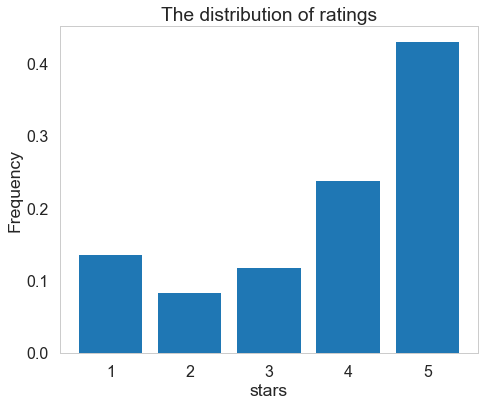

In [4]:
# Example
plt.figure(figsize=(7.5, 6))

plot_discrete_hist(dfr['stars'].values, normalize=True);
plt.xlabel('stars');
plt.ylabel('Frequency');
plt.title('The distribution of ratings');
plt.savefig(fig_dir + 'hist.png', bbox_inches='tight')

We manipulate the date column to show the relationships between review scores and year / month / day.

In [5]:
# explore review table (dfr)

## date : year, month, day

dfr['year'] = dfr['date'].apply(lambda x: int(x[:4]))
dfr['month'] = dfr['date'].apply(lambda x: int(x[5:7]))
dfr['day'] = dfr['date'].apply(lambda x: int(x[8:10]))
# dfr.head()

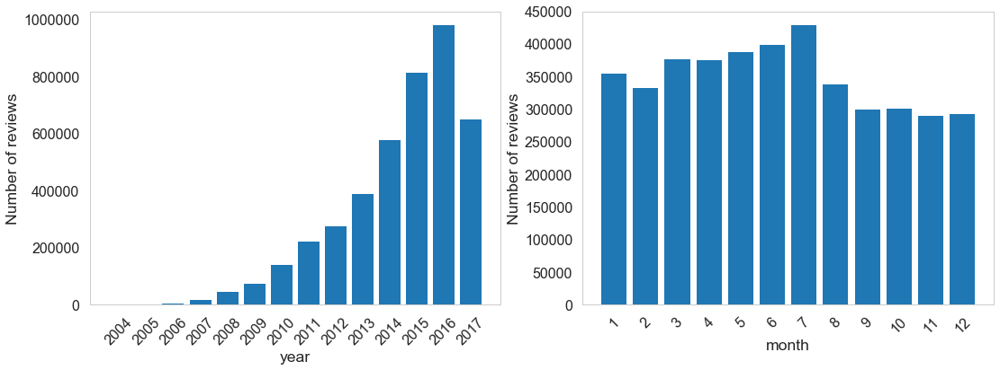

In [6]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
plot_discrete_hist(dfr['year'].astype(int).values, normalize=False)
plt.xlabel('year');
plt.ylabel('Number of reviews');
plt.xticks(rotation=45);

plt.subplot(1, 2, 2)
plot_discrete_hist(dfr['month'].astype(int).values, normalize=False)
plt.xlabel('month');
plt.ylabel('Number of reviews');
plt.xticks(rotation=45);

The amount of reviews is increasing since yelp started (2017 is lower because there is not enough data). Similarly reviews received in the later months are a little bit fewer. The following is the relationships between reviews and date (month/day/year). 

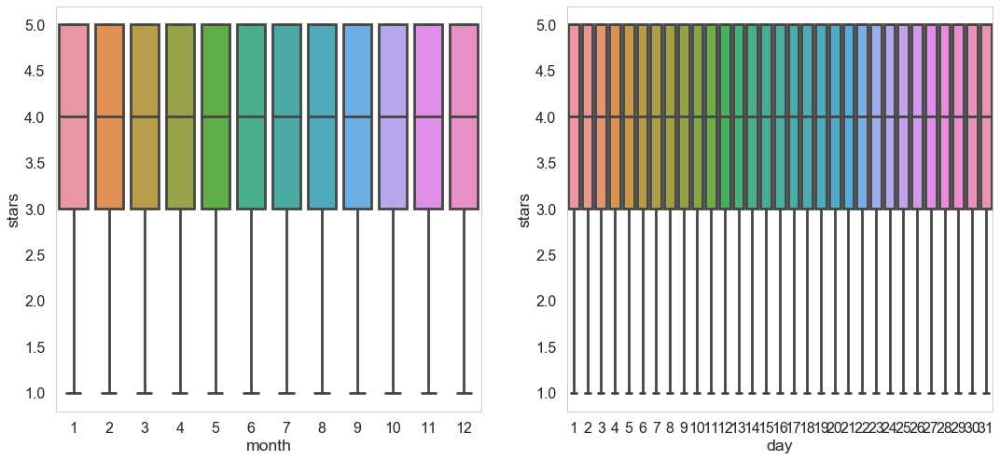

In [7]:
plt.figure(figsize=(18, 8))
plt.subplot(1, 2, 1)
sns.boxplot(x='month', y='stars', data=dfr);
plt.subplot(1, 2, 2)
sns.boxplot(x='day', y='stars', data=dfr);

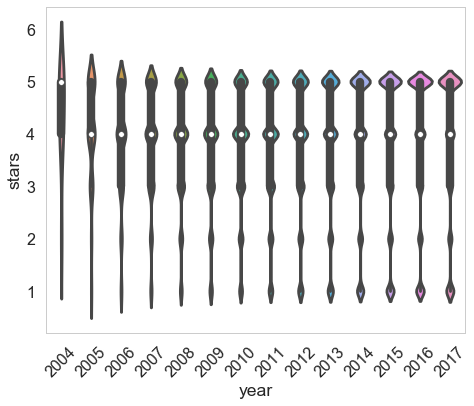

In [8]:
plt.figure(figsize=(7.5, 6))
plt.subplot(1, 1, 1)
sns.violinplot(x='year', y='stars', data=dfr);
plt.xticks(rotation=45);

There is no apparent pattern for stars w.r.t. month and day. For year as variable, at the beginning (2004/2005) most of the reviewes received high stars. However, the distribution becomes spread and polarization is severe. That means users may tend to give extreme reviews.

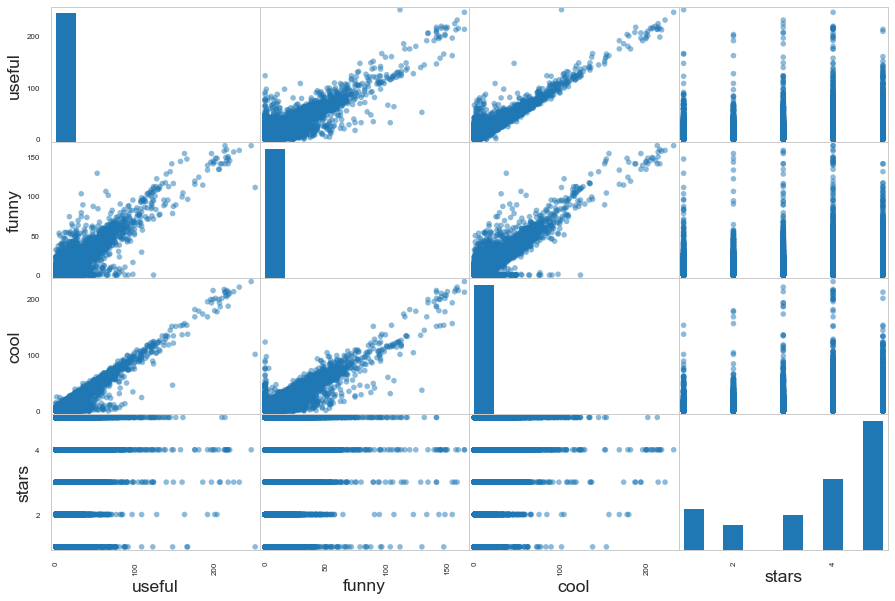

In [9]:
from pandas.plotting import scatter_matrix
fig, ax = plt.subplots(1,1, figsize=(15,10))
axes = scatter_matrix(dfr[['useful', 'funny', 'cool', 'stars']], alpha=0.5, diagonal='hist', ax=ax)
plt.show()

This is the correlation graph for stars of each review and three attributes received by this review. There are some interesting facts:

1. distribution of stars w.r.t. useful: reviews given by low stars are more likely to be agreed as 'useful' by other users.

2. useful, cool and funny has certain positive relationships. Perhaps yelp would rank this review at top by default so they are much easier to be commented by users.


## Exploration of Business Table

In [10]:
## inner join business (dfb) & stars (datar)
## p.s. stars_x represent star given by single user
##      stars_y represent average stars of restaurant

df_br = datar.merge(dfb, left_on="business_id", right_on="business_id")
#df_br.head()

We explore the restaurants information by merging business talbe with data_review table. We get a table with size (4166778, 95). Here stars_x represent star given by single user and stars_y represent average stars of restaurant. We first have a glance at the distribution of restaurants' average stars (star_y) and wordcloud for 1-star and 5-star review.

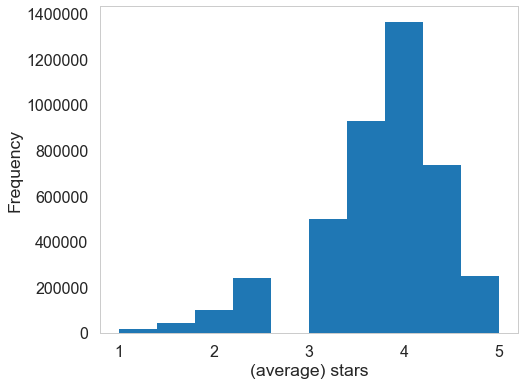

In [11]:
plt.figure(figsize=(7.5, 6))

plt.hist(df_br['stars_y'].values);
plt.xlabel('(average) stars');
plt.ylabel('Frequency');

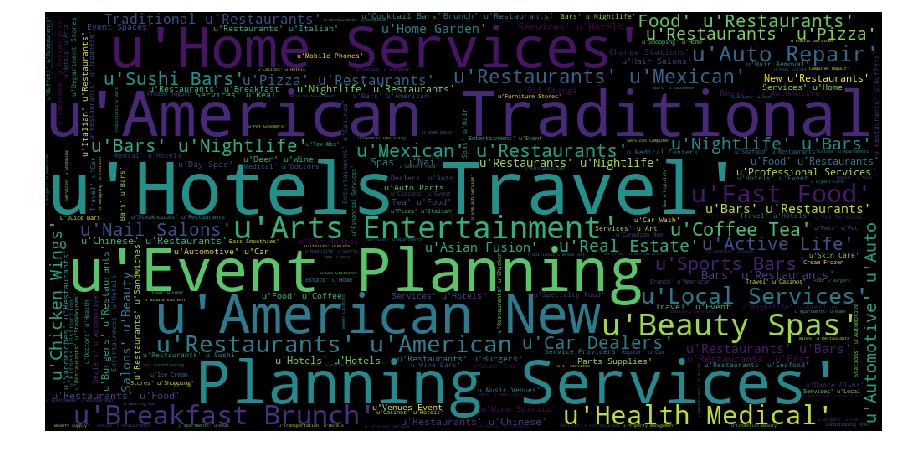

In [12]:
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1000, height = 500).generate(' '.join(df_br[df_br['stars_x'] == 1]['categories']));
plt.figure(figsize=(15,8));
plt.imshow(wordcloud);
plt.axis('off');

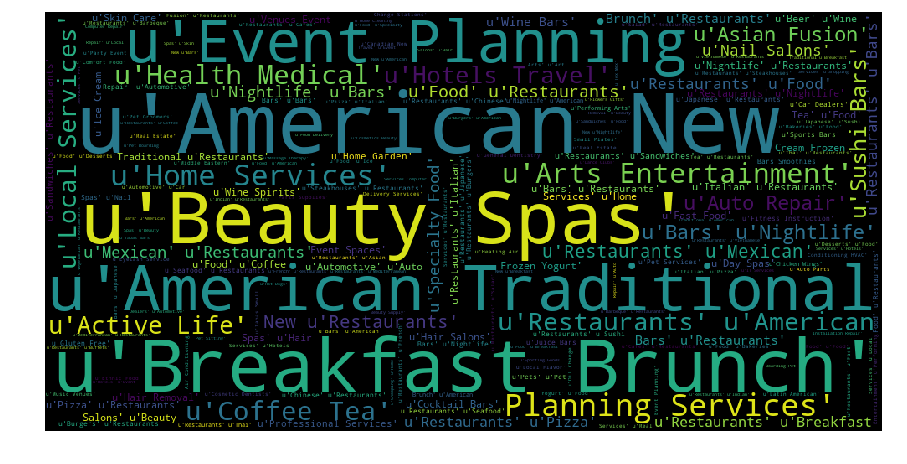

In [13]:
from wordcloud import WordCloud
wordcloud = WordCloud(width = 1000, height = 500).generate(' '.join(df_br[df_br['stars_x'] == 5]['categories']));
plt.figure(figsize=(15,8));
plt.imshow(wordcloud);
plt.axis('off');

Comparing the categories between 1-star and 5-star reviews, we found that they differ with each other to some extent. For example, american traditional appear more in 1-star review, while American new appear more in 5-star. 

In [14]:
# df_br['postal_code'] = df_br['postal_code'].apply(lambda x: x[1:])

In [15]:
df_br2 = df_br.dropna(axis = 0, how = 'any', subset = ['longitude', 'latitude'])

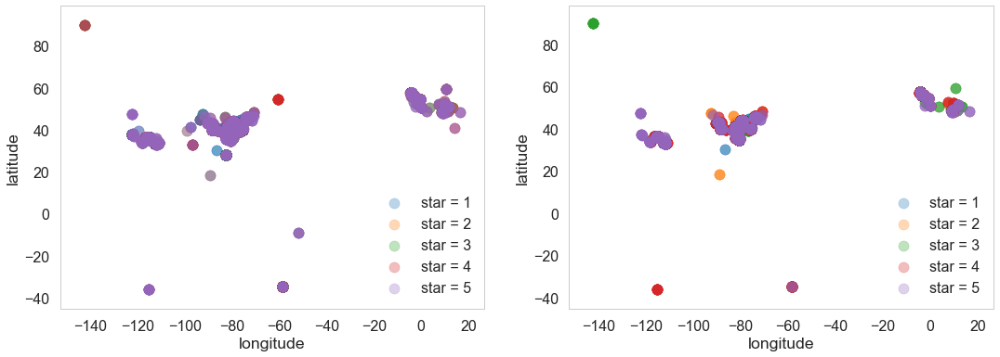

In [16]:
plt.figure(figsize=(18, 6))
for i in range(5):
    plt.subplot(1, 2, 1)
    plt.scatter(df_br[df_br['stars_x'] == i + 1]['longitude'], df_br[df_br['stars_x'] == i + 1]['latitude'], alpha = 0.3, label = 'star = ' + str(i + 1));
    plt.xlabel('longitude');
    plt.ylabel('latitude');
plt.legend();

for i in range(5):
    plt.subplot(1, 2, 2)
    plt.scatter(df_br[df_br['stars_y'] == i + 1]['longitude'], df_br[df_br['stars_y'] == i + 1]['latitude'], alpha = 0.3, label = 'star = ' + str(i + 1));
    plt.xlabel('longitude');
    plt.ylabel('latitude');
plt.legend();

# plt.subplot(1, 2, 2)
# plt.scatter(df_br['postal_code'], df_br['stars_x'])
# plt.xlabel('postal code')
# plt.ylabel('star')

In [17]:
# plt.figure(figsize=(20, 6))
# for i in range(5):
#     plt.subplot(1, 2, 1)
#     plt.scatter(df_br[df_br['stars_y'] == i + 1]['longitude'], df_br[df_br['stars_y'] == i + 1]['latitude'], alpha = 0.3, label = 'star = ' + str(i + 1));
#     plt.xlabel('longitude');
#     plt.ylabel('latitude');
# plt.legend();

# plt.subplot(1, 2, 2)
# plt.scatter(df_br['postal_code'], df_br['stars_y'])
# plt.xlabel('postal code')
# plt.ylabel('star')

Both individual stars and average stars seem to have some links with location (longitude and latitude, similar postal code refers to places close with each other as well). There are clustering effect for some locations, but the pattern is not clear. So simply including the numeric values of location variables in the later analysis is unreasonable.

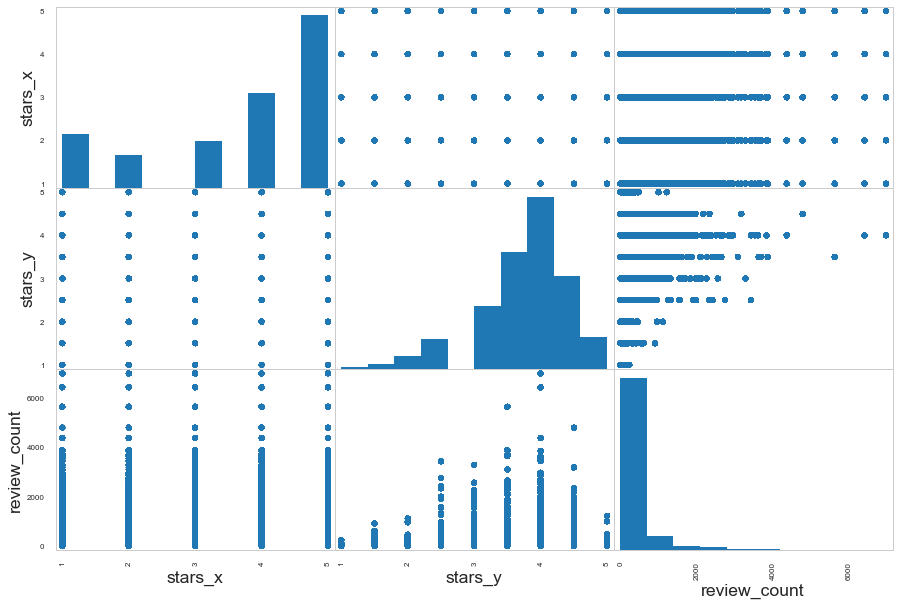

In [18]:
fig, ax = plt.subplots(1,1, figsize=(15,10));
axes = scatter_matrix(df_br[['stars_x', 'stars_y', 'review_count']], alpha=0.5, diagonal='hist', ax=ax);
plt.show();

We compare individual stars, restaurants' average stars and review count in the pair plot.

1. Stars given by single user has positive relationships with average stars of the restaurants

2. Higher average star is usually related to higher review count. Reason might be customers would choose high star restaurant to eat and comment. But there is no clear pattern between individual w.r.t. review_count.

In the following, we explore the relationships between average stars and different attributes of the restaurants.

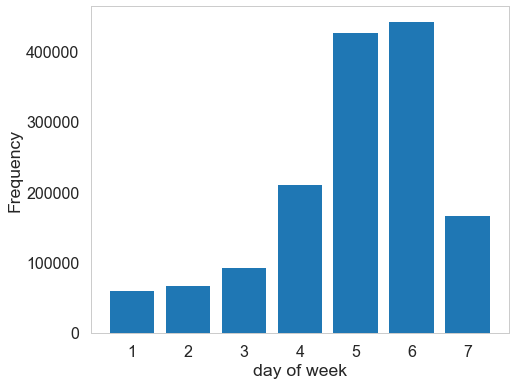

In [19]:
week = ['monday', 'tuesday', 'wednesday','thursday', 'friday', 'saturday', 'sunday']
count = []

for i in week:
    count.append(df_br.groupby(['attributes.BestNights.' + i]).size()[1]);

plt.figure(figsize=(7.5, 6))
plt.bar(range(1, 8), count);
plt.xlabel('day of week');
plt.ylabel('Frequency');

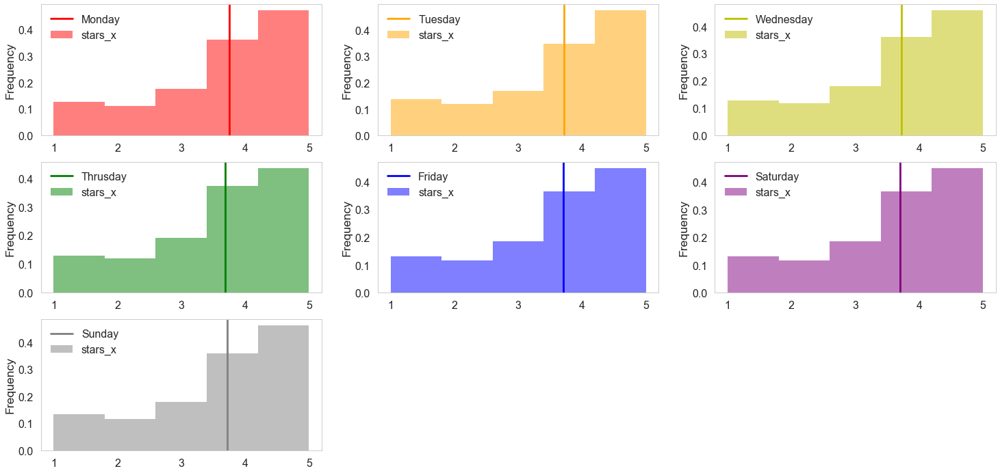

In [20]:
plt.figure(figsize=(25, 12))
plt.subplot(3, 3, 1)
df_br[df_br['attributes.BestNights.monday']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'r',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.monday']==True]['stars_x'].mean(), color='r', label='Monday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 2)
df_br[df_br['attributes.BestNights.tuesday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'orange',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.tuesday']==True]['stars_x'].mean(), color='orange', label='Tuesday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 3)
df_br[df_br['attributes.BestNights.wednesday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'y',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.wednesday']==True]['stars_x'].mean(), color='y', label='Wednesday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 4)
df_br[df_br['attributes.BestNights.thursday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'g',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.thursday']==True]['stars_x'].mean(), color='g', label='Thrusday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 5)
df_br[df_br['attributes.BestNights.friday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'b',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.friday']==True]['stars_x'].mean(), color='b', label='Friday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 6)
df_br[df_br['attributes.BestNights.saturday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'purple',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.saturday']==True]['stars_x'].mean(), color='purple', label='Saturday')
plt.legend(loc='upper left');

plt.subplot(3, 3, 7)
df_br[df_br['attributes.BestNights.sunday']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'grey',normed=True)
plt.axvline(x=df_br[df_br['attributes.BestNights.sunday']==True]['stars_x'].mean(), color='grey', label='Sunday')
plt.legend(loc='upper left');

Some day of week such as Friday and Saturday have higher average stars and higher reviews.

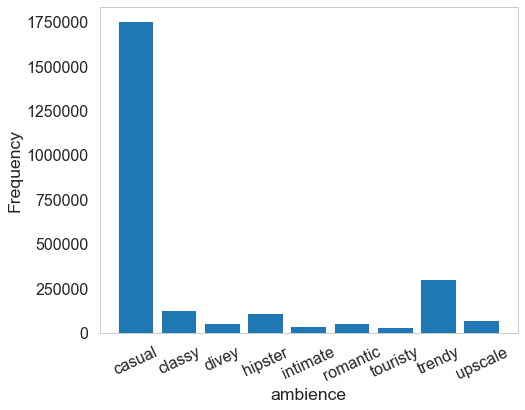

In [21]:
plt.figure(figsize=(7.5, 6))
count = []
ambience = ['casual', 'classy', 'divey', 'hipster', 'intimate', 'romantic', 'touristy', 'trendy', 'upscale']
for idx, i in enumerate(ambience):
    count.append(df_br.groupby(['attributes.Ambience.' + i]).size()[1])

plt.bar(range(len(ambience)), count);
plt.xticks(range(len(ambience)), ambience, rotation=25);
plt.ylabel("Frequency");
plt.xlabel("ambience");

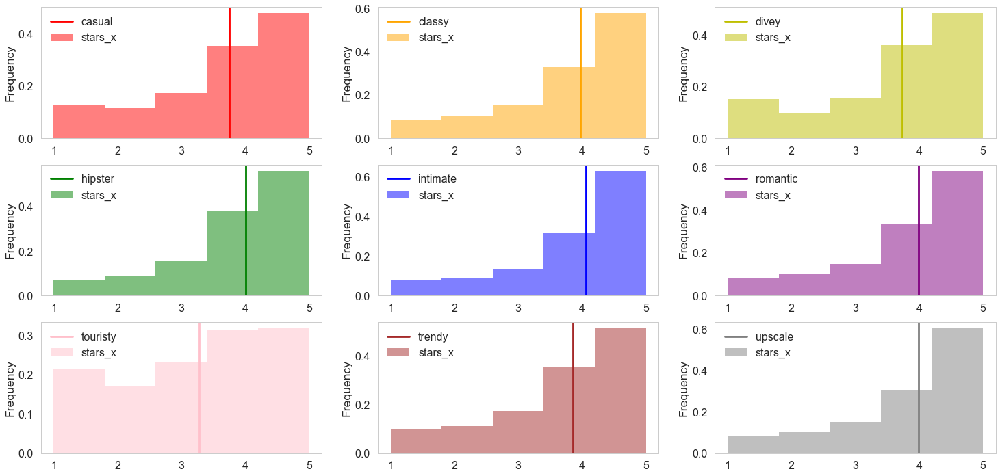

In [22]:
plt.figure(figsize=(25, 12))
plt.subplot(3, 3, 1)
df_br[df_br['attributes.Ambience.casual']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'r',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.casual']==True]['stars_x'].mean(), color='r', label='casual')
plt.legend(loc='upper left');

plt.subplot(3, 3, 2)
df_br[df_br['attributes.Ambience.classy']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'orange',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.classy']==True]['stars_x'].mean(), color='orange', label='classy')
plt.legend(loc='upper left');

plt.subplot(3, 3, 3)
df_br[df_br['attributes.Ambience.divey']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'y',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.divey']==True]['stars_x'].mean(), color='y', label='divey')
plt.legend(loc='upper left');

plt.subplot(3, 3, 4)
df_br[df_br['attributes.Ambience.hipster']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'g',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.hipster']==True]['stars_x'].mean(), color='g', label='hipster')
plt.legend(loc='upper left');

plt.subplot(3, 3, 5)
df_br[df_br['attributes.Ambience.intimate']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'b',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.intimate']==True]['stars_x'].mean(), color='b', label='intimate')
plt.legend(loc='upper left');

plt.subplot(3, 3, 6)
df_br[df_br['attributes.Ambience.romantic']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'purple',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.romantic']==True]['stars_x'].mean(), color='purple', label='romantic')
plt.legend(loc='upper left');

plt.subplot(3, 3, 7)
df_br[df_br['attributes.Ambience.touristy']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'pink',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.touristy']==True]['stars_x'].mean(), color='pink', label='touristy')
plt.legend(loc='upper left');

plt.subplot(3, 3, 8)
df_br[df_br['attributes.Ambience.trendy']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'brown',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.trendy']==True]['stars_x'].mean(), color='brown', label='trendy')
plt.legend(loc='upper left');

plt.subplot(3, 3, 9)
df_br[df_br['attributes.Ambience.upscale']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'grey',normed=True)
plt.axvline(x=df_br[df_br['attributes.Ambience.upscale']==True]['stars_x'].mean(), color='grey', label='upscale')
plt.legend(loc='upper left');

High level ambience might have fewer reviews but they also relate to higher stars. Most of the restaurants are casual and trendy, because high-end environment require more effort invested by restaurants.

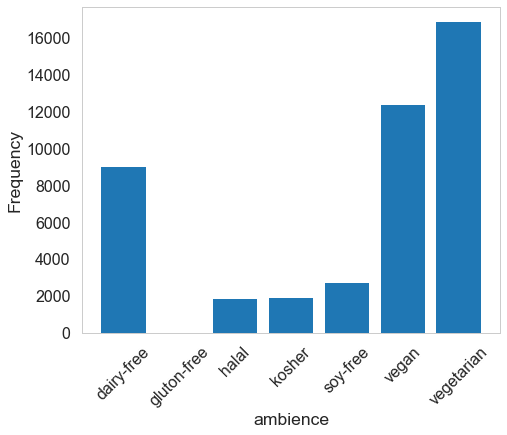

In [23]:
restrict = ['dairy-free', 'gluton-free', 'halal','kosher', 'soy-free', 'vegan', 'vegetarian']
count = []
plt.figure(figsize=(7.5, 6))
for idx, i in enumerate(restrict):
    if i == 'gluton-free':
        count.append(0)
    else:
        count.append(df_br.groupby(['attributes.DietaryRestrictions.' + i]).size()[1])

plt.bar(range(len(count)), count);
plt.xticks(range(len(count)), restrict, rotation=45);
plt.ylabel("Frequency");
plt.xlabel("ambience");

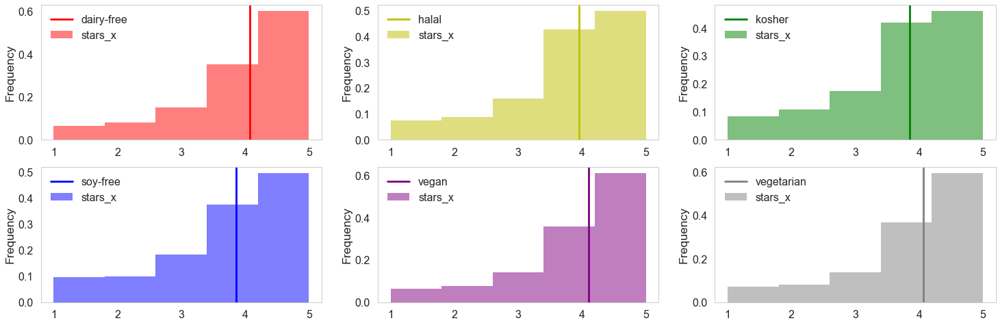

In [24]:
plt.figure(figsize=(25, 8))
plt.subplot(2, 3, 1)
df_br[df_br['attributes.DietaryRestrictions.dairy-free']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'r',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.dairy-free']==True]['stars_x'].mean(), color='r', label='dairy-free')
plt.legend(loc='upper left');

# plt.subplot(2, 4, 2)
# df_br[df_br['attributes.DietaryRestrictions.gluten-free']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'orange',normed=True)
# plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.gluten-free']==True]['stars_x'].mean(), color='orange', label='gluton-free')
# plt.legend(loc='upper left');

plt.subplot(2, 3, 2)
df_br[df_br['attributes.DietaryRestrictions.halal']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'y',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.halal']==True]['stars_x'].mean(), color='y', label='halal')
plt.legend(loc='upper left');

plt.subplot(2, 3, 3)
df_br[df_br['attributes.DietaryRestrictions.kosher']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'g',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.kosher']==True]['stars_x'].mean(), color='g', label='kosher')
plt.legend(loc='upper left');

plt.subplot(2, 3, 4)
df_br[df_br['attributes.DietaryRestrictions.soy-free']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'b',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.soy-free']==True]['stars_x'].mean(), color='b', label='soy-free')
plt.legend(loc='upper left');

plt.subplot(2, 3, 5)
df_br[df_br['attributes.DietaryRestrictions.vegan']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'purple',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.vegan']==True]['stars_x'].mean(), color='purple', label='vegan')
plt.legend(loc='upper left');

plt.subplot(2, 3, 6)
df_br[df_br['attributes.DietaryRestrictions.vegetarian']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'grey',normed=True)
plt.axvline(x=df_br[df_br['attributes.DietaryRestrictions.vegetarian']==True]['stars_x'].mean(), color='grey', label='vegetarian')
plt.legend(loc='upper left');

The distributions for food restriction vary but star seem not to be related to these varialbes.

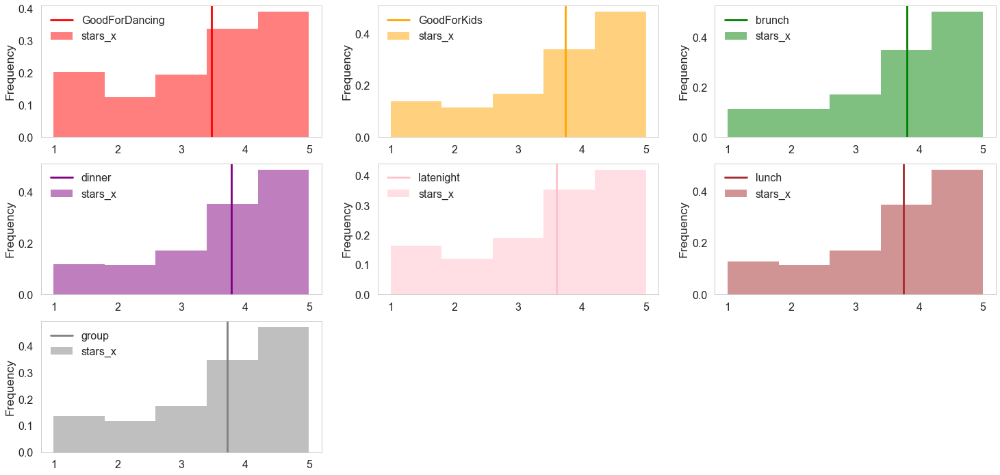

In [25]:
plt.figure(figsize=(25, 12))
plt.subplot(3, 3, 1)
df_br[df_br['attributes.GoodForDancing']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'r',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForDancing']==True]['stars_x'].mean(), color='r', label='GoodForDancing')
plt.legend(loc='upper left');

plt.subplot(3, 3, 2)
df_br[df_br['attributes.GoodForKids']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'orange',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForKids']==True]['stars_x'].mean(), color='orange', label='GoodForKids')
plt.legend(loc='upper left');

# plt.subplot(3, 3, 3)
# df_br[df_br['attributes.GoodForMeal.breakfast']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'y',normed=True)
# plt.axvline(x=df_br[df_br['attributes.GoodForMeal.breakfast']==True]['stars_x'].mean(), color='y', label='breakfast')
# plt.legend(loc='upper left');

plt.subplot(3, 3, 3)
df_br[df_br['attributes.GoodForMeal.brunch']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'g',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForMeal.brunch']==True]['stars_x'].mean(), color='g', label='brunch')
plt.legend(loc='upper left');

# plt.subplot(2, 5, 5)
# df_br[df_br['attributes.GoodForMeal.dessert']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'b',normed=True)
# plt.axvline(x=df_br[df_br['attributes.GoodForMeal.dessert']==True]['stars_x'].mean(), color='b', label='dessert')
# plt.legend(loc='upper left');

plt.subplot(3, 3, 4)
df_br[df_br['attributes.GoodForMeal.dinner']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'purple',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForMeal.dinner']==True]['stars_x'].mean(), color='purple', label='dinner')
plt.legend(loc='upper left');

plt.subplot(3, 3, 5)
df_br[df_br['attributes.GoodForMeal.latenight']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'pink',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForMeal.latenight']==True]['stars_x'].mean(), color='pink', label='latenight')
plt.legend(loc='upper left');

plt.subplot(3, 3, 6)
df_br[df_br['attributes.GoodForMeal.lunch']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'brown',normed=True)
plt.axvline(x=df_br[df_br['attributes.GoodForMeal.lunch']==True]['stars_x'].mean(), color='brown', label='lunch')
plt.legend(loc='upper left');

plt.subplot(3, 3, 7)
df_br[df_br['attributes.RestaurantsGoodForGroups']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'grey',normed=True)
plt.axvline(x=df_br[df_br['attributes.RestaurantsGoodForGroups']==True]['stars_x'].mean(), color='grey', label='group')
plt.legend(loc='upper left');

Average score for restaurants good for dancing is relatively lower compared to other type. The reason might be they are usually indicated as noisy bar/pubs, which corresponds with our result in ambience.

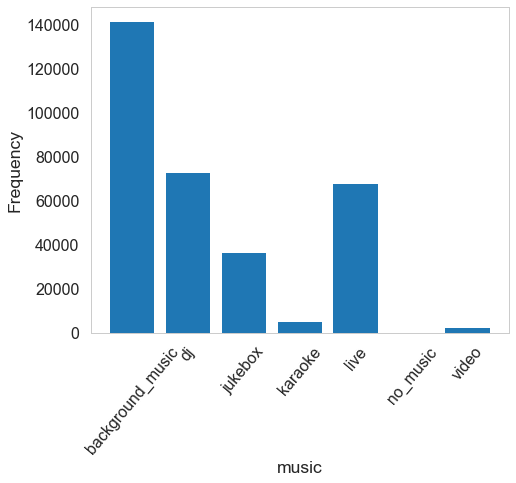

In [26]:
plt.figure(figsize=(7.5, 6))
music = ['background_music', 'dj', 'jukebox','karaoke', 'live', 'no_music', 'video']
count = []

for idx, i in enumerate(music):
    if i == 'no_music':
        count.append(0)
    else:
        count.append(df_br.groupby(['attributes.Music.' + i]).size()[1])

plt.bar(range(len(count)), count);
plt.xticks(range(len(count)), music, rotation=50);
plt.ylabel("Frequency");
plt.xlabel("music");

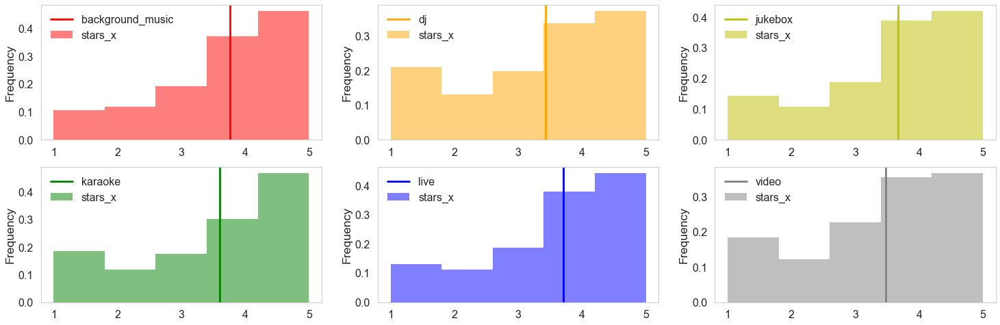

In [27]:
plt.figure(figsize=(25, 8))
plt.subplot(2, 3, 1)
df_br[df_br['attributes.Music.background_music']==True]['stars_x'].plot.hist(alpha=0.5, bins = 5, color = 'r',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.background_music']==True]['stars_x'].mean(), color='r', label='background_music')
plt.legend(loc='upper left');

plt.subplot(2, 3, 2)
df_br[df_br['attributes.Music.dj']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'orange',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.dj']==True]['stars_x'].mean(), color='orange', label='dj')
plt.legend(loc='upper left');

plt.subplot(2, 3, 3)
df_br[df_br['attributes.Music.jukebox']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'y',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.jukebox']==True]['stars_x'].mean(), color='y', label='jukebox')
plt.legend(loc='upper left');

plt.subplot(2, 3, 4)
df_br[df_br['attributes.Music.karaoke']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'g',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.karaoke']==True]['stars_x'].mean(), color='g', label='karaoke')
plt.legend(loc='upper left');

plt.subplot(2, 3, 5)
df_br[df_br['attributes.Music.live']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'b',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.live']==True]['stars_x'].mean(), color='b', label='live')
plt.legend(loc='upper left');

# plt.subplot(2, 3, 6)
# df_br[df_br['attributes.Music.no_music']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'purple',normed=True)
# plt.axvline(x=df_br[df_br['attributes.Music.no_music']==True]['stars_x'].mean(), color='purple', label='no music')
# plt.legend(loc='upper left');

plt.subplot(2, 3, 6)
df_br[df_br['attributes.Music.video']==True]['stars_x'].plot.hist(alpha=0.5, bins=5, color = 'grey',normed=True)
plt.axvline(x=df_br[df_br['attributes.Music.video']==True]['stars_x'].mean(), color='grey', label='video')
plt.legend(loc='upper left');

Similar with results in "ambience" and "good for", upscale enviroment with live music have higher stars than those with viedo, dj or karaoke, which refers to noisy and crowded enviroment.

In the following, we select some interesting attributes that might indicate various stars from the corresponding boxplot.

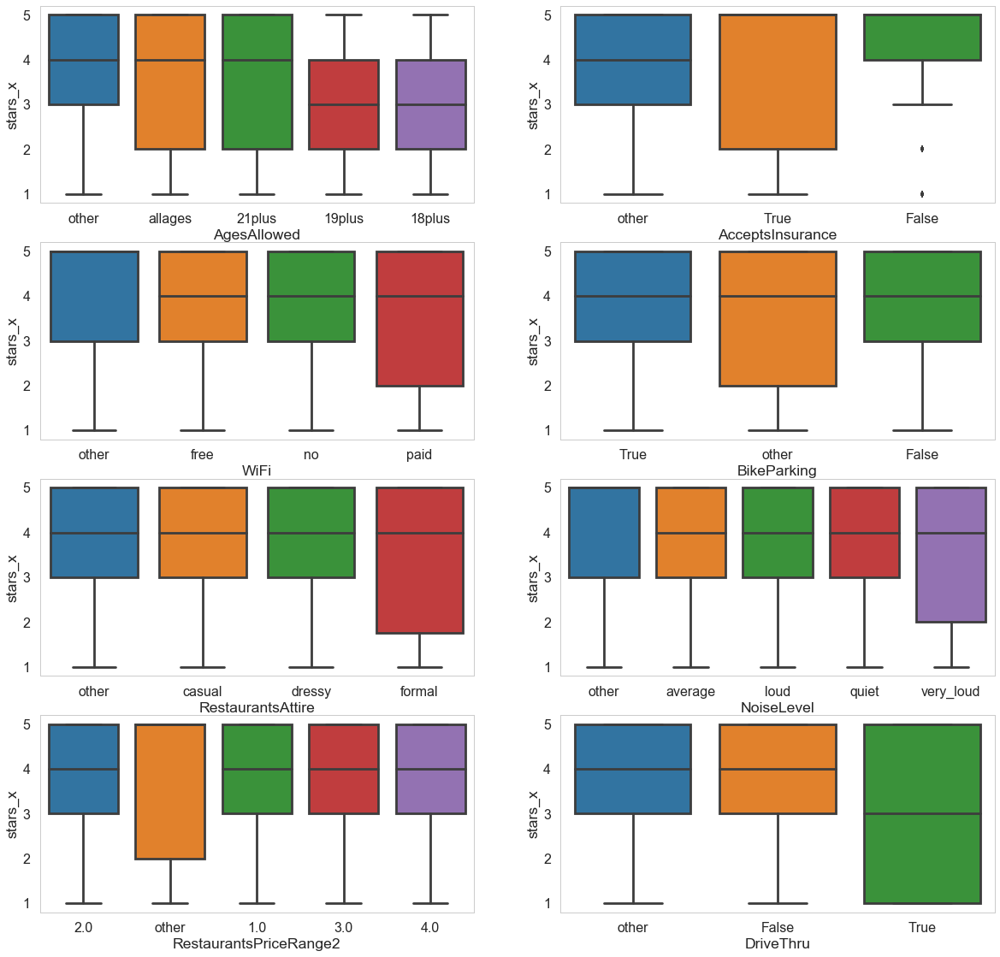

In [28]:
plt.figure(figsize=(20, 50))
plt.subplot(10, 2, 1)
df_br['AgesAllowed'] = df_br['attributes.AgesAllowed'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='AgesAllowed', y="stars_x", data=df_br)

plt.subplot(10, 2, 2)
df_br['AcceptsInsurance'] = df_br['attributes.AcceptsInsurance'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='AcceptsInsurance', y="stars_x", data=df_br)

plt.subplot(10, 2, 3)
df_br['WiFi'] = df_br['attributes.WiFi'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='WiFi', y="stars_x", data=df_br)

plt.subplot(10, 2, 4)
df_br['BikeParking'] = df_br['attributes.BikeParking'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='BikeParking', y="stars_x", data=df_br)

# plt.subplot(10, 2, 5)
# df_br['Smoking'] = df_br['attributes.Smoking'].apply(lambda x: 'other' if pd.isnull(x) else x)
# ax = sns.boxplot(x='Smoking', y="stars_x", data=df_br)

plt.subplot(10, 2, 5)
df_br['RestaurantsAttire'] = df_br['attributes.RestaurantsAttire'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='RestaurantsAttire', y="stars_x", data=df_br)

plt.subplot(10, 2, 6)
df_br['NoiseLevel'] = df_br['attributes.NoiseLevel'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='NoiseLevel', y="stars_x", data=df_br)

# plt.subplot(10, 2, 8)
# df_br['RestaurantsDelivery'] = df_br['attributes.RestaurantsDelivery'].apply(lambda x: 'other' if pd.isnull(x) else x)
# ax = sns.boxplot(x='RestaurantsDelivery', y="stars_x", data=df_br)

# plt.subplot(10, 2, 9)
# df_br['HasTV'] = df_br['attributes.HasTV'].apply(lambda x: 'other' if pd.isnull(x) else x)
# ax = sns.boxplot(x='HasTV', y="stars_x", data=df_br)

plt.subplot(10, 2, 7)
df_br['RestaurantsPriceRange2'] = df_br['attributes.RestaurantsPriceRange2'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='RestaurantsPriceRange2', y="stars_x", data=df_br)

plt.subplot(10, 2, 8)
df_br['DriveThru'] = df_br['attributes.DriveThru'].apply(lambda x: 'other' if pd.isnull(x) else x)
ax = sns.boxplot(x='DriveThru', y="stars_x", data=df_br)

# plt.subplot(10, 2, 12)
# df_br['HappyHour'] = df_br['attributes.HappyHour'].apply(lambda x: 'other' if pd.isnull(x) else x)
# ax = sns.boxplot(x='HappyHour', y="stars_x", data=df_br)

# plt.subplot(10, 2, 13)
# df_br['Open24Hours'] = df_br['attributes.Open24Hours'].apply(lambda x: 'other' if pd.isnull(x) else x)
# ax = sns.boxplot(x='Open24Hours', y="stars_x", data=df_br)

The pattern for stars distribution is different from now (open) and past (closed). Users are more critique (lower gap between five levels) at present.

## Exploration of User Table

In [29]:
# explore user table

## inner join user (dfu) & stars (datar)
df_ur = datar.merge(dfu, left_on="user_id", right_on="user_id")
# df_ur.head()

We analyze the users' information by merging user table and data_review table. We try to find relationships between star and users' properties of this merged table with shape (4166778, 24).

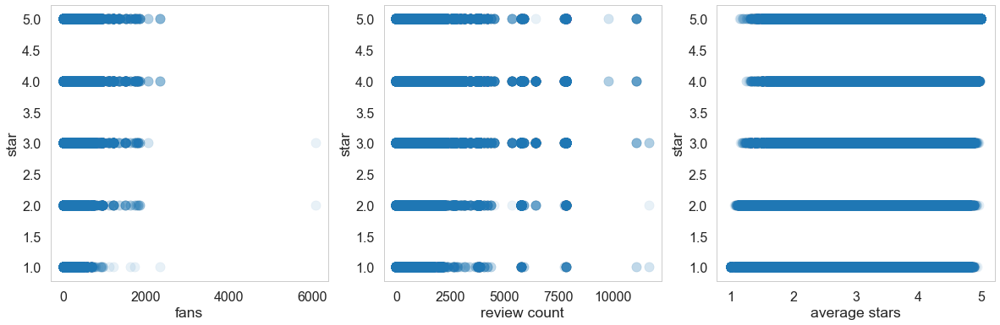

In [30]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 3, 1)
plt.scatter(df_ur['fans'], df_ur['stars'],alpha = 0.1);
plt.xlabel('fans')
plt.ylabel('star')

plt.subplot(1, 3, 2)
plt.scatter(df_ur['review_count'], df_ur['stars'],alpha = 0.1);
plt.xlabel('review count')
plt.ylabel('star')

plt.subplot(1, 3, 3)
plt.scatter(df_ur['average_stars'], df_ur['stars'],alpha = 0.1);
plt.xlabel('average stars')
plt.ylabel('star');

1. stars w.r.t. fans / review counts:
    Except for some outliners, users with more fans are more likely to give higher stars. The reason might be users with more followers are food bloggers, who is passionate about finding good restaurants. This phenonmen is less apparent for review counts.
    
2. stars w.r.t. users average_star:
    Users giving higher scores on average tend to have a positive review for each review.

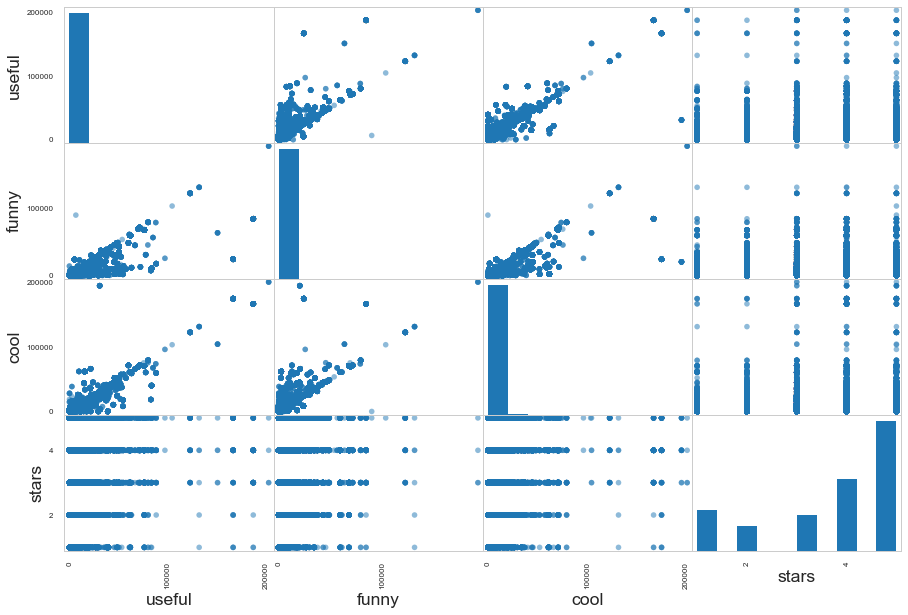

In [31]:
fig, ax = plt.subplots(1,1, figsize=(15,10))
axes = scatter_matrix(df_ur[['useful', 'funny', 'cool', 'stars']], alpha=0.5, diagonal='hist', ax=ax)
plt.show();

Higher score comments have more probability to be complimented as useful/funny/cool. Also, there are positive relationship between useful/funny/cool reviews. This may refers active users who prefer to comment on other's reviews.

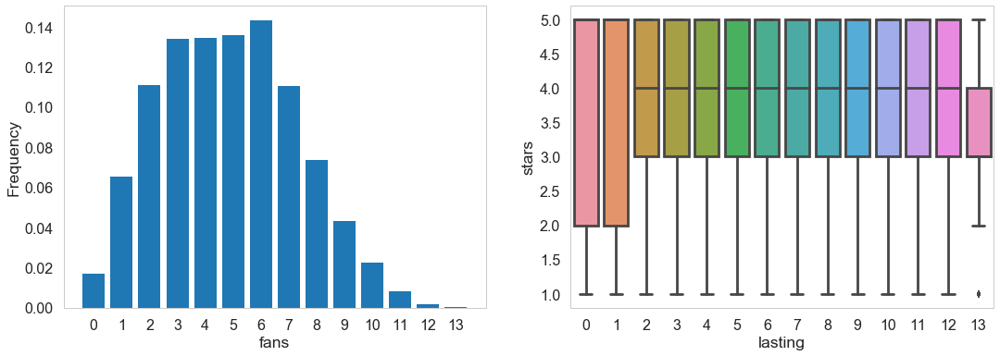

In [33]:
plt.figure(figsize=(18, 6))
plt.subplot(1, 2, 1)
df_ur['lasting'] = df_ur['yelping_since'].apply(lambda x: 2017 - int(x[0:4]))
plot_discrete_hist(df_ur['lasting'].values, normalize=True);
plt.xlabel('fans');
plt.ylabel('Frequency');

plt.subplot(1, 2, 2)
sns.boxplot(x='lasting', y='stars', data=df_ur);

Most of users have utilized yelp for 2 - 7 years. Very old and loyalty yelp users tend to give higher and concentratated scores than new users (0-1 year). 

In [34]:
# fig, ax = plt.subplots(1,1, figsize=(30,30))
# axes = scatter_matrix(df_ur[['compliment_cool', 'compliment_cute', 'compliment_funny', 'compliment_hot', 'compliment_plain', 'stars']], alpha=0.5, diagonal='hist', ax=ax)
# plt.show()

We select some attributes of complement for analysis while others might have less obvious patterns with other variables. We could see there are positive relationships between these variables.

In [35]:
year_dict = {}
star_dict = {}
import ast

for idx, subset in df_ur.groupby('user_id'):
    if subset['elite'].any() != None:
        year_ls = ast.literal_eval(subset.iloc[0]['elite'])
        for year in year_ls:
            if year in year_dict:
                year_dict[year] += 1
                star_dict[year] += subset['stars'].mean()
            else:
                year_dict[year] = 1
                star_dict[year] = subset['stars'].mean()

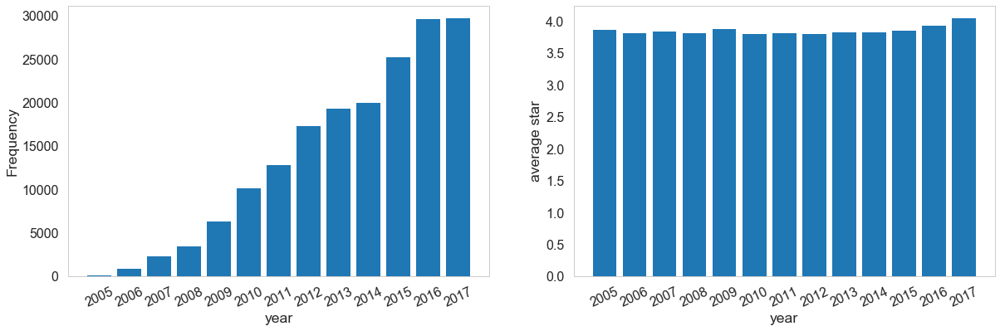

In [36]:
plt.figure(figsize=(20, 6))
plt.subplot(1, 2, 1)
plt.bar(range(len(year_dict)), sorted(year_dict.values()));
plt.xticks(range(len(year_dict)), sorted(year_dict.keys()), rotation=25);
plt.ylabel("Frequency");
plt.xlabel("year");

plt.subplot(1, 2, 2)
average_star = []

for idx, year in enumerate(year_dict):
    average_star.append(star_dict[year]/year_dict[year])
    
plt.bar(range(len(average_star)), average_star);
plt.xticks(range(len(average_star)), range(2005, 2018), rotation=25);
plt.ylabel("average star");
plt.xlabel("year");

The number of elite users is increasing, but the average scores (one user per count) given by them don't vary a lot.

# Collaborative Filtering

## Introduction

Collaborative filtering predicts ratings based on past user behavior, which is characterized by previous ratings in this case. To perform collaborative filtering, we only need to use restaurant ratings from each user. We acquire data for this part by keeping 3 features in `review` table, `user_id`, `business_id`, and `stars`.

Collaborative filtering includes 2 primary areas, **neighborhood methods** and **latent factor models**. In this part, we tested several baseline models, neighborhood methods and latent factor models. We implemented some baseline models and latent factor models from scratch (by using `numpy` and `scipy`'s linear algebra toolkits instead of well-established recommender system packages); we implemented other algorithms by wrapping around methods in a recommender system python package, [`scikit-surprise`](http://surpriselib.com/). Each algorithm we implemented by using the [`scikit-surprise`](http://surpriselib.com/) package is indicated by a * after its name.

In [1]:
import sys
import traceback
import pandas as pd
import numpy as np
import time
from copy import deepcopy

from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from scipy import sparse

import pickle

from IPython.display import display, HTML, Markdown

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

from surprise import Dataset, Reader
from surprise import NormalPredictor, BaselineOnly, SVD, SVDpp, NMF, \
SlopeOne, CoClustering, KNNBasic, KNNWithMeans, KNNBaseline

from recommender import plot_cm, get_results, show_results, IO, \
show_summaries, get_base_predictions, get_multi_base_predictions
from recommender import ModeClassifier, BaselineMean, BaselineRegression, ALS1, ALS2, RS_surprise, RS_ensemble

In [2]:
# Load data

city = 'Champaign'
data_dir = 'data/{}/'.format(city)

dfb = pd.read_pickle(data_dir + 'business.pkl')
dfr = pd.read_pickle(data_dir + 'review.pkl')
dfu = pd.read_pickle(data_dir + 'user.pkl')
datar = pd.read_pickle(data_dir + 'data_review.pkl')

sizes = [datar.shape[0], dfb.shape[0], dfu.shape[0]]

display(Markdown('Here, we use Champaign dataset ({} reviews, {} restaurants, {} users) for demo purpose.'.\
                format(sizes[0], sizes[1], sizes[2])));

Here, we use Champaign dataset (20571 reviews, 878 restaurants, 8451 users) for demo purpose.

We randomly split the reviews into 3 sets: a training set (60%), a cross-validation set (16%) and a test set (24%). We train base estimators on the training set, and test on the test set; cross-validation set is used for the training of ensemble estimators later.

For each model, we report root mean square error (RMSE) and $R^2$ score on training set and test set. To gain some insight on model's performance on different ratings, we round predicted ratings, where predicted ratings below 1 are rounded to 1 and predicted ratings above 5 are round to 5, and plot the confusion matrix of training set and test set (in a format used in [a related work](https://github.com/kevin11h/YelpDatasetChallengeDataScienceAndMachineLearningUCSD/blob/master/Yelp%20Predictive%20Analytics.ipynb)).
<br><br><br>

In [3]:
# Split the dataset into a training set, a cross-validation set and a test set

X_train, X_test, y_train, y_test = train_test_split(datar[['user_id', 'business_id']].values, datar['stars'].values, \
                                                   test_size=0.4, random_state=0)
X_cv, X_test, y_cv, y_test = train_test_split(X_test, y_test, test_size=0.6, random_state=0)

data_split = [X_train, y_train, X_test, y_test, X_cv, y_cv]

## Baseline models

We first built some baseline models, including **mode estimator**, **normal predictor\***, **baseline (mean)**, **baseline (regression)**, and **baseline (ALS)\***.

### Mode estimator

Inspired by the fact that most ratings are 5 from EDA part, we build a mode estimator, which predicts every rating as the mode value of all ratings.

In [4]:
class ModeClassifier:
    def __init__(self, mode=5, classification=None):
        self.mode = mode
        self.fitted = True
        self.time_fitting = []
        self.classification = classification
        self.cv_r2 = None
        
    def fit(self, X, y):
        t0 = time.time()
        self.time_fitting.append(time.time() - t0)
        return self
    
    def predict(self, X, classification=None):
        return self.mode * np.ones(len(X))
    
    def score(self, X, y, classification=None, scoring='r2'):
        if classification is None:
            classification = self.classification
        if not classification:
            if scoring == 'r2':
                return r2_score(y, self.predict(X, classification))
            elif scoring == 'mse':
                return mean_squared_error(y, self.predict(X, classification))
            elif scoring == 'rmse':
                return np.sqrt(mean_squared_error(y, self.predict(X, classification)))
            else:
                raise NotImplementedError('`scoring` should be either "r2", "mse", or "rmse".')
        else:
            return accuracy_score(y, self.predict(X, classification))

In [5]:
es = ModeClassifier().fit(X_train, y_train)
model_name = 'Mode estimator'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0,1.9995,2.0258,-0.9501,-0.95


As we mentioned earlier, we could plot a confusion matrix to gain some insight on model's performance on different ratings by rounding the predicted ratings, setting predictions below 1 to 1, above 5 to 5, and using a format used in [a related work](https://github.com/kevin11h/YelpDatasetChallengeDataScienceAndMachineLearningUCSD/blob/master/Yelp%20Predictive%20Analytics.ipynb) (the same below).

We plot the confusion matrix for training set on the left, and that for test set on the right (the same below).

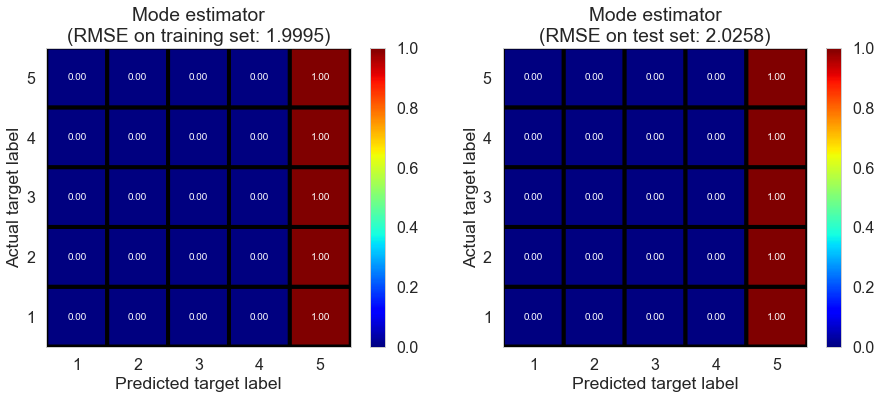

In [6]:
show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The performance of mode estimator is poor as indicated by negative $R^2$, which is not surprising.
<br><br><br>

### Normal predictor*
We implemented this algorithm by wrapping around [`NormalPredictor`](http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.random_pred.NormalPredictor) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.random_pred.NormalPredictor),
>**Normal predictor\*** assumes the distribution of the training set to be normal, which doesn't hold in this case. The prediction $\hat{r}_{ui}$ is generated from a normal distribution $\mathcal{N}(\hat{\mu}, \hat{\sigma}^2)$ where $\hat{\mu}$ and $\hat{\sigma}$ are estimated from the training data using the Maximum Likelihood Estimation:
>
>$$\hat{\mu} = \frac{1}{|R_{train}|} \sum_{r_{ui} \in R_{train}} r_{ui}$$
>
>$$\hat{\sigma} = \sqrt{\sum_{r_{ui} \in R_{train}}\frac{(r_{ui} - \hat{\mu})^2}{|R_{train}|}}$$


The result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Normal predictor*,0.051,1.8685,1.8784,-0.7029,-0.6767


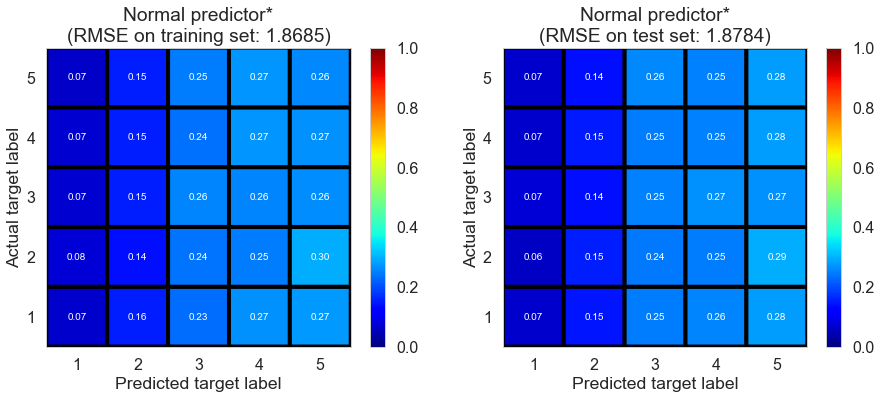

In [7]:
es = RS_surprise(NormalPredictor()).fit(X_train, y_train)
model_name = 'Normal predictor*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The performance of normal predictor is also very poor since rating do NOT satisfy normal distribution (as shown in EDA).
<br><br><br>

### Baseline (mean)

Here we assume much of variation in observed ratings comes from effects associated with either users or items, known as biases (as assumed in most [latent factor models](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf)). We estimate the ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i$$

In this model, we estimate biases with sample averages:

$$\hat{b}_u = \bar{r}_u - \mu$$

$$\hat{b}_i = \bar{r}_i - \mu$$

where $\bar{r}_u$ and $\bar{r}_i$ represent average ratings of user $u$ and restaurant $i$ repsectively, $b_u$ and $b_i$ represent the biases of user $u$ and restaurant $i$ repsectively from some intercept parameter $\mu$, which is estimated by the whole sample average in this case.

When we make predictions, if user $u$ is unknown, the bias $b_u$ is assumed to be zero; if the restaurant $i$ is unknown, the bias $b_i$ is assumed to be zero.

In [8]:
class BaselineMean(BaseEstimator):
    def __init__(self, classification=False):
        self.fitted = False
        self.classification = classification
        self.time_fitting = []
        self.time_predict = []
        self.cv_r2 = None
    
    def _fit_id2index(self, X):
        self._user_id_array = np.unique(X[:, 0])
        self._user_id_dict = {self._user_id_array[i]:i for i in range(len(self._user_id_array))}
        self._bus_id_array = np.unique(X[:, 1])
        self._bus_id_dict = {self._bus_id_array[i]:i for i in range(len(self._bus_id_array))}
        self.n_u = len(self._user_id_array)
        self.n_m = len(self._bus_id_array)
        self.n_bp = self.n_u + self.n_m + 1
        return self
        
    def _transform_id2index(self, X):
        X = deepcopy(X)
        X[:, 0] = np.array([self._user_id_dict.get(x, -1) for x in X[:, 0]])
        X[:, 1] = np.array([self._bus_id_dict.get(x, -1) for x in X[:, 1]])
        return X
    
    def _fit_transform_id2index(self, X):
        self._fit_id2index(X)
        X = self._transform_id2index(X)
        return X
    
    def _fit_baseline_mean(self, X, y):
        self.mean_global = np.mean(y)
        self.df = pd.DataFrame(np.concatenate((X, y.reshape(-1, 1)), axis=1))
        self.mean_user_bias = self.df[[0, 2]].groupby(0, as_index=False).mean().sort_values(by=0)[2].values - self.mean_global
        self.mean_bus_bias = self.df[[1, 2]].groupby(1, as_index=False).mean().sort_values(by=1)[2].values - self.mean_global
        return self
    
    def fit(self, X, y):
        t0 = time.time()
        X = self._fit_transform_id2index(X)
        self._fit_baseline_mean(X, y)
        self.fitted = True
        self.time_fitting.append(time.time() - t0)
        return self
    
    def _predict_no_missing(self, X):
        if len(X) == 0:
            return np.array([])
        def _predict_x(x_i):
            return self.mean_global + self.mean_user_bias[x_i[0]] + self.mean_bus_bias[x_i[1]]
        y_pred = np.apply_along_axis(_predict_x, 1, X)
        return y_pred
    
    def _predict_user_missing(self, X):
        if len(X) == 0:
            return np.array([])
        def _predict_x(x_i):
            return self.mean_global + self.mean_bus_bias[x_i[1]]
        y_pred = np.apply_along_axis(_predict_x, 1, X)
        return y_pred
    
    def _predict_bus_missing(self, X):
        if len(X) == 0:
            return np.array([])
        def _predict_x(x_i):
            return self.mean_global + self.mean_user_bias[x_i[0]]
        y_pred = np.apply_along_axis(_predict_x, 1, X)
        return y_pred
        
    def _predict_all_missing(self, X):
        if len(X) == 0:
            return np.array([])
        return self.mean_global * np.ones(len(X))
    
    def _predict_baseline(self, X):
        y_pred = np.zeros(len(X))
        no_missing = np.logical_and(X[:, 0] != -1, X[:, 1] != -1)
        user_missing = np.logical_and(X[:, 0] == -1, X[:, 1] != -1)
        bus_missing = np.logical_and(X[:, 0] != -1, X[:, 1] == -1)
        all_missing = np.logical_and(X[:, 0] == -1, X[:, 1] == -1)
        y_pred[no_missing] = self._predict_no_missing(X[no_missing])
        y_pred[user_missing] = self._predict_user_missing(X[user_missing])
        y_pred[bus_missing] = self._predict_bus_missing(X[bus_missing])
        y_pred[all_missing] = self._predict_all_missing(X[all_missing])
        return y_pred
    
    def _predict_regression(self, X):
        X = self._transform_id2index(X)
        return self._predict_baseline(X)
    
    def _predict_classification(self, X):
        y = self._predict_regression(X)
        y = np.round(y)
        y[y < 1] = 1
        y[y > 5] = 5
        return y.astype(int)
    
    def predict(self, X, classification=None):
        t0 = time.time()
        if not self.fitted:
            raise ValueError('Estimator not fitted.')
        if classification is None:
            classification = self.classification
        if not classification:
            results = self._predict_regression(X)
        else:
            results = self._predict_classification(X)
        self.time_predict.append(time.time() - t0)
        return results
        
    
    def score(self, X, y, classification=None, scoring='r2'):
        if classification is None:
            classification = self.classification
        if not classification:
            if scoring == 'r2':
                return r2_score(y, self.predict(X, classification))
            elif scoring == 'mse':
                return mean_squared_error(y, self.predict(X, classification))
            elif scoring == 'rmse':
                return np.sqrt(mean_squared_error(y, self.predict(X, classification)))
            else:
                raise NotImplementedError('`scoring` should be either "r2", "mse", or "rmse".')
        else:
            return accuracy_score(y, self.predict(X, classification))

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Baseline (mean),0.021,0.9485,1.4648,0.5612,-0.0195


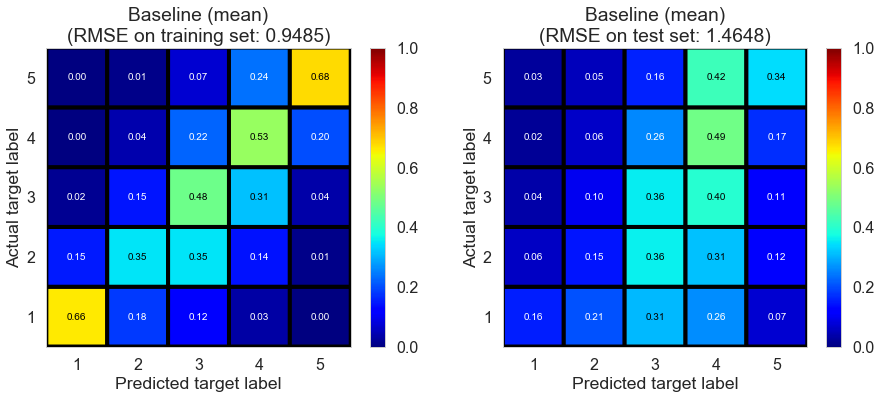

In [9]:
es = BaselineMean().fit(X_train, y_train)
model_name = 'Baseline (mean)'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

Baseline (mean) performs well on training set; however, it suffers from overfitting as indicated by negative $R^2$ on test set, which is presumably due to the fact that there is no regularization in this model.
<br><br><br>

### Baseline (regression)

Similarly, we estimate the ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i$$

In this model, we estimate biases of users and restaurants using regularized regression.  
Specifically, we minimize the following regularized squared error:

$$\sum_{r_{ui} \in R_{train}} \left(r_{ui} - (\mu + b_u + b_i)\right)^2 +
\lambda \left(b_u^2 + b_i^2 \right).$$

We perform one-hot encoding on `user_id` and `business_id`, and store the corresponding design matrix as a [sparse matrix](https://docs.scipy.org/doc/scipy/reference/sparse.html). And we solve the Ridge regression algorithm using [LSMR](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.sparse.linalg.lsmr.html).

When we make predictions, if user $u$ is unknown, the bias $b_u$ is assumed to be zero; if the restaurant $i$ is unknown, the bias $b_i$ is assumed to be zero.

In [10]:
class BaselineRegression(BaselineMean):
    def __init__(self, alpha=2, classification=False):
        super().__init__(classification)
        self.alpha = alpha
        
    def _sparse_matrix_baseline_regression(self, X, cols=[0, 1]):
        I = np.concatenate([np.arange(len(X)) for _ in range(len(cols) + 1)]).astype(int)
        J = np.zeros(len(X), dtype=int)
        if 0 in cols:
            J = np.concatenate((J, X[:, 0] + 1)).astype(int)
        if 1 in cols:
            J = np.concatenate((J, X[:, 1] + 1 + self.n_u)).astype(int)
        V = np.ones((len(cols) + 1) * len(X))
        A = sparse.coo_matrix((V, (I, J)), shape=(len(X), self.n_bp))
        return A
    
    def _fit_baseline_regression(self, X, y):
        A = self._sparse_matrix_baseline_regression(X, cols=[0, 1])
        self.params_base = sparse.linalg.lsmr(A, y, damp=self.alpha)[0]
        return self
    
    def fit(self, X, y):
        t0 = time.time()
        X = self._fit_transform_id2index(X)
        self._fit_baseline_regression(X, y)
        self.fitted = True
        self.time_fitting.append(time.time() - t0)
        return self
    
    def _predict_no_missing(self, X):
        if len(X) == 0:
            return np.array([])
        A = self._sparse_matrix_baseline_regression(X, cols=[0, 1])
        return A.dot(self.params_base)
    
    def _predict_user_missing(self, X):
        if len(X) == 0:
            return np.array([])
        A = self._sparse_matrix_baseline_regression(X, cols=[1])
        return A.dot(self.params_base)
    
    def _predict_bus_missing(self, X):
        if len(X) == 0:
            return np.array([])
        A = self._sparse_matrix_baseline_regression(X, cols=[0])
        return A.dot(self.params_base)
    
    def _predict_all_missing(self, X):
        if len(X) == 0:
            return np.array([])
        return self.params_base[0] * np.ones(len(X))

We performed 2 rounds of cross-validation to determine the best regularization term $\lambda$.

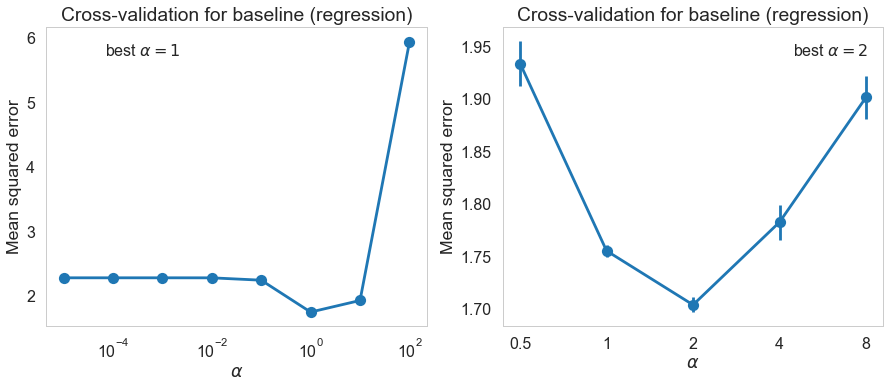

In [11]:
alphas1 = [10**(i-5) for i in range(8)]
gs1 = GridSearchCV(BaselineRegression(classification=False), param_grid={'alpha':alphas1}, scoring='neg_mean_squared_error', \
                  cv=3, return_train_score=True).fit(X_train, y_train)
best_alpha1 = alphas1[np.argmax(gs1.cv_results_['mean_test_score'])]

alphas2 = [0.5, 1, 2, 4, 8]
gs2 = GridSearchCV(BaselineRegression(classification=False), param_grid={'alpha':alphas2}, scoring='neg_mean_squared_error', \
                  cv=3, return_train_score=True).fit(X_train, y_train)
best_alpha2 = alphas2[np.argmax(gs2.cv_results_['mean_test_score'])]

plt.figure(figsize=(15, 5.5))
plt.subplot(1, 2, 1)
plt.errorbar(alphas1, -gs1.cv_results_['mean_test_score'], gs1.cv_results_['std_test_score'], fmt='o-');
plt.semilogx(alphas1, -gs1.cv_results_['mean_test_score'], alpha=0, label=r'best $\alpha = {}$'.format(best_alpha1));
plt.xlabel(r'$\alpha$');
plt.ylabel('Mean squared error');
plt.legend();
plt.title('Cross-validation for baseline (regression)');

plt.subplot(1, 2, 2)
plt.errorbar(alphas2, -gs2.cv_results_['mean_test_score'], gs2.cv_results_['std_test_score'], fmt='o-');
plt.semilogx(alphas2, -gs2.cv_results_['mean_test_score'], alpha=0, label=r'best $\alpha = {}$'.format(best_alpha2));
plt.xlabel(r'$\alpha$');
plt.ylabel('Mean squared error');
plt.xticks(alphas2, alphas2);
plt.legend();
plt.title('Cross-validation for baseline (regression)');

We can test the performance of baseline (regression) using the best regularization parameter determined by the cross-validation.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Baseline (regression),0.027,1.0481,1.3032,0.4642,0.193


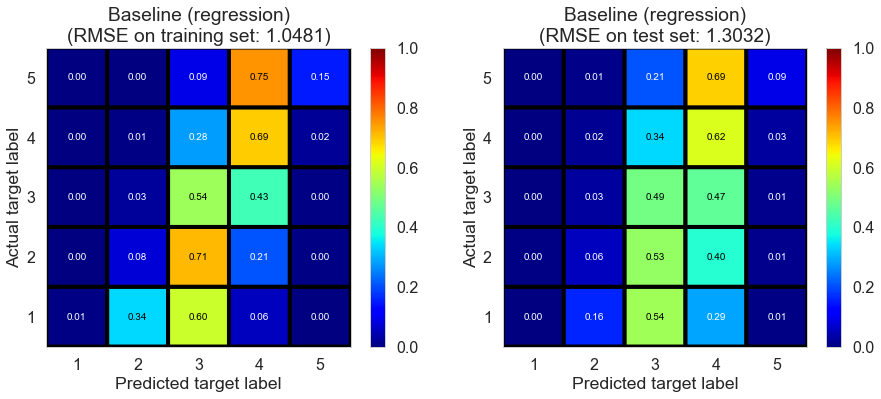

In [12]:
es = BaselineRegression(alpha=2).fit(X_train, y_train)
model_name = 'Baseline (regression)'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

As we can see, baseline (regression) predicts most ratings to be 3 or 4. The performance of this model is significantly better than previous baseline models, as indicated by larger $R^2$.
<br><br><br>

### Baseline (ALS)*

We implemented this algorithm by wrapping around [`BaselineOnly`](http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly) in the [`scikit-surprise`](http://surpriselib.com/) package.

Here we also estimate ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i$$

And we minimize the same regularized squared error:

$$\sum_{r_{ui} \in R_{train}} \left(r_{ui} - (\mu + b_u + b_i)\right)^2 +
\lambda \left(b_u^2 + b_i^2 \right).$$

Rather than applying one-hot encoding on `user_id` and `business_id` simultaneously, alternating least squares (ALS), which is the [default algorithm](http://surprise.readthedocs.io/en/stable/prediction_algorithms.html#baseline-estimates-configuration) used in [`BaselineOnly`](http://surprise.readthedocs.io/en/stable/basic_algorithms.html#surprise.prediction_algorithms.baseline_only.BaselineOnly), is used here for minimizing the regularized squared error.

When we make predictions, if user $u$ is unknown, the bias $b_u$ is assumed to be zero; if the restaurant $i$ is unknown, the bias $b_i$ is assumed to be zero.

We use the default parameters, and the result is shown below.

Estimating biases using als...


model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Baseline (ALS)*,0.061,1.1981,1.32,0.2998,0.1721


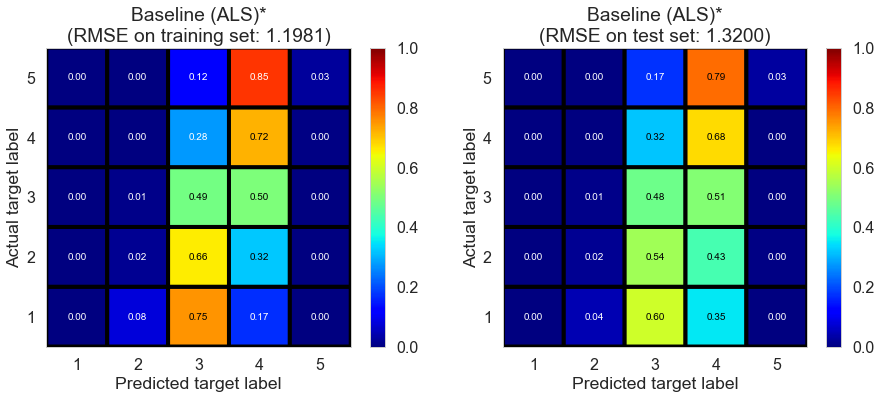

In [13]:
es = RS_surprise(BaselineOnly()).fit(X_train, y_train)
model_name = 'Baseline (ALS)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The performance on the test set is similar with baseline (regression), while it is worse on the training set, indicating the variance of the model is similar but the bias is higher.
<br><br><br>

## Latent factor models

Here we tried several matrix factorization-based algorithms, including several different implementations of singular value decomposition ([SVD](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf)) and non-negative matrix factorization ([NMF](http://ieeexplore.ieee.org/document/6748996/)).

### SVD-ALS1

We first implemented sigular value decomposition via alternating least squares ([SVD-ALS](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf)).

We estimate ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i + q_i^Tp_u$$

where $p_u$ represents the latent factors associated with user $u$, and $q_i$ represents the latent factors associated with restaurant $i$.

And we minimize the following regularized squared error:

$$\sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right)$$

Two widely used algorithms for solving the above problem are stochastic gradient descent ([SGD](https://en.wikipedia.org/wiki/Stochastic_gradient_descent)) and alternating least squares ([ALS](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf)).

We implement **SVD-ALS1** as follows:
1. Fit a baseline (regression) model with optimized regularization term to learn $\mu$, $b_u$, and $b_i$.
2. Initialize $p_u$ by randomly generating values from a set of IID normal distributions with user defined `init_mean` and `init_std`.
3. In each iteration, we first solve regularized least squares problem for $q_i$ by fixing $p_u$, and then solve for $p_u$ by fixing $q_i$. Specifically, we don't update biases $b_u$ or $b_i$ in each iteration in **SVD-ALS1**. We use [LSMR](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.sparse.linalg.lsmr.html) to solve regularized least squares problem in each iteration.

When we make predictions, if user $u$ is unkown, then the bias $b_u$ and the factors $p_u$ are assumed to be zero; if restaurant $i$ is unknown, the bias $b_i$ and the factors $q_i$ are assumed to be zero.

In [14]:
class ALS1(BaselineRegression):
    # not updating biases in each iteration
    def __init__(self, alpha=2, alpha_als=2, rank=100, iterations=5, init_mean=0, init_std=0.1, \
                 random_state=0, classification=False):
        super().__init__(alpha, classification)
        self.alpha_als = alpha_als
        self.rank = rank
        self.iterations = iterations
        self.init_mean = init_mean
        self.init_std = init_std
        self.random_state = random_state
    
    def _fit_ALS_u2m(self):
        self.params_m = np.array([sparse.linalg.lsmr(self.params_u[self.X_u2m[self.ind_u2m[i]:self.ind_u2m[i+1], 0]], \
                                                     self.y_u2m[self.ind_u2m[i]:self.ind_u2m[i+1]], damp=self.alpha_als)[0] \
                                  for i in range(self.n_m)])
        return self
    
    def _fit_ALS_m2u(self):
        self.params_u = np.array([sparse.linalg.lsmr(self.params_m[self.X_m2u[self.ind_m2u[i]:self.ind_m2u[i+1], 1]], \
                                                     self.y_m2u[self.ind_m2u[i]:self.ind_m2u[i+1]], damp=self.alpha_als)[0] \
                                  for i in range(self.n_u)])
        return self
        
    def _fit_ALS(self, X, y):
        df = pd.DataFrame(np.concatenate((X, y.reshape(-1, 1)), axis=1))
        df_u2m = df.sort_values(by=[1, 0]).values
        self.X_u2m = df_u2m[:, :2].astype(int)
        self.y_u2m = df_u2m[:, 2]
        self.ind_u2m = np.concatenate((np.zeros(1, dtype=int), \
                                       np.cumsum(np.bincount(self.X_u2m[:, 1], minlength=self.n_m))))
        df_m2u = df.sort_values(by=[0, 1]).values
        self.X_m2u = df_m2u[:, :2].astype(int)
        self.y_m2u = df_m2u[:, 2]
        self.ind_m2u = np.concatenate((np.zeros(1, dtype=int), \
                                       np.cumsum(np.bincount(self.X_m2u[:, 0], minlength=self.n_u))))
        np.random.seed(self.random_state)
        self.params_u = np.random.normal(self.init_mean, self.init_std, (self.n_u, self.rank))
        for _ in range(self.iterations):
            self._fit_ALS_u2m()
            self._fit_ALS_m2u()
        return self
    
    def fit(self, X, y):
        t0 = time.time()
        X = self._fit_transform_id2index(X)
        y_base = self._fit_baseline_regression(X, y)._predict_no_missing(X)
        self._fit_ALS(X, y-y_base)
        self.fitted = True
        self.time_fitting.append(time.time() - t0)
        return self
    
    def _predict_ALS(self, X):
        return np.array([self.params_u[X[i, 0]].dot(self.params_m[X[i, 1]]) for i in range(len(X))])
    
    def _predict_regression(self, X):
        X = self._transform_id2index(X)
        y = self._predict_baseline(X)
        if self.iterations > 0:
            no_missing = np.logical_and(X[:, 0] != -1, X[:, 1] != -1)
            y[no_missing] = y[no_missing] + self._predict_ALS(X[no_missing])
        return y

We can gain some intuition about the impact of the number of iterations and the number of latent factors on the training and test performance before determining the best parameters through cross-validation.

In [15]:
iterations = [0, 5, 10, 15]
alss = [ALS1(iterations=i, rank=100).fit(X_train, y_train) for i in iterations]

ranks = [0, 5, 10, 20, 50, 100, 200]
alss2 = [ALS1(rank=r, iterations=5).fit(X_train, y_train) for r in ranks]

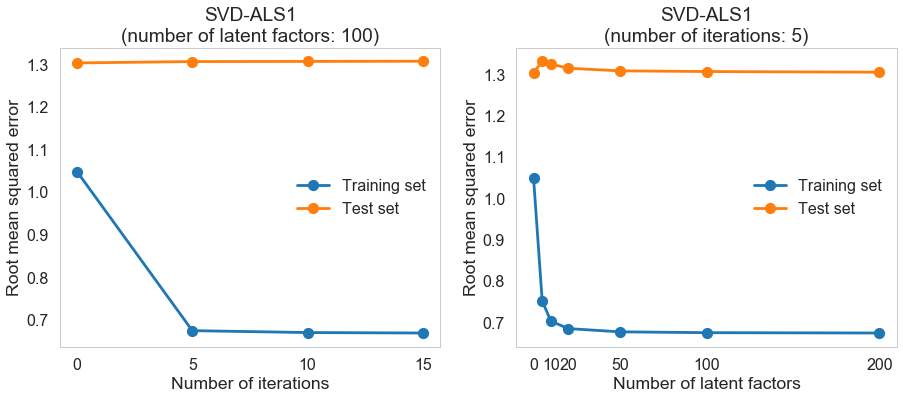

In [16]:
train_rmse = [a.score(X_train, y_train, scoring='rmse') for a in alss]
test_rmse = [a.score(X_test, y_test, scoring='rmse') for a in alss]

plt.figure(figsize=(15, 5.5))
plt.subplot(1, 2, 1)
plt.plot(iterations, train_rmse, 'o-', label='Training set');
plt.plot(iterations, test_rmse, 'o-', label='Test set');
plt.xlabel('Number of iterations');
plt.xticks(iterations, iterations);
plt.ylabel('Root mean squared error');
plt.title('SVD-ALS1\n(number of latent factors: {})'.format(100))
plt.legend();

train_rmse = [a.score(X_train, y_train, scoring='rmse') for a in alss2]
test_rmse = [a.score(X_test, y_test, scoring='rmse') for a in alss2]

plt.subplot(1, 2, 2)
plt.plot(ranks, train_rmse, 'o-', label='Training set');
plt.plot(ranks, test_rmse, 'o-', label='Test set');
plt.xlabel('Number of latent factors');
plt.xticks([0] + ranks[2:], [0] + ranks[2:]);
plt.ylabel('Root mean squared error');
plt.title('SVD-ALS1\n(number of iterations: {})'.format(5))
plt.legend();

The performance on the training set improves significantly compared to baseline (regression) model when the number of iterations and the number of latent factors are not too small; the performance on the test set doesn't change much.

We can determine the best parameters through cross-validation. And we can test the performance of the algorithm on our dataset.

In [17]:
alphas = [1, 2, 4]
alphas_als = [0.3, 1, 3, 10]
its = [5, 10, 15]
ranks = [10, 20, 50, 100]

#gs_als1 = GridSearchCV(ALS1(classification=False), \
                       #param_grid={'alpha':alphas, 'alpha_als':alphas_als, 'iterations':its, 'rank':ranks}, \
                       #scoring='neg_mean_squared_error', cv=3, return_train_score=True).fit(X_train, y_train)

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
SVD-ALS1,12.3007,0.6747,1.3064,0.778,0.1891


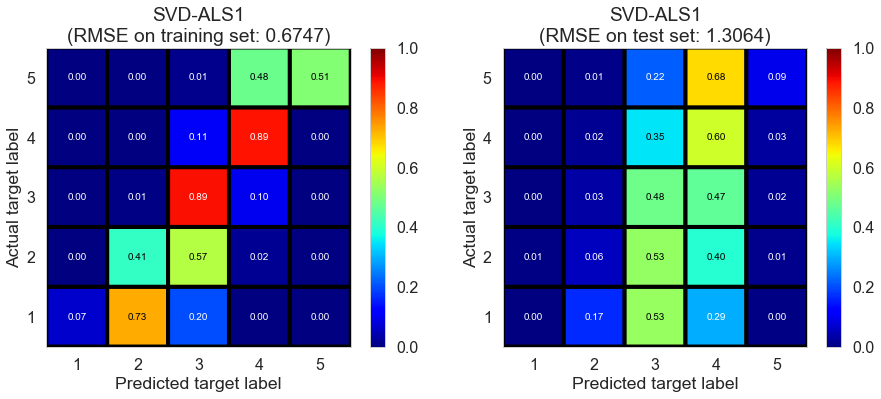

In [18]:
es = ALS1().fit(X_train, y_train)
model_name = 'SVD-ALS1'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The performance on the test set doesn't change much but the performance on the training set improves significantly compared to baseline (regression) model. **SVD-ALS1** significantly decreases the bias of the model without significantly increasing the variance. 
<br><br><br>

### SVD-ALS2

Different from **SVD-ALS1**, **SVD-ALS2** updates biases $b_u$ or $b_i$ in each iteration.

We estimate ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i + q_i^Tp_u$$

where $p_u$ represents the latent factors associated with user $u$, and $q_i$ represents the latent factors associated with restaurant $i$.  
And we minimize the following regularized squared error:

$$\sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right)$$

We implement **SVD-ALS2** as follows:
1. Fit a baseline (regression) model with optimized regularization term to learn $\mu$, $b_u$, and $b_i$.
2. Initialize $p_u$ by randomly generating values from a set of IID normal distributions with user defined `init_mean` and `init_std`.
3. In each iteration, we first solve regularized least squares problem for $q_i$ and $b_i$ by fixing $p_u$ and $b_u$, and then solve for $p_u$ and $b_u$ by fixing $q_i$ and $b_i$. Specifically, we update biases $b_u$ or $b_i$ in each iteration in **SVD-ALS2**. We use [LSMR](https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.sparse.linalg.lsmr.html) to solve regularized least squares problem at each iteration.

When we make predictions, if user $u$ is unkown, then the bias $b_u$ and the factors $p_u$ are assumed to be zero; if restaurant $i$ is unknown, the bias $b_i$ and the factors $q_i$ are assumed to be zero.

In [19]:
iterations = [0, 5, 10, 15]
als2s = [ALS2(iterations=i, rank=100).fit(X_train, y_train) for i in iterations]

ranks = [0, 5, 10, 20, 50, 100, 200]
als2s2 = [ALS2(rank=r, iterations=5).fit(X_train, y_train) for r in ranks]

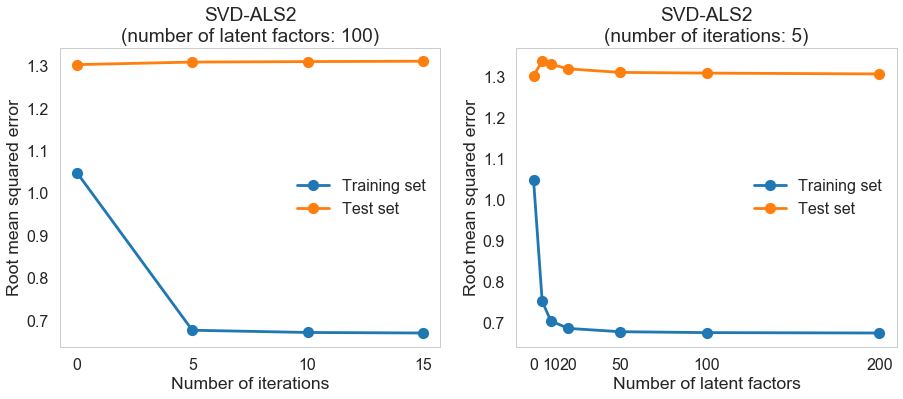

In [20]:
train_rmse = [a.score(X_train, y_train, scoring='rmse') for a in als2s]
test_rmse = [a.score(X_test, y_test, scoring='rmse') for a in als2s]

plt.figure(figsize=(15, 5.5))
plt.subplot(1, 2, 1)
plt.plot(iterations, train_rmse, 'o-', label='Training set');
plt.plot(iterations, test_rmse, 'o-', label='Test set');
plt.xlabel('Number of iterations');
plt.xticks(iterations, iterations);
plt.ylabel('Root mean squared error');
plt.title('SVD-ALS2\n(number of latent factors: {})'.format(100))
plt.legend();

train_rmse = [a.score(X_train, y_train, scoring='rmse') for a in als2s2]
test_rmse = [a.score(X_test, y_test, scoring='rmse') for a in als2s2]

plt.subplot(1, 2, 2)
plt.plot(ranks, train_rmse, 'o-', label='Training set');
plt.plot(ranks, test_rmse, 'o-', label='Test set');
plt.xlabel('Number of latent factors');
plt.xticks([0] + ranks[2:], [0] + ranks[2:]);
plt.ylabel('Root mean squared error');
plt.title('SVD-ALS2\n(number of iterations: {})'.format(5))
plt.legend();

We can determine the best parameters through cross-validation. And we can test the performance of the algorithm on our dataset.

In [21]:
alphas = [1, 2, 4]
alphas_als = [0.3, 1, 3, 10]
its = [5, 10, 15]
ranks = [10, 20, 50, 100]

#gs_als2 = GridSearchCV(ALS2(classification=False), \
                       #param_grid={'alpha':alphas, 'alpha_als':alphas_als, 'iterations':its, 'rank':ranks}, \
                       #scoring='neg_mean_squared_error', cv=3, return_train_score=True).fit(X_train, y_train)

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
SVD-ALS2,13.1128,0.6764,1.3092,0.7768,0.1855


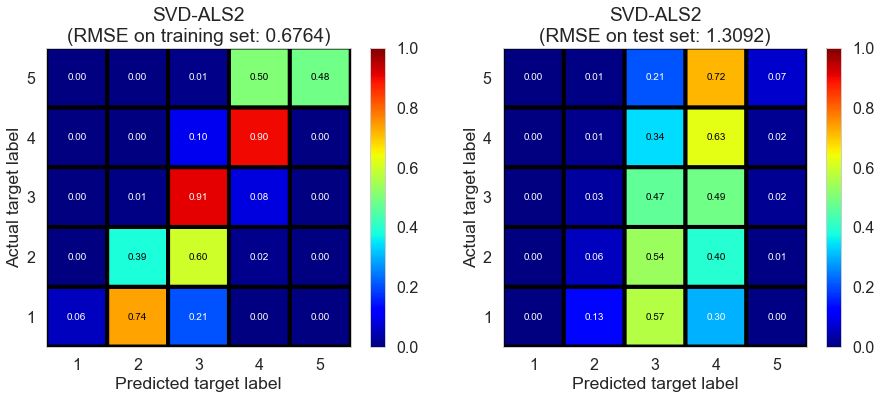

In [22]:
es = ALS2().fit(X_train, y_train)
model_name = 'SVD-ALS2'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The result of **SVD-ALS2** is similar to that of **SVD-ALS1**, indicating updating biases in each iteration doesn't have much impact on the model performance.
<br><br><br>

### SVD-SGD*

We implemented this algorithm by wrapping around [`SVD`](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD) in the [`scikit-surprise`](http://surpriselib.com/) package.

Stochastic gradient descent (SGD) is another widely used algorithm for solving SVD problems.

We estimate ratings as:

$$\hat{r}_{ui} = \mu + b_u + b_i + q_i^Tp_u$$

where $p_u$ represents the latent factors associated with user $u$, and $q_i$ represents the latent factors associated with restaurant $i$.

And we minimize the following regularized squared error:

$$\sum_{r_{ui} \in R_{train}} \left(r_{ui} - \hat{r}_{ui} \right)^2 +
\lambda\left(b_i^2 + b_u^2 + ||q_i||^2 + ||p_u||^2\right)$$

As described in [documentation](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVD),
>**SVD-SGD\*** performs minization by stachastic gradient descent:
>
>$$b_u \leftarrow b_u + \gamma (e_{ui} - \lambda b_u)$$
>
>$$b_i \leftarrow b_i + \gamma (e_{ui} - \lambda b_i)$$
>
>$$p_u \leftarrow p_u + \gamma (e_{ui} \cdot q_i - \lambda p_u)$$
>
>$$q_i \leftarrow q_i + \gamma (e_{ui} \cdot p_u - \lambda q_i)$$
>
>where $e_{ui} = r_{ui} - \hat{r}_{ui}$.

When we make predictions, if user $u$ is unkown, then the bias $b_u$ and the factors $p_u$ are assumed to be zero; if restaurant $i$ is unknown, the bias $b_i$ and the factors $q_i$ are assumed to be zero.

We use the default parameters, and the result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
SVD-SGD*,1.0001,0.8929,1.3173,0.6111,0.1754


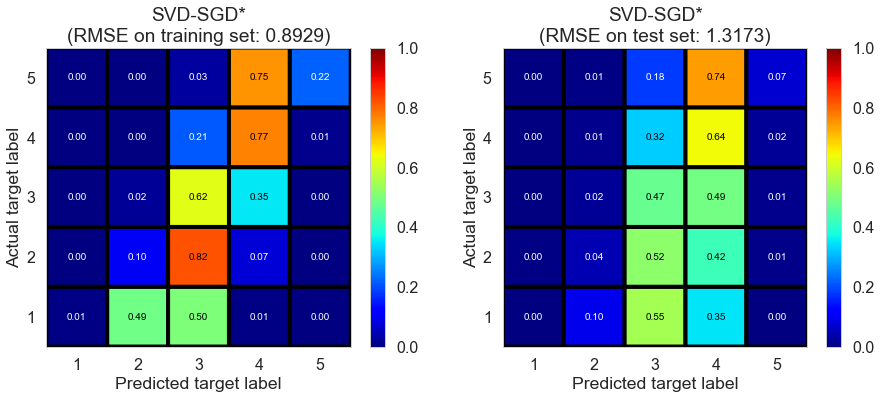

In [23]:
es = RS_surprise(SVD()).fit(X_train, y_train)
model_name = 'SVD-SGD*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The result of **SVD-SGD\*** is similar to that of **SVD-ALS1** and **SVD-ALS2**.
<br><br><br>

### SVD++-SGD*

We implemented this algorithm by wrapping around [`SVDpp`](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVDpp) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in [documentation](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.SVDpp),
>**SVD++** algorithm takes into account implicit ratings. The prediction $\hat{r}_{ui}$ is set as:
>
>$$\hat{r}_{ui} = \mu + b_u + b_i + q_i^T\left(p_u +|I_u|^{-\frac{1}{2}} \sum_{j \in I_u}y_j\right)$$
>
>where $y_i$ terms capture implicit ratings; an implicit rating describes the fact that a user $u$ rated a restaurant $j$, regardless of the rating value. 

When we make predictions, if user $u$ is unkown, then the bias $b_u$ and the factors $p_u$ are assumed to be zero; if restaurant $i$ is unknown, $b_i$, $q_i$ and $y_i$ are assumed to be zero.

We use the default parameters, and the result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
SVD++-SGD*,3.3182,0.9285,1.322,0.5795,0.1695


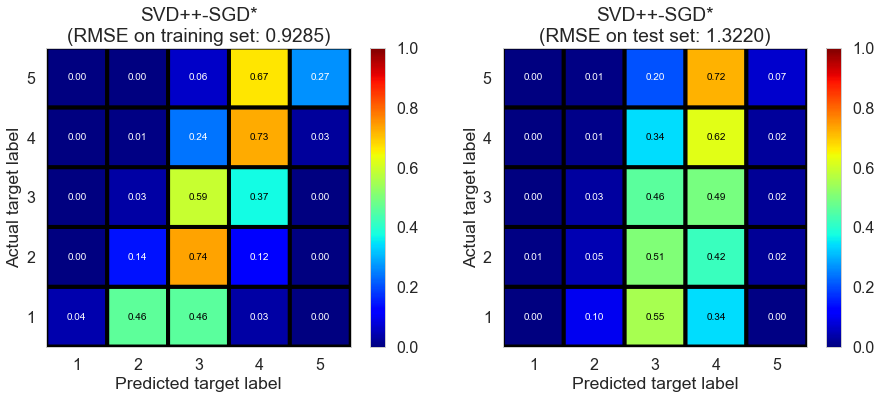

In [24]:
es = RS_surprise(SVDpp()).fit(X_train, y_train)
model_name = 'SVD++-SGD*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The inclusion of implicit rating doesn't seem to significantly change model performance.
<br><br><br>

### NMF-SGD*

We implemented this algorithm by wrapping around [`NMF`](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.NMF) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/matrix_factorization.html#surprise.prediction_algorithms.matrix_factorization.NMF),
>**NMF** sets the prediction $\hat{r}_{ui}$ as:
>
>$$\hat{r}_{ui} = q_i^Tp_u$$
>
>where $p_u$ and $q_i$ are kept positive.
>
>Each step of SGD updates $p_{uf}$ and $q_{if}$ as follows:
>
>$$p_{uf} \leftarrow p_{uf} \cdot \frac{\sum_{i \in I_u} q_{if}
\cdot r_{ui}}{\sum_{i \in I_u} q_{if} \cdot \hat{r_{ui}} +
\lambda_u |I_u| p_{uf}}$$
>
>$$q_{if} \leftarrow q_{if} \cdot \frac{\sum_{u \in U_i} p_{uf}
\cdot r_{ui}}{\sum_{u \in U_i} p_{uf} \cdot \hat{r_{ui}} +
\lambda_i |U_i| q_{if}}$$

We use the default parameters, and the result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
NMF (no bias)*,1.2431,0.2485,1.5226,0.9699,-0.1016


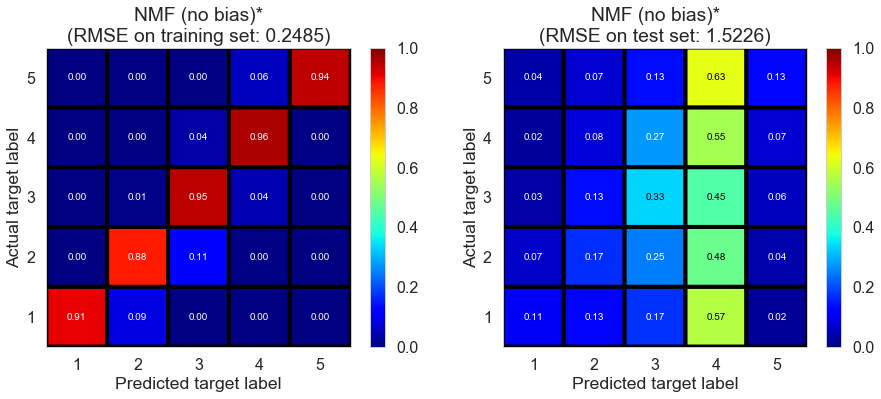

In [25]:
es = RS_surprise(NMF()).fit(X_train, y_train)
model_name = 'NMF (no bias)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The model suffers from serious overfitting, partially because we doesn't add bias term.

We can try the biased version of **NMF**, which sets the prediction as

$$\hat{r}_{ui} = \mu + b_u + b_i + q_i^Tp_u.$$

The result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
NMF (with bias)*,1.1971,0.4773,1.4985,0.8889,-0.067


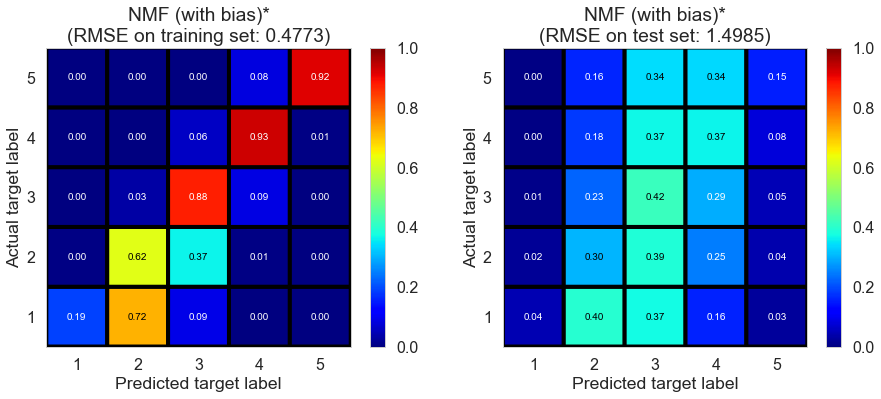

In [26]:
es = RS_surprise(NMF(biased=True)).fit(X_train, y_train)
model_name = 'NMF (with bias)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

It is better than the version without bias terms, but the model still suffers from overfitting. Although we could potentially address the issue by tuning regularization parameters, the result suggests it might not be a good idea to use **NMF** in this case.
<br><br><br>

## Neighborhood methods

In this part, we tried some neighborhood methods available in the [`scikit-surprise`](http://surpriselib.com/) package. Neighborhood methods don't perform well in this dataset in general since a lot of users and restaurants don't have any neighbors, making the models susceptible to overfitting.

### k-NN (basic)*

We implemented this algorithm by wrapping around [`KNNBasic`](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBasic) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBasic), 
>**k-NN (basic)\*** sets the prediction as:
>
>$$\hat{r}_{ui} = \frac{
\sum\limits_{v \in N^k_i(u)} \text{sim}(u, v) \cdot r_{vi}}
{\sum\limits_{v \in N^k_i(u)} \text{sim}(u, v)}$$
>
>or
>
>$$\hat{r}_{ui} = \frac{
\sum\limits_{j \in N^k_u(i)} \text{sim}(i, j) \cdot r_{uj}}
{\sum\limits_{j \in N^k_u(j)} \text{sim}(i, j)}$$

We use the default parameters, and the result is shown below.

Computing the msd similarity matrix...
Done computing similarity matrix.


model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
KNN (basic)*,1.0001,0.4328,1.4642,0.9086,-0.0187


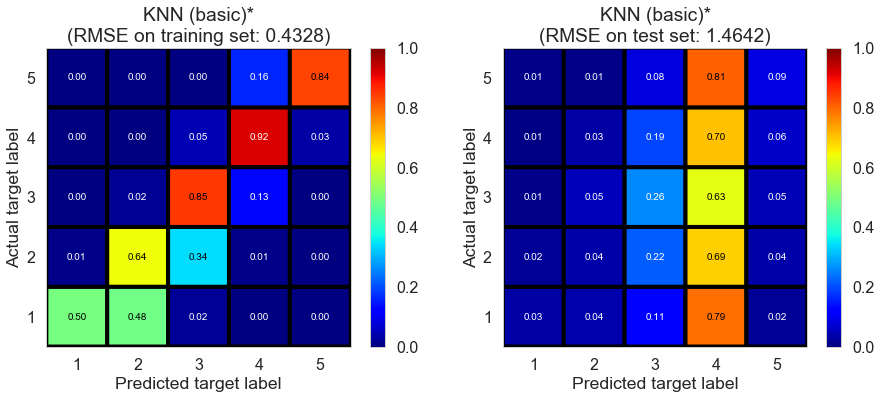

In [27]:
es = RS_surprise(KNNBasic()).fit(X_train, y_train)
model_name = 'KNN (basic)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The model suffers from overfitting as we expected.
<br><br><br>

### k-NN (with means)*

We implemented this algorithm by wrapping around [`KNNWithMeans`](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNWithMeans) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNWithMeans), 
>**k-NN (with means)\*** takes into account the average ratings of each user, and sets the prediction as:
>
>$$\hat{r}_{ui} = \mu_u + \frac{ \sum\limits_{v \in N^k_i(u)}
\text{sim}(u, v) \cdot (r_{vi} - \mu_v)} {\sum\limits_{v \in
N^k_i(u)} \text{sim}(u, v)}$$
>
>or
>
>$$\hat{r}_{ui} = \mu_i + \frac{ \sum\limits_{j \in N^k_u(i)}
\text{sim}(i, j) \cdot (r_{uj} - \mu_j)} {\sum\limits_{j \in
N^k_u(i)} \text{sim}(i, j)}$$

We use the default parameters, and the result is shown below.

Computing the msd similarity matrix...
Done computing similarity matrix.


model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
KNN (with means)*,1.1161,0.5898,1.531,0.8303,-0.1138


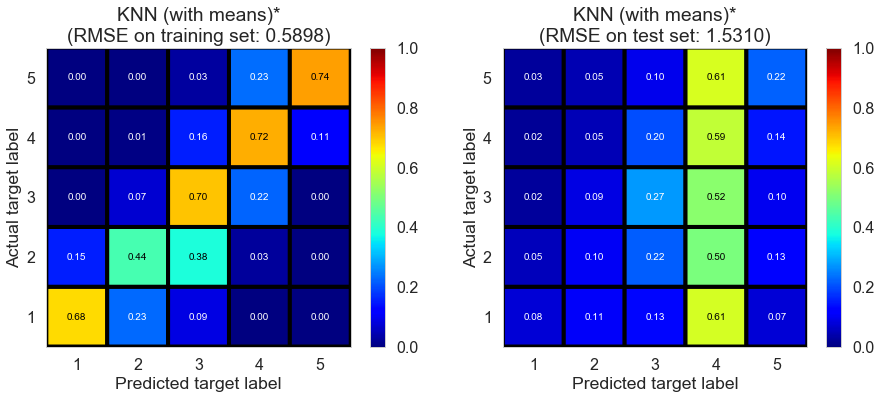

In [28]:
es = RS_surprise(KNNWithMeans()).fit(X_train, y_train)
model_name = 'KNN (with means)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

Still, the model suffers from overfitting as we expected.
<br><br><br>

### k-NN (baseline)*

We implemented this algorithm by wrapping around [`KNNBaseline`](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/knn_inspired.html#surprise.prediction_algorithms.knns.KNNBaseline), 
>**k-NN (baseline)\*** takes into account the baseline rating, and sets the prediction as:
>
>$$\hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{v \in N^k_i(u)}
\text{sim}(u, v) \cdot (r_{vi} - b_{vi})} {\sum\limits_{v \in
N^k_i(u)} \text{sim}(u, v)}$$
>
>or
>
>$$\hat{r}_{ui} = b_{ui} + \frac{ \sum\limits_{j \in N^k_u(i)}
\text{sim}(i, j) \cdot (r_{uj} - b_{uj})} {\sum\limits_{j \in
N^k_u(j)} \text{sim}(i, j)}$$

We use the default parameters, and the result is shown below.

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.


model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
KNN (baseline)*,1.0251,0.4175,1.3718,0.915,0.1058


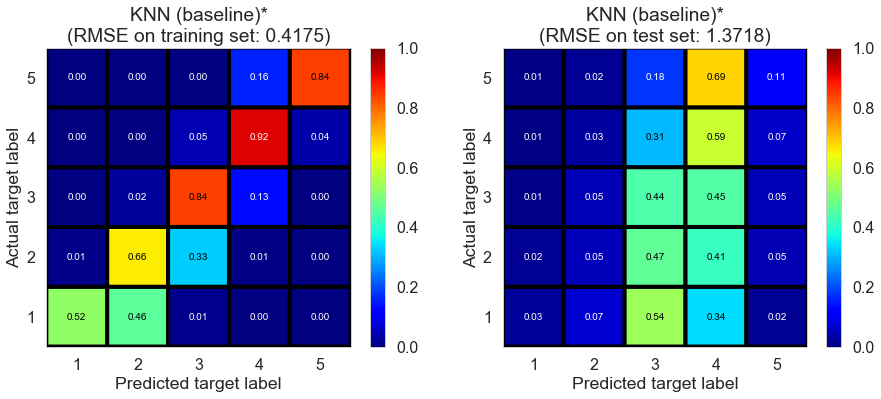

In [29]:
es = RS_surprise(KNNBaseline()).fit(X_train, y_train)
model_name = 'KNN (baseline)*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

Although the model is still not as good as some latent factor models we tried ealier in terms of test performance, the variance of the model is much less than other k-NN models we tried, indicating the inclusion of baseline ratings is helpful.
<br><br><br>

### Slope one*

We implemented this algorithm by wrapping around [`SlopeOne`](http://surprise.readthedocs.io/en/stable/slope_one.html#surprise.prediction_algorithms.slope_one.SlopeOne) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/slope_one.html#surprise.prediction_algorithms.slope_one.SlopeOne), 
>**Slope one\*** sets the prediction as:
>
>$$\hat{r}_{ui} = \mu_u + \frac{1}{
|R_i(u)|}
\sum\limits_{j \in R_i(u)} \text{dev}(i, j)$$
>
>where $R_i(u)$ is the set of relevant restaurants, i.e. the set of restaurants $j$ rated by $u$ that also have at least one common user with $i$. $\text{dev}(i, j)$ is defined as the average difference between the ratings of $i$ and those of $j$:
>
>$$\text{dev}(i, j) = \frac{1}{
|U_{ij}|}\sum\limits_{u \in U_{ij}} r_{ui} - r_{uj}$$

We use the default parameters, and the result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Slope one*,0.158,0.3545,1.5546,0.9387,-0.1484


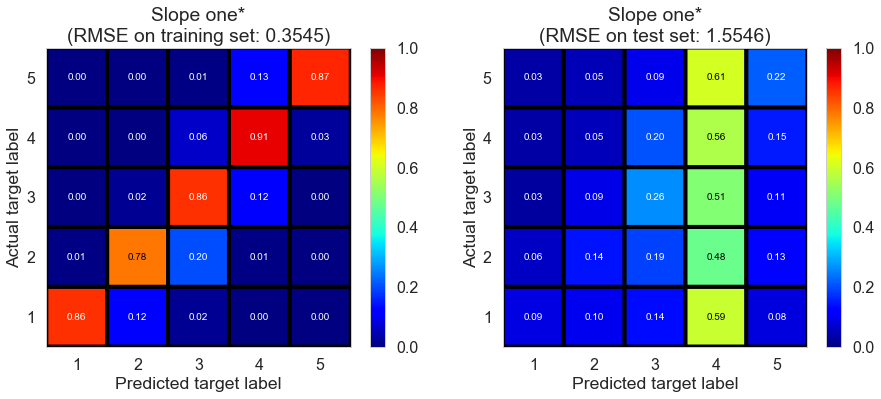

In [30]:
es = RS_surprise(SlopeOne()).fit(X_train, y_train)
model_name = 'Slope one*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The model suffers from overfitting as we expected.
<br><br><br>

### Co-clustering*

We implemented this algorithm by wrapping around [`CoClustering`](http://surprise.readthedocs.io/en/stable/co_clustering.html#surprise.prediction_algorithms.co_clustering.CoClustering) in the [`scikit-surprise`](http://surpriselib.com/) package.

As described in the [documentation](http://surprise.readthedocs.io/en/stable/co_clustering.html#surprise.prediction_algorithms.co_clustering.CoClustering), 
>**Co-clustering** sets the prediction as:
>
>$$\hat{r}_{ui} = \overline{C_{ui}} + (\mu_u - \overline{C_u}) + (\mu_i
- \overline{C_i})$$
>
>where $\overline{C_{ui}}$ is the average rating of co-cluster $C_{ui}$, $\overline{C_u}$ is the average rating of $u$'s cluster, and $\overline{C_i}$ is the average rating of $i$'s cluster.

We use the default parameters, and the result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Co-clustering*,1.2651,0.7461,1.4804,0.7285,-0.0414


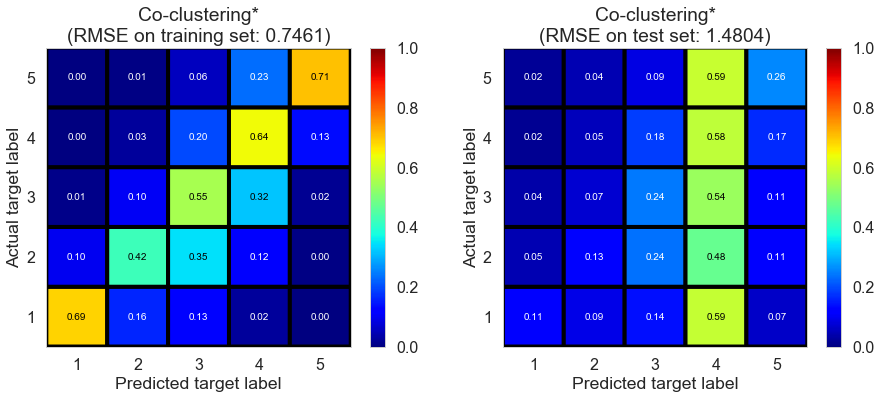

In [31]:
es = RS_surprise(CoClustering()).fit(X_train, y_train)
model_name = 'Co-clustering*'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

The model suffers from overfitting as we expected.
<br><br><br>

# Content filtering

In [1]:
import warnings
warnings.filterwarnings("ignore")

import sys
import traceback
import pandas as pd
import numpy as np
import time
from copy import deepcopy

from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge, RidgeCV, LassoCV, LogisticRegression, LogisticRegressionCV, LinearRegression
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
import statsmodels.api as sm
from statsmodels.api import OLS

from scipy import sparse

import pickle

from IPython.display import display, HTML, Markdown

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

from surprise import Dataset, Reader
from surprise import NormalPredictor, BaselineOnly, SVD, SVDpp, NMF, \
SlopeOne, CoClustering, KNNBasic, KNNWithMeans, KNNBaseline

from recommender import plot_cm, get_results, show_results, IO, show_summaries, get_X
from recommender import ModeClassifier, BaselineMean, BaselineRegression, ALS1, ALS2, RS_surprise, RS_sklearn



In [2]:
city = 'Champaign'
fig_dir = 'figs/modeling/{}/'.format(city)
data_dir = 'data/{}/'.format(city)

dfb = pd.read_pickle(data_dir + 'business.pkl')
dfu = pd.read_pickle(data_dir + 'user.pkl')

X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + 'data_split.pkl').read_pickle()

(X_train, column_names) = get_X(X_train, dfb, dfu, return_columns=True)
X_test = get_X(X_test, dfb, dfu)
X_cv = get_X(X_cv, dfb, dfu)

# IO(data_dir + '05_data_split.pkl').to_pickle([X_train, y_train, X_test, y_test, X_cv, y_cv])

del dfb
del dfu

## Introduction

By merging the user.csv and business.csv through the user_id and business_id in review, we get a complete X (predictor) matrix. From EDA we find that review score is strongly associated with some of the properties of users, or can be differented greatly on some attributed of restaurants. Therefore, we decide to build content filtering models, including linear regression, ridge regression, logistic regression and random forest regressor.
<br><br><br>

## Content filtering models

### Feature Selection
Before building the model, we preprocess the data by dropping certain uncorrelated variables, such as longitutde, latitude and postal code, as well as some string varibles, such as names, friends and so on. We deal with the missing values with imputation. Also, we didn't include all the over 100 variables into consideration, because some of them don't have strong and clear relationships with review score but increase the multicollinearity and sparsity of predictor matrix.

Instead, we pick 51 important predictors through EDA, which shows some relationships with review stars. For example, as shown in the EDA, review stars have various distributions on different dummy attributes of restaurant, such as different bestnight, music, food restriction, ambience and "good for" emphasis. Also, some of the categories in categorical attributes of restaurant show different patterns with others. Instead of taking dummy, we group by the different pattern and encode the categories according to their effect on review stars based on EDA. For instance, for attribute "RestaurantAttire", only "formal" appear a different pattern compared with other categories in the box plot. So we only encode it with 1 and other categories with 0.
For properties of users, we include variables that shows strong relationships with review stars, such as users'average star, fans, review count etc. 

Here we assume: 
1. average ratings of user and restaurants are always available;

2. the average ratings in the user and business tables wouldn't deviate a lot from the averages we learn from data in the training set; thus it would be valid to include average rating from 2 tables as features in our model.

### Linear regression

First of all, we perform general OLS to have a preliminary understanding of content filtering. Linear Regression result already indicates a great performance on test set compared with Baseline (Regression) model. Similar criterion values on both training and test set means including more attributes and using content filtering could fix overfitting well. In the following, we would implement certain models we learn from class to see if we could improve it.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Linear regression,0.028,1.0772,1.0973,0.4341,0.4279


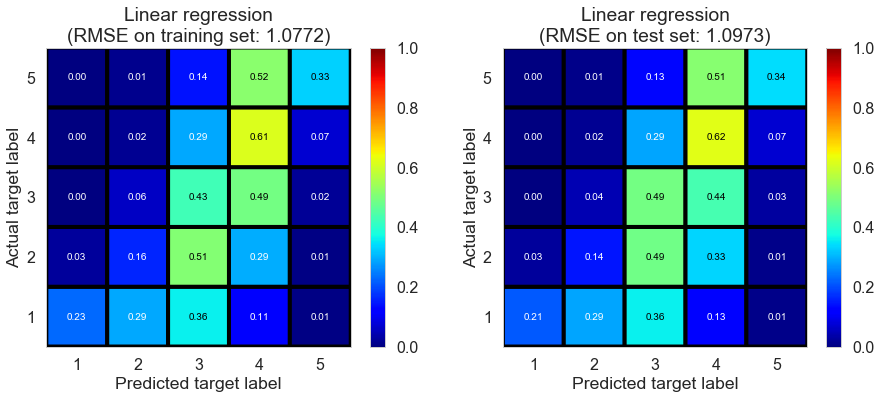

In [6]:
es = RS_sklearn(estimator=LinearRegression()).fit(X_train, y_train)
model_name = 'Linear regression'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

<br><br><br>

### Ridge regression

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.064,1.0772,1.0973,0.4341,0.4279


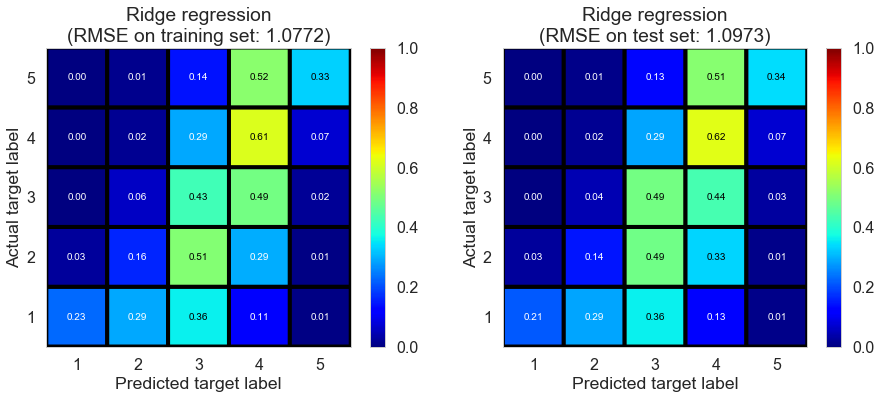

In [5]:
es = RS_sklearn(estimator=RidgeCV()).fit(X_train, y_train)
model_name = 'Ridge regression'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

<br><br><br>

### Lasso regression

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Lasso regression,0.256,1.0786,1.0961,0.4326,0.4291


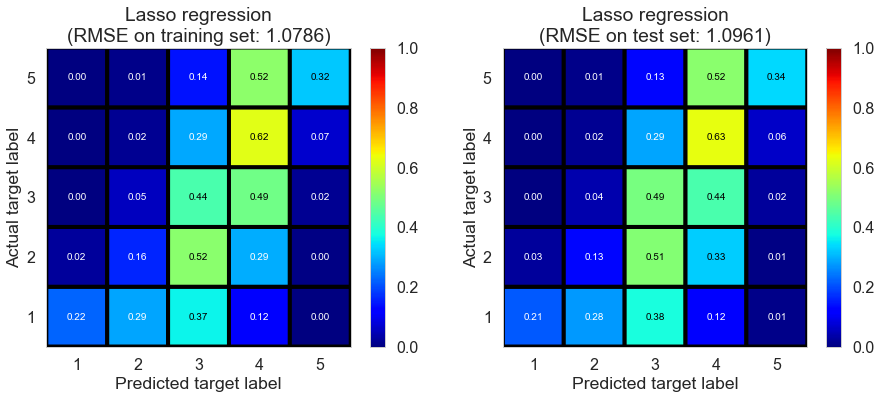

In [8]:
es = RS_sklearn(estimator=LassoCV()).fit(X_train, y_train)
model_name = 'Lasso regression'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

Regression with regularization doesn't seem to improve a lot from OLS. Reason might be we already select important predictors. In fact, we try to use the complete predictors matrix (over 100 predictors) and try with RidgeCV/LassoCV. Results seem to be even worse. Manually selecting predictors might be better in interpretation and prediction. So in the following we keep using the selected predictor matrix rather than keep trying dimension reduction model such as stepwise/PCA.
<br><br><br>

### Logistic regression

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Logistic regression,2.6832,1.3889,1.4052,0.0591,0.0618


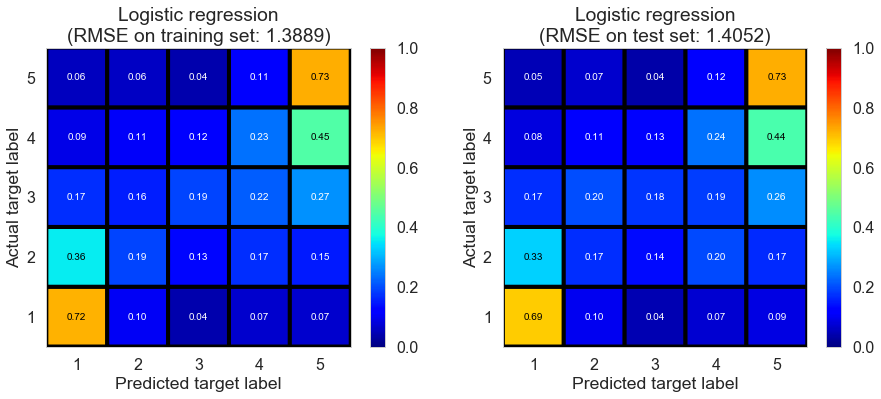

In [9]:
es = RS_sklearn(estimator=LogisticRegressionCV(class_weight='balanced')).fit(X_train, y_train)
model_name = 'Logistic regression'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

Besides regression model, we could also implement classification model. Here we try logistic regression with cross validation. Classification accuracy seem to improve compared with regression model, but RMSE get worse on both training and test set. As a matter of fact, we consider RMSE as a more important assessment because we had better not to punish at the same scale between predicting 5 as 1 and predicitng 5 as 4. This also explains why classification model doesn't work as well as regression model due to the same punishment scale in loss function. So we no longer consider other classification models such as SVM etc.
<br><br><br>

### Random forest regressor

We come back to regression model and try random forest regressor model. We choose appropriate parameters, including n_estimator and max_depth, through cross validation (GridSearchCV). Results show that this model performs better in RMSE and $R^2$ on both training and test set. Therefore, it provides us with some ideas on implementing ensemble models.

In [10]:
ns = list(range(1, X_train.shape[1]+1))
m32 = [RandomForestRegressor(n_estimators=n, max_features='auto').fit(X_train, y_train) for n in ns]

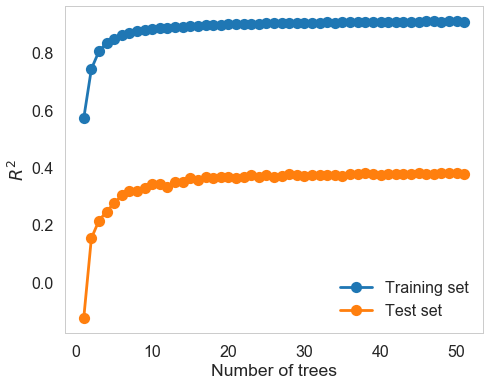

In [11]:
s32_train = [m.score(X_train, y_train) for m in m32]
s32_test = [m.score(X_test, y_test) for m in m32]
plt.figure(figsize=(7.5, 6))
plt.plot(ns, s32_train, 'o-', label='Training set');
plt.plot(ns, s32_test, 'o-', label='Test set');
plt.legend();
plt.xlabel('Number of trees');
plt.ylabel('$R^2$');

In [12]:
n_trees = 50
ns_depth = list(range(1, X_train.shape[1]+1))
gs34 = GridSearchCV(RandomForestRegressor(n_estimators=n_trees), param_grid={'max_depth':ns_depth}, cv=5).fit(X_train, y_train)

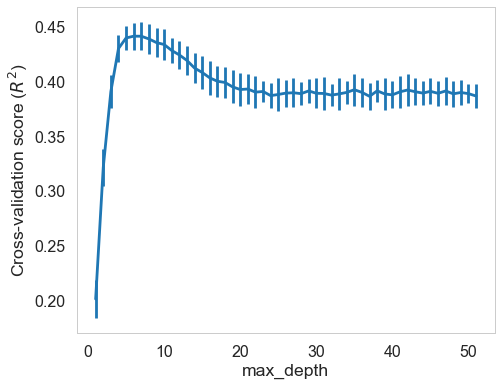

In [13]:
n_depth_best = ns_depth[np.argmax(gs34.cv_results_['mean_test_score'])]
#print('The optimal value for max_depth is {}.'.format(n_depth_best))
plt.figure(figsize=(7.5, 6))
plt.errorbar(ns_depth, gs34.cv_results_['mean_test_score'], gs34.cv_results_['std_test_score'], fmt='')
plt.xlabel('max_depth');
plt.ylabel('Cross-validation score ($R^2$)');

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Random forest,1.1121,1.0265,1.0858,0.486,0.4398


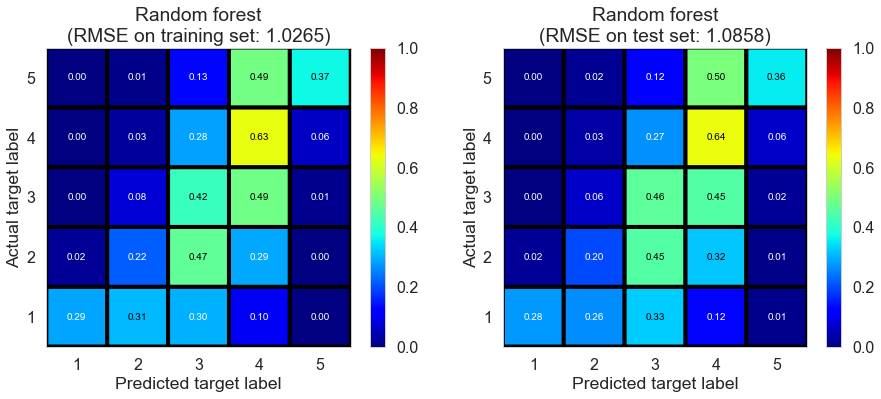

In [3]:
es = RS_sklearn(estimator=RandomForestRegressor(n_estimators=50, max_depth=7)).fit(X_train, y_train)
model_name = 'Random forest'

results = get_results(es, X_train, y_train, X_test, y_test, X_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train, y_train, X_test, y_test, results=results, print_=False, plot=True, \
            show_cv=False, show_title=False);

<br><br><br>

## Potential Drawbacks

We investigated the significance of each predictor in the linear regression model, and found something fishy.

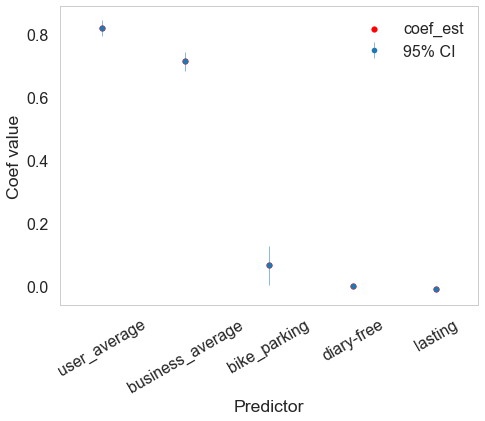

In [10]:
X_subset = sm.add_constant(X_train)
ols_sm = sm.OLS(y_train, X_subset)
fit_sm = ols_sm.fit()
#print(fit_sm.summary())


is_significant = fit_sm.pvalues < 0.05
sig_vars = [i for i in range(len(is_significant)) if is_significant[i]]
#print('There are {} statistically significant coefficients (p < 0.05):'.format(len(sig_vars)))

sig_b = []

for i in range(len(sig_vars)-1):
    row={}
    row["predictor"] = column_names[sig_vars[i+1] - 1]
    row["coef"] = fit_sm.params[sig_vars[i+1]]
    row["CI 2.5"] = fit_sm.conf_int()[sig_vars[i+1]][0]
    row["CI 97.5"] = fit_sm.conf_int()[sig_vars[i+1]][1]
    sig_b.append(row)

sig_b_df = pd.DataFrame(sig_b)
sig_b_df = sig_b_df.sort_values("coef", ascending=False)
sig_b_df[["predictor","coef","CI 2.5","CI 97.5"]].head()

plt.figure(figsize=(7.5, 5.5))

plt.errorbar(range(sig_b_df.shape[0]), 0.5*sig_b_df["CI 97.5"]+0.5*sig_b_df["CI 2.5"],  \
             yerr=0.5*(sig_b_df["CI 97.5"]-sig_b_df["coef"])+0.5*(sig_b_df["coef"]-sig_b_df["CI 2.5"]), \
             fmt='.', marker=None, elinewidth=0.5, label="95% CI");
plt.scatter(range(sig_b_df.shape[0]), sig_b_df["coef"], color='red', label="coef_est", marker='.');
plt.xlim((-0.5, sig_b_df.shape[0]-0.5));
plt.xticks(range(5), ['user_average', 'business_average'] + [i for i in sig_b_df['predictor'].values[2:]], rotation=30);
plt.xlabel("Predictor");
plt.ylabel("Coef value");
plt.legend();

The assumption to include average stars as features might be fishy.

1. According to the following graph of importance of coefficients, 5 out of our 51 predictors in the model are significant / important: users' average stars, restaurants' average stars, restaurants' bike parking, restaurants' food restriction is diary-free,  and years users started to use yelp. We don't feel surprise to see the first two predictors since they play a main role in all of our models. In addition, the other predictors with coefficients slightly higher than 0 are also apparent indicators of high review score according to EDA. So the most important variables in this model are users' average stars and restaurants' average stars.

2. However, a majority of users or restaurants have only sent / received one review score. Therefore, when we make prediction based on these predictors, they are not always available.

3. Also, it the amount of review stars that users our restaurants have only sent / received is small, then the known average ratings in practice might be different from the average rating in the current two tables. Therefore, it might not be reasonable to directly using the average ratings in the two tables as the average ratings features we want.

# Ensemble estimators

## Introduction

In this part, we build ensemble estimators, which make predictions based on the predictions of base estimators. The goal here is to build an ensemble estimator, of which the performance is at least as good as that of the best base estimator, which help us avoid the trouble of making choices among base estimators. Such ensemble estimator would be very helpful, especially in the cases when there is variation in terms of the performance of base estimators, or in the cases where some data required for certain base estimators are not available (e.g., values of some key predictors are missing in the content filtering models).

To avoid overfitting, we train the ensemble estimators on the cross-validation set rather than the training set we used for the training of base estimators. We drop the base estimators, of which the $R^2$ score on the cross-validation set is lower than a threshold (we choose 0.05 in this case); we call the remaining base estimators as *qualified base estimators*.

Here we tried 3 strategies to build ensemble estimators (weighted average, Ridge regression, and random forest regressor).

We use Champaign dataset (20571 reviews, 878 restaurants, 8451 users) for demo purpose.

**Note:** the fitting time we report in this part does NOT include the fitting and prediction time of base estimators.
<br><br><br>

In [1]:
import sys
import traceback
import pandas as pd
import numpy as np
import time
from copy import deepcopy

from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from scipy import sparse

import pickle

from IPython.display import display, HTML, Markdown

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

from surprise import Dataset, Reader
from surprise import NormalPredictor, BaselineOnly, SVD, SVDpp, NMF, \
SlopeOne, CoClustering, KNNBasic, KNNWithMeans, KNNBaseline

from recommender import plot_cm, get_results, show_results, IO, \
show_summaries, get_base_predictions, get_multi_base_predictions
from recommender import ModeClassifier, BaselineMean, BaselineRegression, ALS1, ALS2, RS_surprise, RS_ensemble

In [2]:
city = 'Champaign'
data_dir = 'data/{}/'.format(city)

results = IO(data_dir + 'results/results.pkl').read_pickle()
is_successful = IO(data_dir + 'results/is_successful.pkl').read_pickle()
datanames = IO(data_dir + 'results/datanames.pkl').read_pickle()

ys_base_train, ys_base_test, ys_base_cv, weights = get_base_predictions(results, is_successful, datanames, thres=0.05)
X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + 'data_split.pkl').read_pickle()
data_split = [ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv]
#IO(data_dir + '061_data_split.pkl').to_pickle(data_split)

## Ensemble of collaborative filtering models

First, we built ensemble estimators for the qualified collaborative filtering base estimators.

### Weighted average

The first strategy is to make the ensemble predictions as the weighted averages of the qualified base estimators, where we use $R^2$ score on the cross-validation set as weights.

The result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0,0.8527,1.3071,0.6454,0.1882


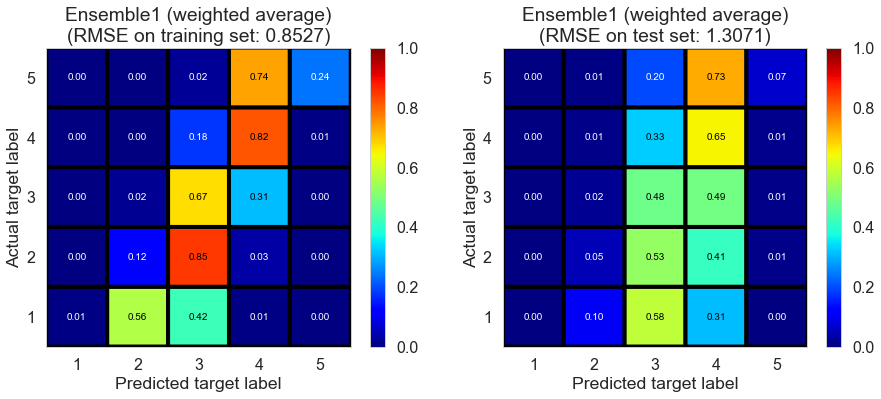

In [3]:
es = RS_ensemble(estimator=None).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble1 (weighted average)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance of weighted average is fine.
<br><br><br>

### Ridge regression

The second strategy is to perform a Ridge regression on the predictions of qualified base estimators.

The result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (Ridge regression),0.004,1.3268,1.3026,0.1413,0.1937


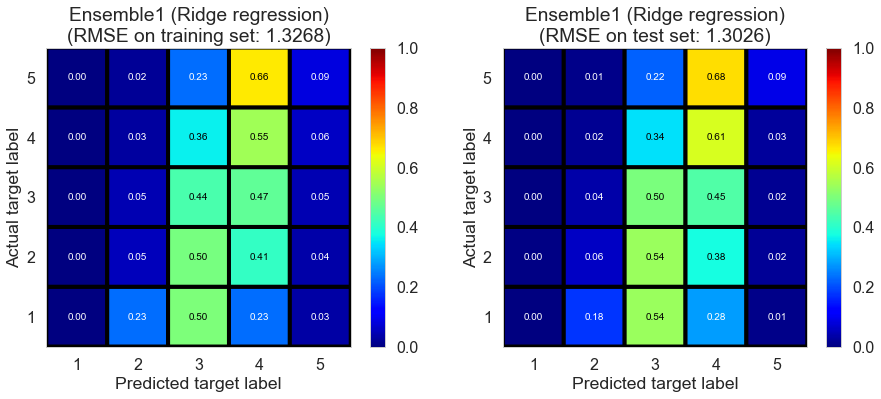

In [4]:
es = RS_ensemble(estimator=RidgeCV()).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble1 (Ridge regression)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance on the training set is poor. We need to point out that the training set here is not "real" training set since we train the ensemble estimator on the cross-validation set.
<br><br><br>

### Random forest

The third strategy is to train a random forest regressor on the predictions of qualified base estimators. We can use the best parameters determined by cross-validation.

The result is shown below.

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (random forest),0.215,1.057,1.3037,0.4551,0.1924


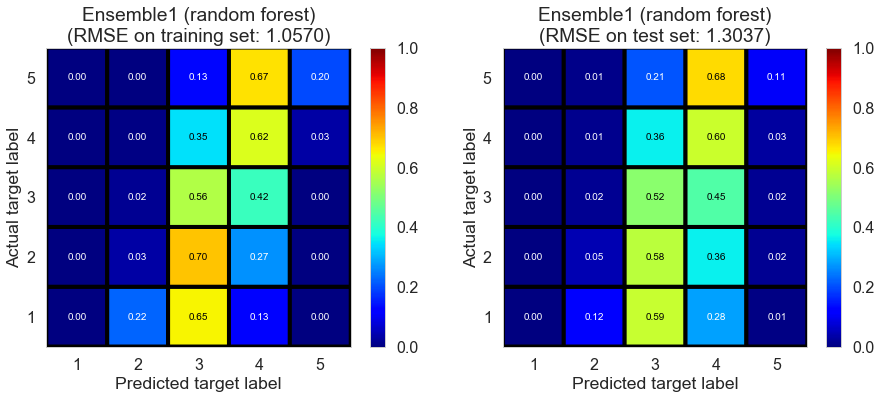

In [5]:
es = RS_ensemble(estimator=RandomForestRegressor(n_estimators=50, max_depth=3)).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble1 (random forest)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance on the training set seems to be better than that of Ridge regression.
<br><br><br>

## Ensemble of collaborative filtering and content filtering models

In [6]:
city = 'Champaign'
fig_dir = 'figs/modeling/{}/'.format(city)
data_dir = 'data/{}/'.format(city)

results = [IO(data_dir + 'results/results.pkl').read_pickle(), IO(data_dir + 'results05/results.pkl').read_pickle()]
is_successful = [IO(data_dir + 'results/is_successful.pkl').read_pickle(), \
                 IO(data_dir + 'results05/is_successful.pkl').read_pickle()]
datanames = [IO(data_dir + 'results/datanames.pkl').read_pickle(), \
             IO(data_dir + 'results05/datanames.pkl').read_pickle()]

ys_base_train, ys_base_test, ys_base_cv, weights = \
get_multi_base_predictions(results, is_successful, datanames, thres=0.05)
X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + 'data_split.pkl').read_pickle()

### Weighted average

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble2 (weighted average),0.0,0.9007,1.1591,0.6043,0.3616


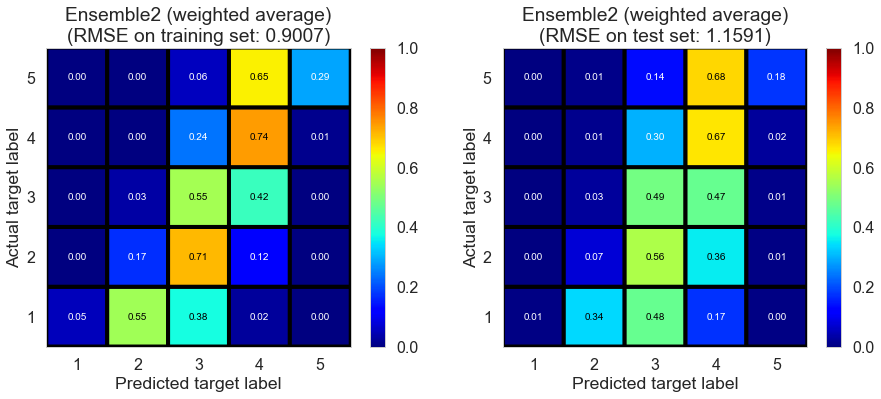

In [7]:
es = RS_ensemble(estimator=None).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble2 (weighted average)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance on the test set drops slightly.
<br><br><br>

### Ridge regression

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble2 (Ridge regression),0.01,1.2721,1.083,0.2107,0.4426


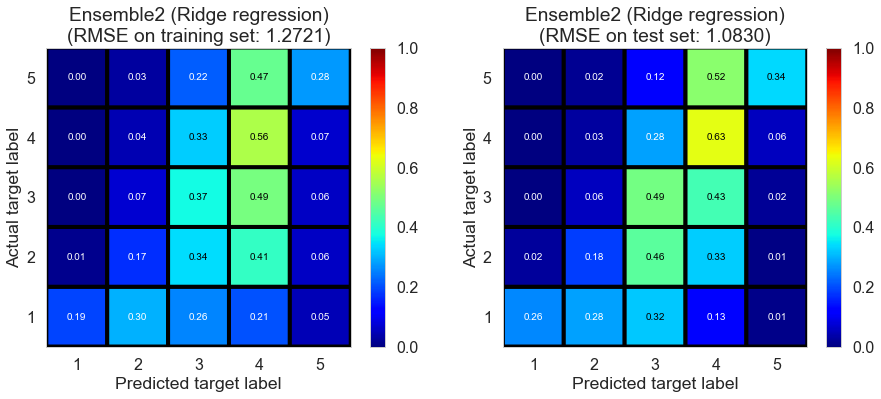

In [8]:
es = RS_ensemble(estimator=RidgeCV()).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble2 (Ridge regression)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance on the training set is bad.
<br><br><br>

### Random forest

model,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble2 (random forest),0.268,1.0621,1.0855,0.4497,0.4401


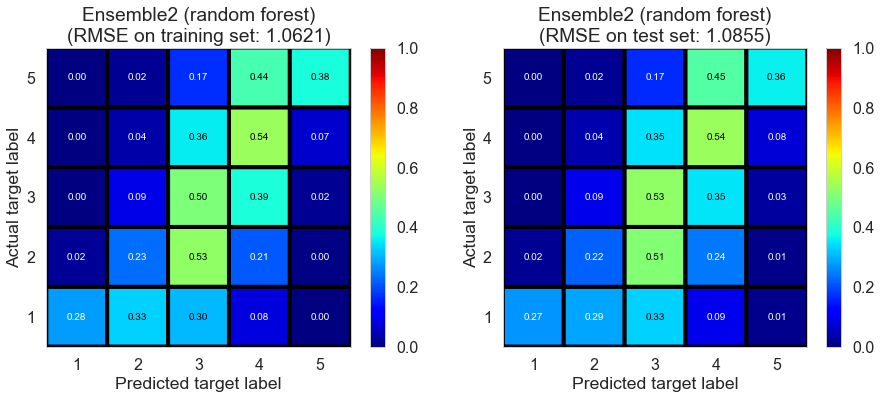

In [9]:
es = RS_ensemble(estimator=RandomForestRegressor(n_estimators=50, max_depth=3)).fit(ys_base=ys_base_cv, y=y_cv, weights=weights)
model_name = 'Ensemble2 (random forest)'

results = get_results(es, ys_base_train, y_train, ys_base_test, y_test, ys_base_cv, y_cv)

show_summaries([model_name], [results], [True]);

show_results(es, model_name, X_train=ys_base_train, y_train=y_train, \
             X_test=ys_base_test, y_test=y_test, print_=False, plot=True, show_cv=False, show_title=False);

The performance is good on both training set and test set, indicating random forest regressor is suitable for building ensemble estimator in this case.

# Results

## Methods

We benchmarked the base estimators and ensemble estimators in 6 datasets of different sizes. In each dataset, we randomly split the reviews into 3 sets: a training set (60%), a cross-validation set (16%) and a test set (24%). We train base estimators on the training set, and test on the test set; cross-validation set is used for the training of ensemble estimators. All experiments are run on a desktop with Inter Xeon CPU 3.10 GHz, 256 GB RAM.
<br><br>

## Results

In [1]:
import sys
import traceback
import pandas as pd
import numpy as np
import time
from copy import deepcopy

from sklearn.base import BaseEstimator
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

from sklearn.linear_model import Ridge, RidgeCV
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

from scipy import sparse

import pickle

from IPython.display import display, HTML, Markdown

import matplotlib
import matplotlib.pyplot as plt

import seaborn as sns
pd.set_option('display.width', 15000)
pd.set_option('display.max_columns', 100)
sns.set_style("whitegrid", {'axes.grid' : False})
sns.set_context('poster')
%matplotlib inline

from surprise import Dataset, Reader
from surprise import NormalPredictor, BaselineOnly, SVD, SVDpp, NMF, \
SlopeOne, CoClustering, KNNBasic, KNNWithMeans, KNNBaseline

from recommender import plot_cm, get_results, show_results, IO, \
show_summaries, get_base_predictions, get_multi_base_predictions
from recommender import ModeClassifier, BaselineMean, BaselineRegression, ALS1, ALS2, RS_surprise, RS_ensemble

### Champaign <sup>(20571 reviews, 878 restaurants, 8451 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.9995,2.0258,-0.9501,-0.9500
Normal predictor*,0.0870,1.8825,1.8821,-0.7286,-0.6833
Baseline (mean),0.0190,0.9485,1.4648,0.5612,-0.0195
Baseline (regression),0.0350,1.0481,1.3032,0.4642,0.1930
Baseline (ALS)*,0.0570,1.1981,1.3200,0.2998,0.1721
KNN (basic)*,0.9841,0.4328,1.4642,0.9086,-0.0187
KNN (with means)*,1.2851,0.5898,1.5310,0.8303,-0.1138
KNN (baseline)*,1.0201,0.4175,1.3718,0.9150,0.1058
SVD-ALS1,12.2077,0.6747,1.3064,0.7780,0.1891
SVD-ALS2,12.9087,0.6764,1.3092,0.7768,0.1855


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.0690,1.0773,1.0971,0.4339,0.4280
Random forest,1.0951,1.0262,1.0862,0.4864,0.4394


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.000,0.8527,1.3071,0.6454,0.1882
Ensemble1 (Ridge regression),0.011,1.3268,1.3026,0.1413,0.1937
Ensemble1 (random forest),0.220,1.0506,1.3048,0.4617,0.1910
Ensemble2 (weighted average),0.000,0.9007,1.1591,0.6043,0.3616
Ensemble2 (Ridge regression),0.004,1.2721,1.0830,0.2107,0.4426
Ensemble2 (random forest),0.271,1.0678,1.0847,0.4439,0.4409


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

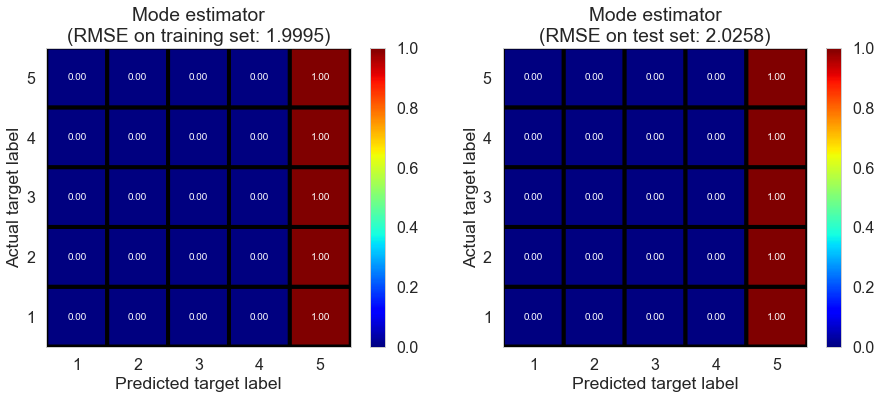

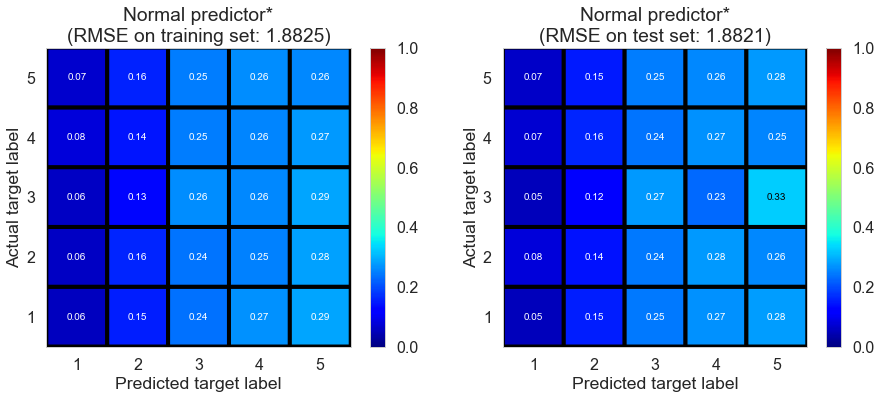

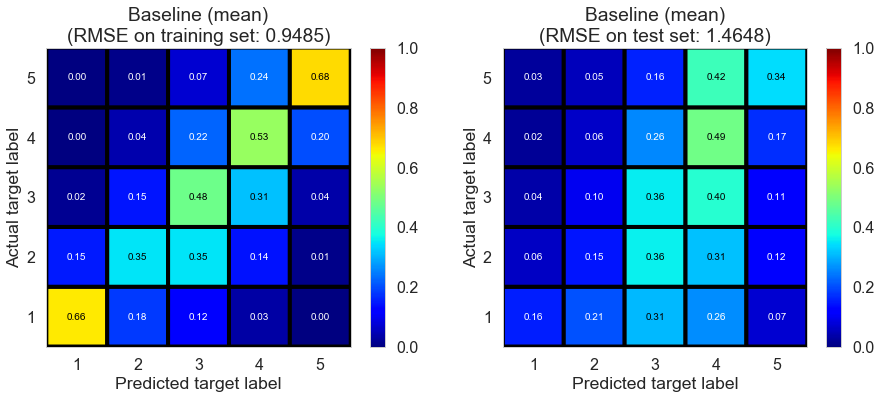

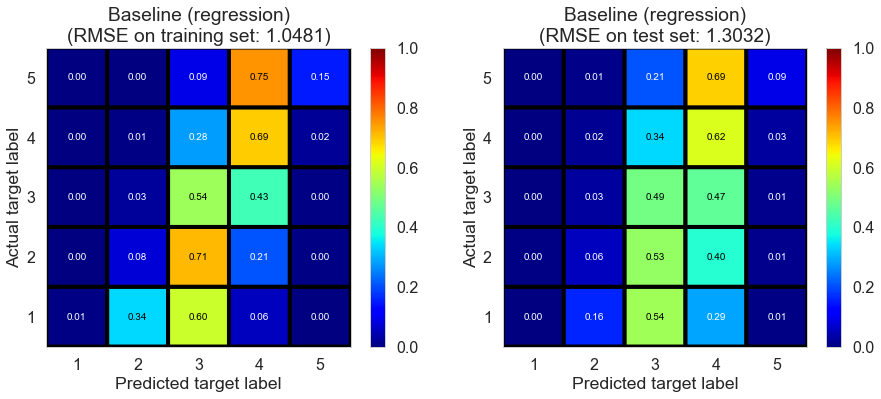

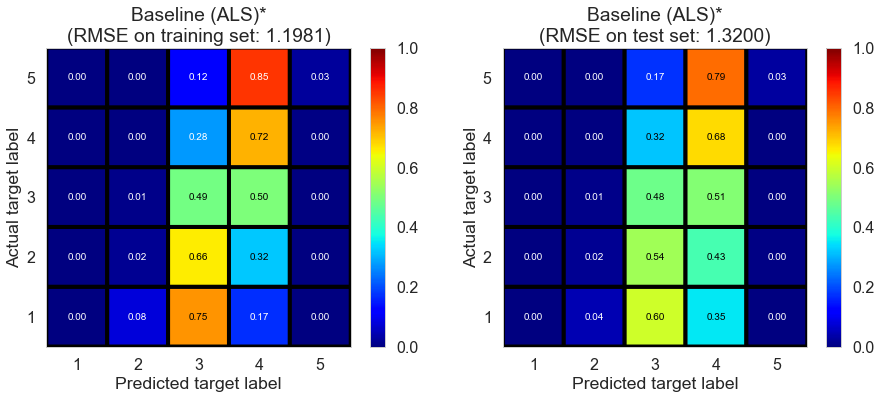

...

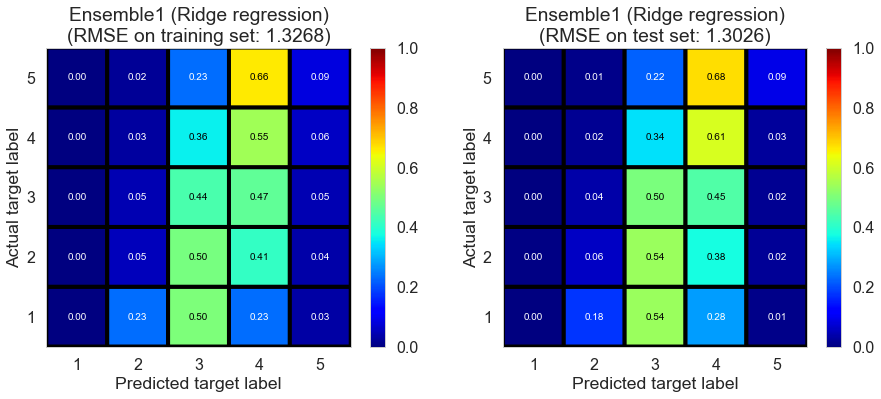

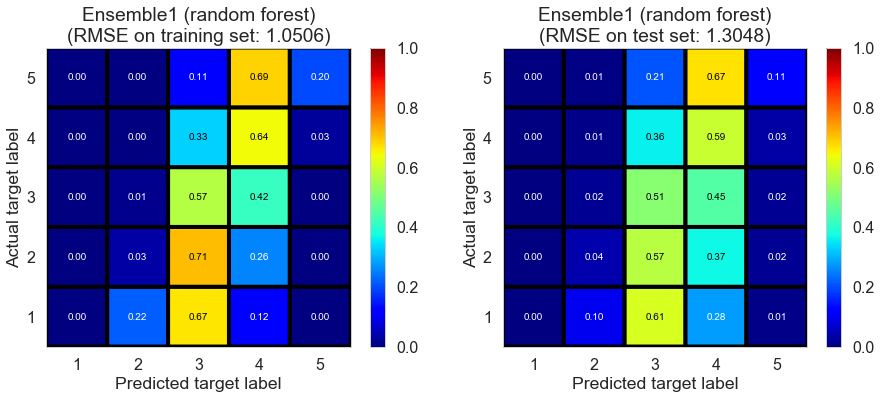

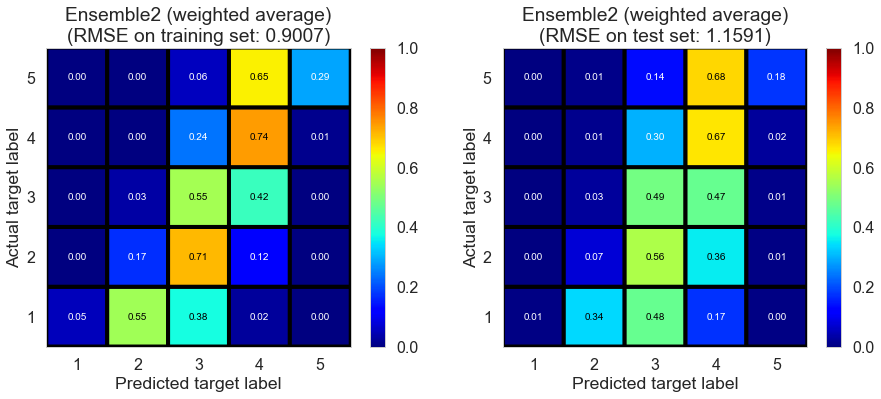

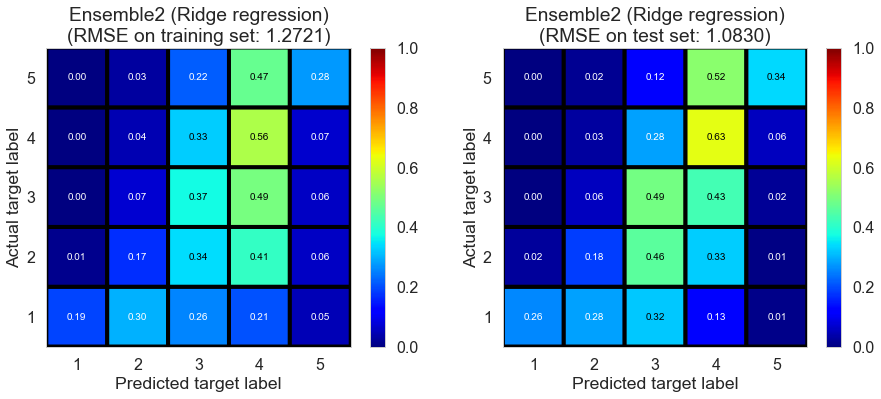

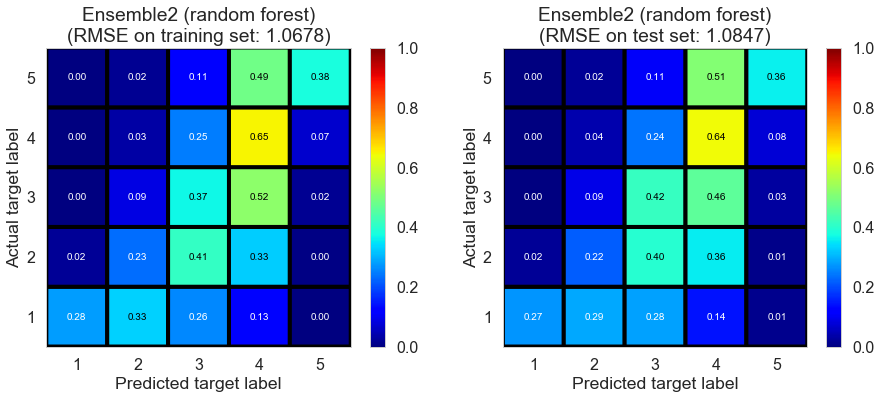

<br><br>

### Cleveland <sup>(75932 reviews, 2500 restaurants, 30131 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8152,1.8262,-0.8226,-0.8371
Normal predictor*,0.2250,1.7514,1.7529,-0.6968,-0.6926
Baseline (mean),0.0550,0.8908,1.3417,0.5610,0.0084
Baseline (regression),0.1110,0.9870,1.2051,0.4611,0.2000
Baseline (ALS)*,0.2790,1.1171,1.2170,0.3097,0.1841
KNN (basic)*,13.4688,0.3952,1.3484,0.9136,-0.0016
KNN (with means)*,14.3168,0.5600,1.4020,0.8265,-0.0829
KNN (baseline)*,13.0127,0.3837,1.2612,0.9186,0.1237
SVD-ALS1,41.9954,0.5721,1.2095,0.8190,0.1941
SVD-ALS2,44.2825,0.5740,1.2121,0.8177,0.1907


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.2860,1.0195,1.0313,0.4251,0.4141
Random forest,4.7943,0.9929,1.0155,0.4546,0.4320


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.7559,1.2085,0.6839,0.1955
Ensemble1 (Ridge regression),0.0050,0.9587,1.2040,0.4916,0.2014
Ensemble1 (random forest),0.7260,0.9431,1.2063,0.5080,0.1984
Ensemble2 (weighted average),0.0000,0.8214,1.0915,0.6268,0.3437
Ensemble2 (Ridge regression),0.0070,1.0072,1.0141,0.4389,0.4334
Ensemble2 (random forest),0.9471,0.9989,1.0180,0.4480,0.4291


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

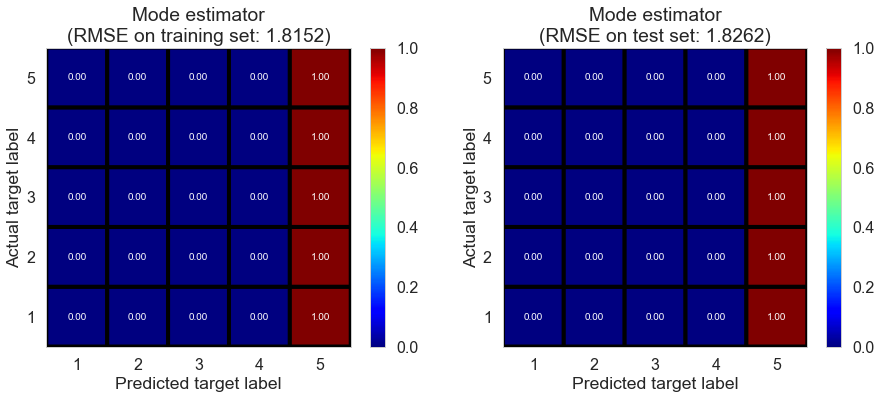

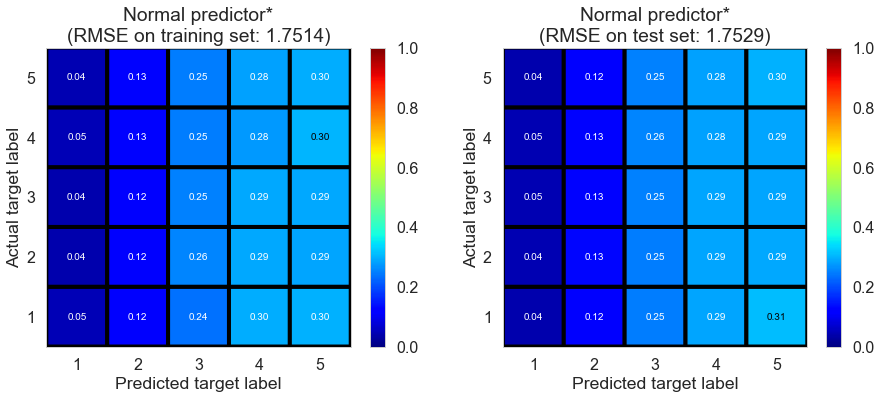

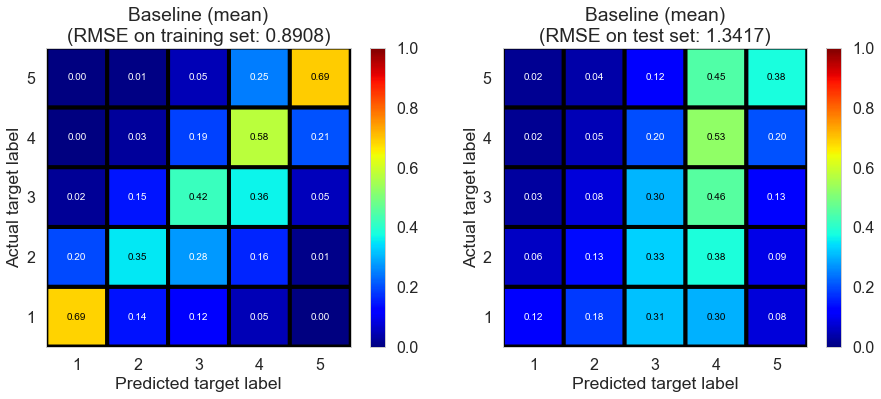

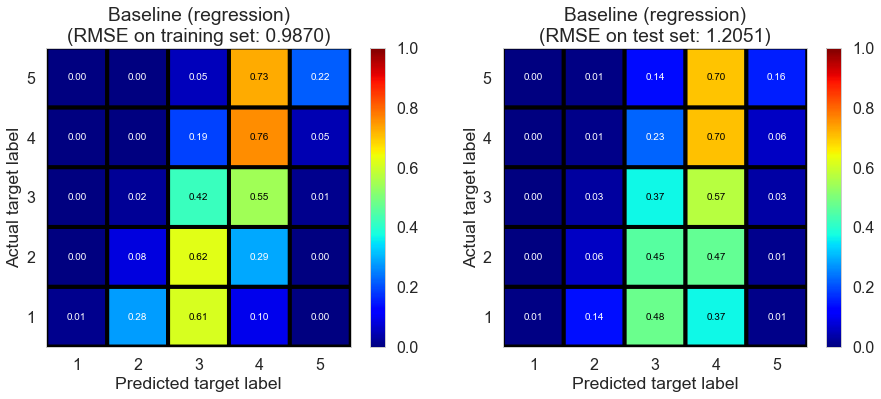

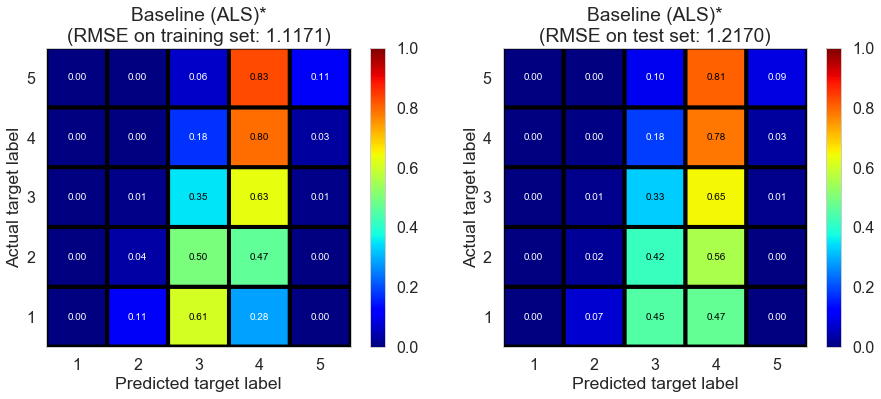

...

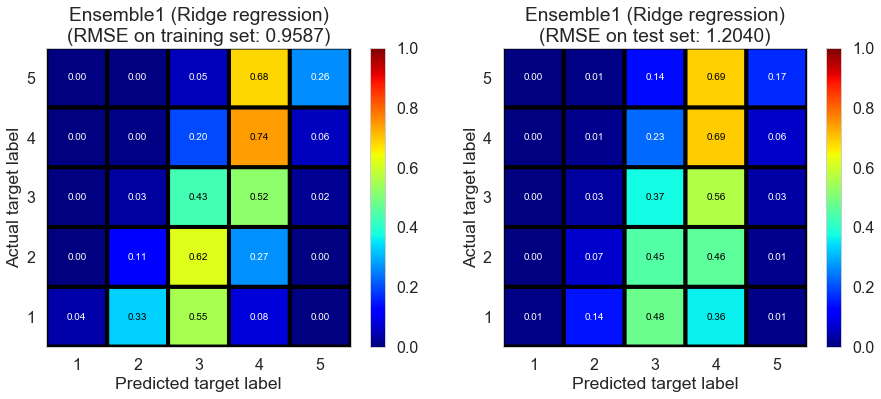

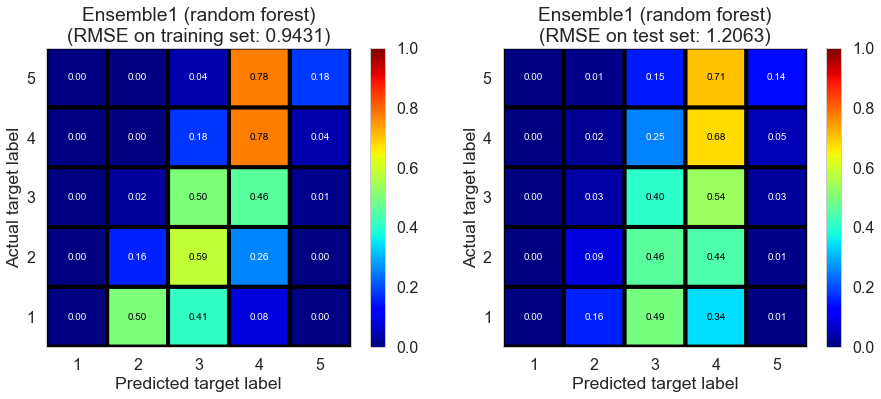

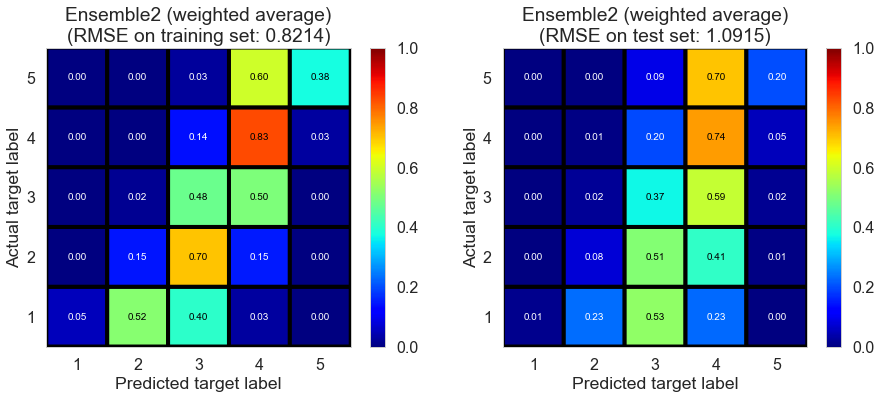

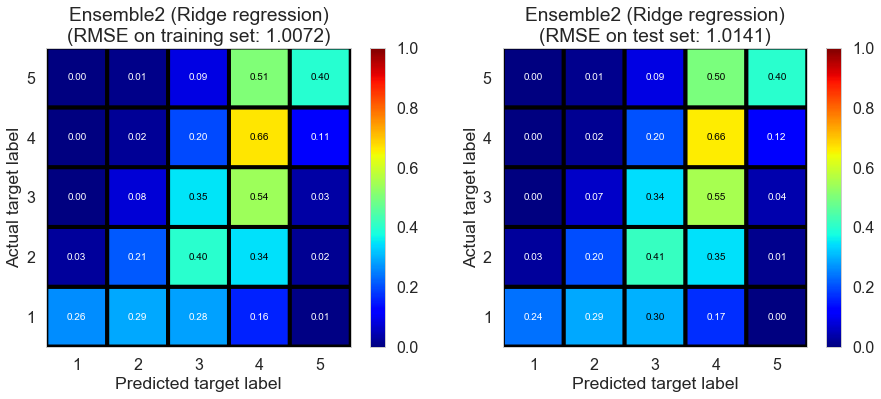

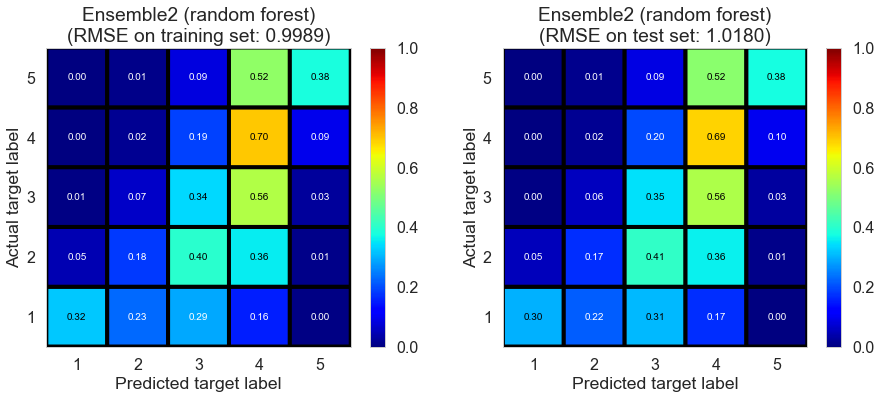

<br><br>

### Pittsburgh <sup>(143682 reviews, 4745 restaurants, 46179 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8026,1.7988,-0.8466,-0.8393
Normal predictor*,0.4550,1.7307,1.7303,-0.7022,-0.7017
Baseline (mean),0.1020,0.9052,1.3198,0.5343,0.0099
Baseline (regression),0.2000,0.9941,1.1878,0.4384,0.1980
Baseline (ALS)*,0.5780,1.1119,1.2020,0.2974,0.1788
SVD-ALS1,79.5536,0.5627,1.1960,0.8200,0.1870
SVD-ALS2,82.5507,0.5651,1.2010,0.8185,0.1801
SVD-SGD*,7.5524,0.8267,1.2046,0.6116,0.1752
SVD++-SGD*,43.6945,0.8738,1.2025,0.5661,0.1780
NMF-SGD*,9.3785,0.3666,1.3761,0.9236,-0.0765


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,0.5500,1.0158,1.0062,0.4135,0.4245
Random forest,10.1126,0.9938,0.9896,0.4388,0.4434


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8050,1.1919,0.6317,0.1925
Ensemble1 (Ridge regression),0.0150,0.9371,1.1872,0.5010,0.1988
Ensemble1 (random forest),1.2871,0.9703,1.1882,0.4650,0.1974
Ensemble2 (weighted average),0.0000,0.8576,1.0612,0.5820,0.3598
Ensemble2 (Ridge regression),0.0170,0.9494,0.9882,0.4878,0.4449
Ensemble2 (random forest),1.7071,0.9996,0.9933,0.4322,0.4391


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

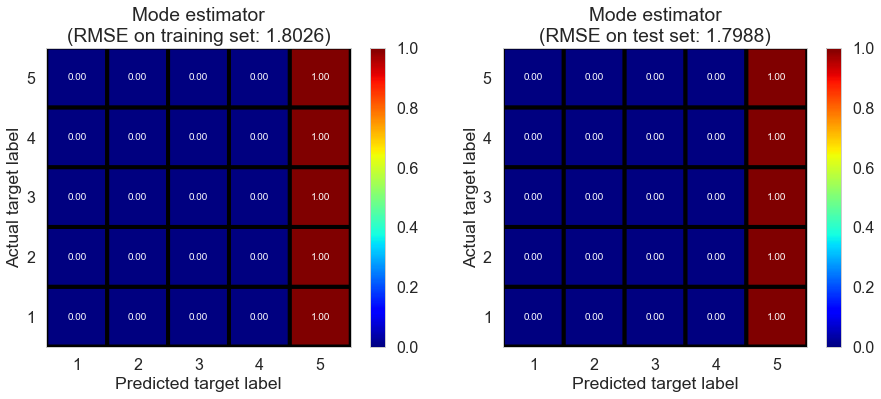

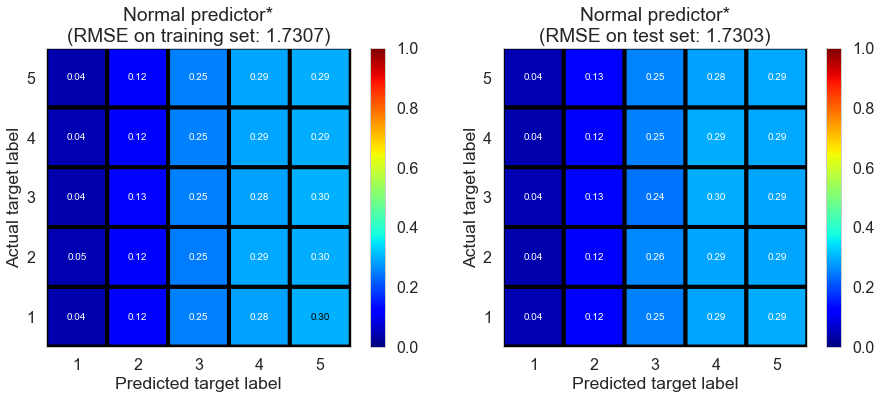

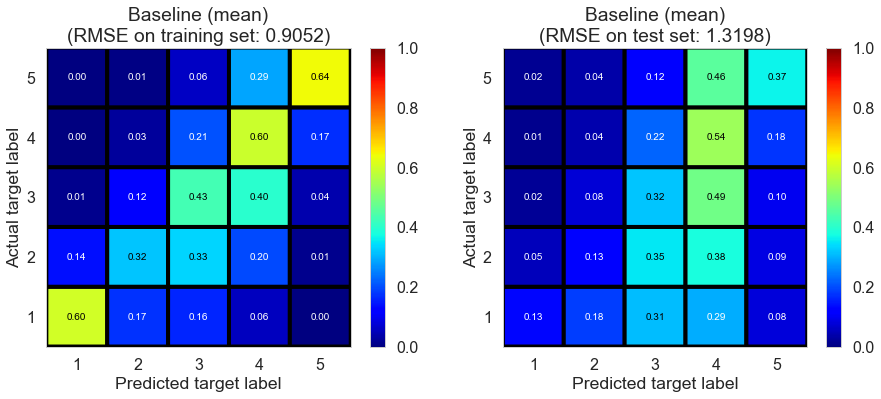

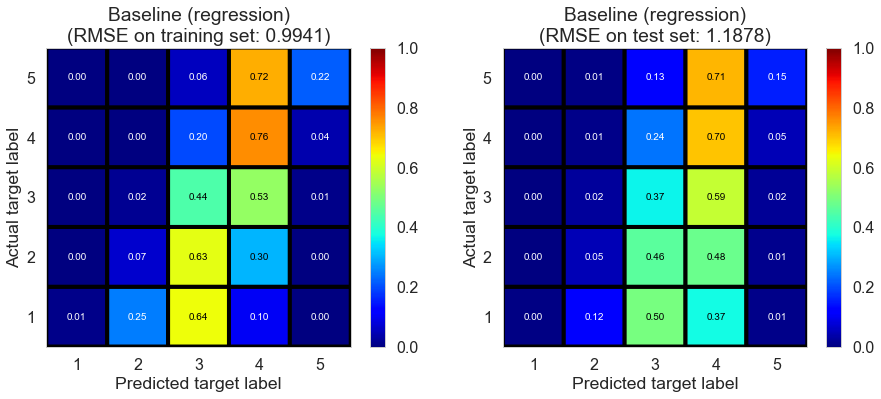

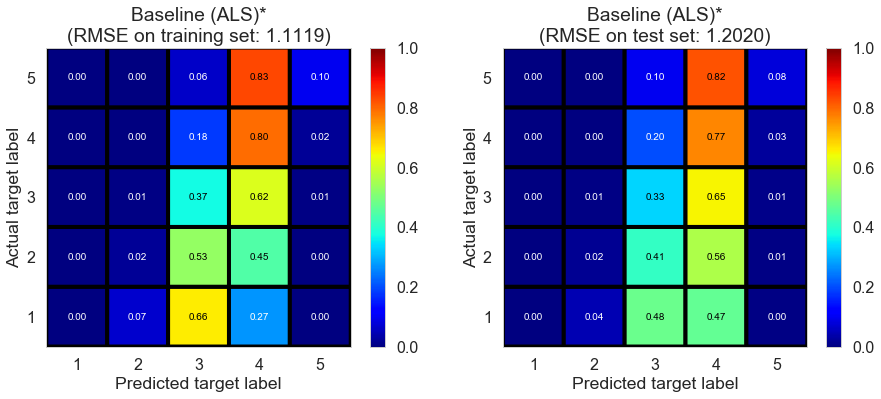

...

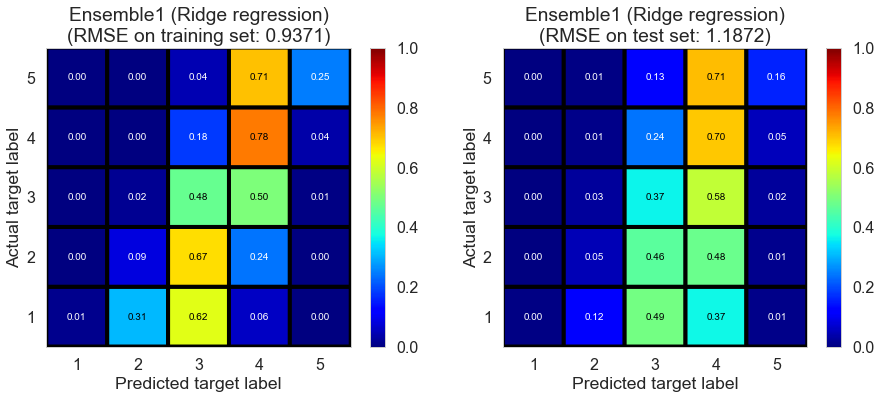

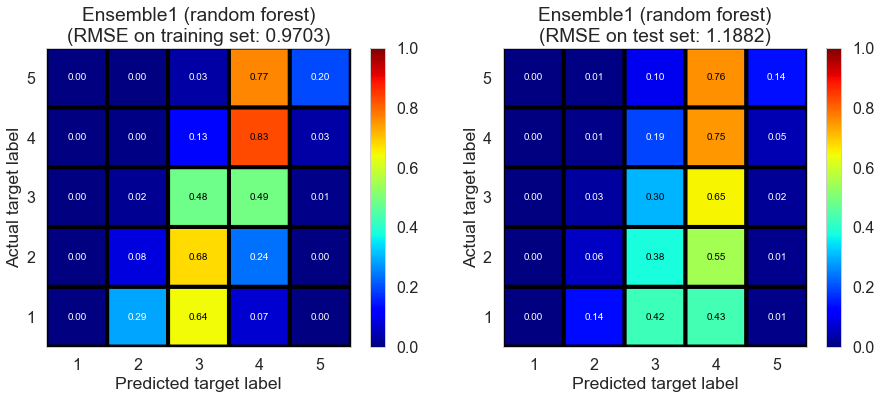

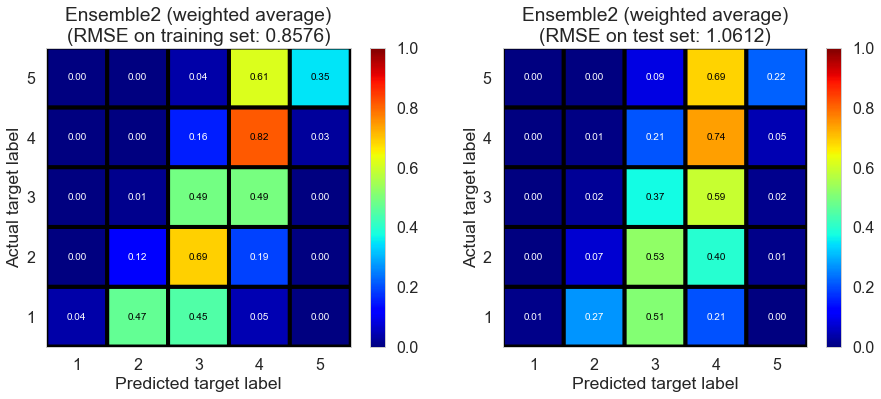

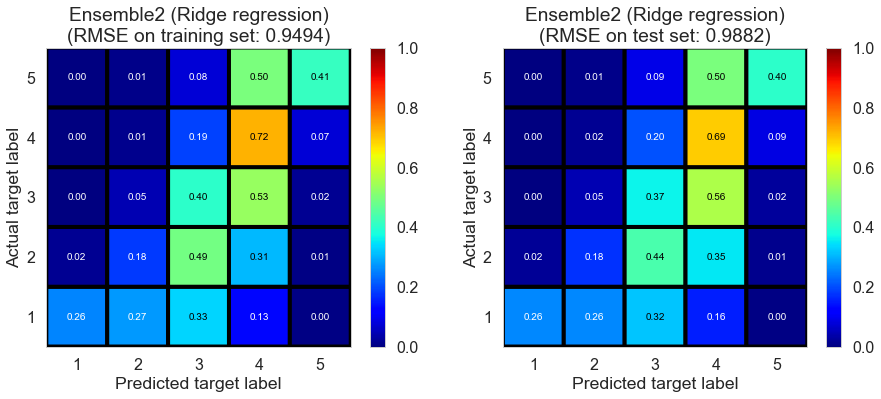

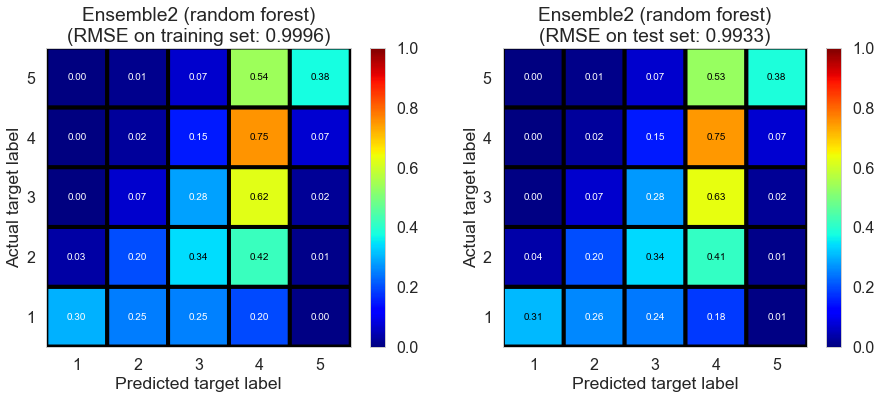

<br><br>

### Toronto <sup>(331407 reviews, 12118 restaurants, 77506 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8830,1.8801,-1.1173,-1.1219
Normal predictor*,1.0181,1.7034,1.7099,-0.7326,-0.7552
Baseline (mean),0.2360,0.9293,1.2911,0.4843,-0.0006
Baseline (regression),0.6270,0.9918,1.1624,0.4126,0.1890
Baseline (ALS)*,1.6651,1.0916,1.1730,0.2884,0.1740
SVD-ALS1,168.3716,0.5614,1.1751,0.8118,0.1711
SVD-ALS2,169.0347,0.5634,1.1795,0.8104,0.1649
SVD-SGD*,17.6360,0.8222,1.1772,0.5963,0.1681
SVD++-SGD*,119.8469,0.8730,1.1763,0.5449,0.1694
NMF-SGD*,22.2953,0.4094,1.3369,0.8999,-0.0729


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,1.1401,1.0049,1.0035,0.3970,0.3955
Random forest,27.0035,0.9891,0.9909,0.4158,0.4106


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8044,1.1661,0.6136,0.1837
Ensemble1 (Ridge regression),0.0290,1.0152,1.1620,0.3845,0.1895
Ensemble1 (random forest),3.2312,0.9977,1.1637,0.4056,0.1872
Ensemble2 (weighted average),0.0000,0.8564,1.0542,0.5620,0.3329
Ensemble2 (Ridge regression),0.0390,1.0111,0.9879,0.3895,0.4141
Ensemble2 (random forest),4.1512,0.9948,0.9962,0.4090,0.4043


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

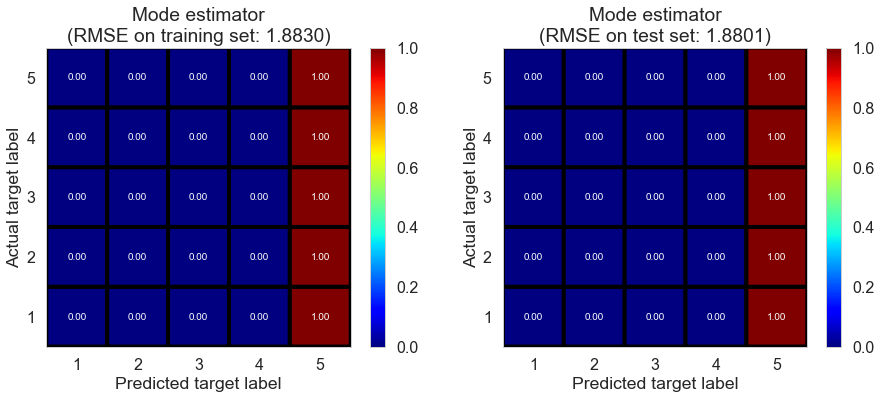

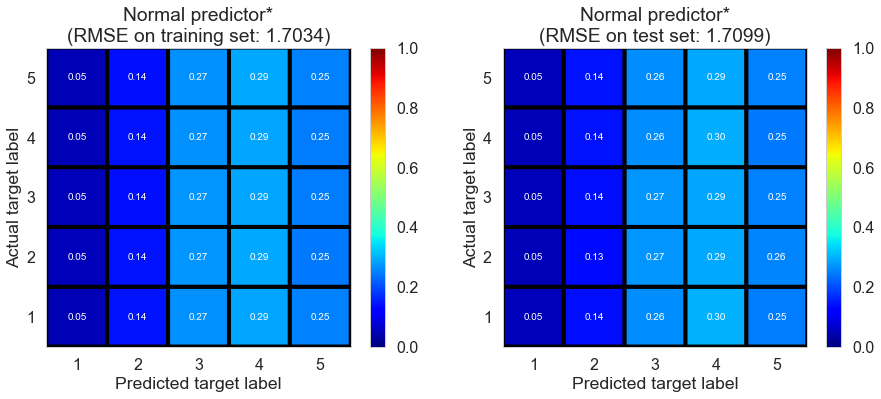

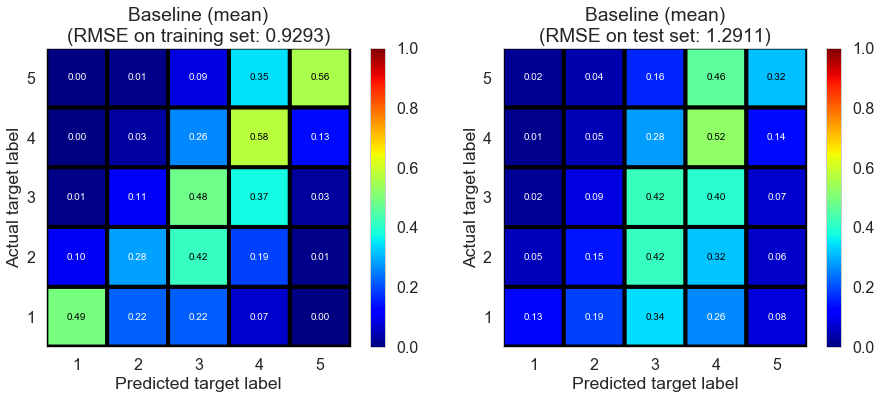

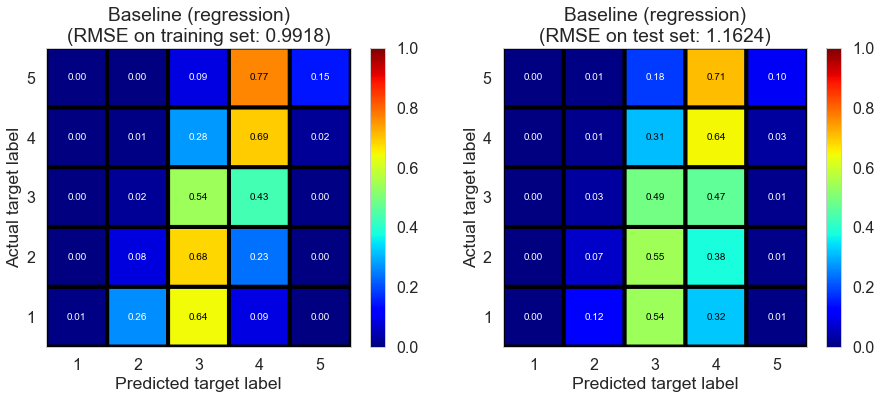

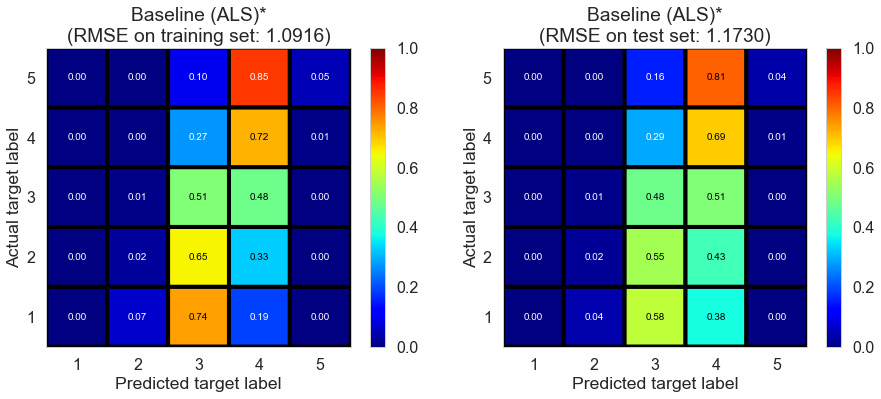

...

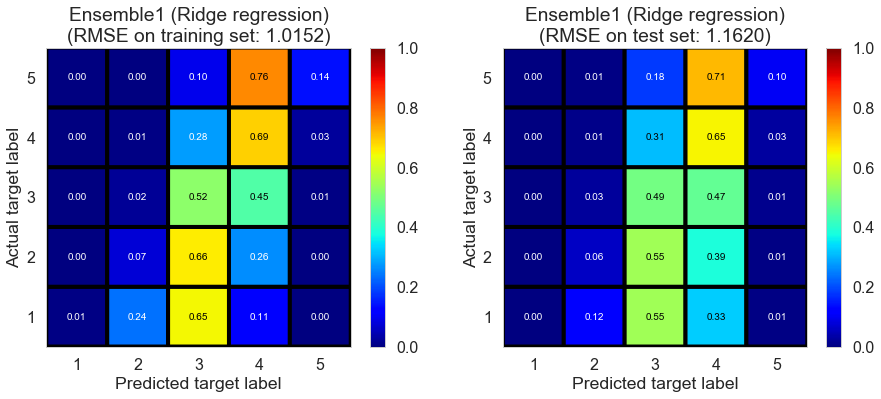

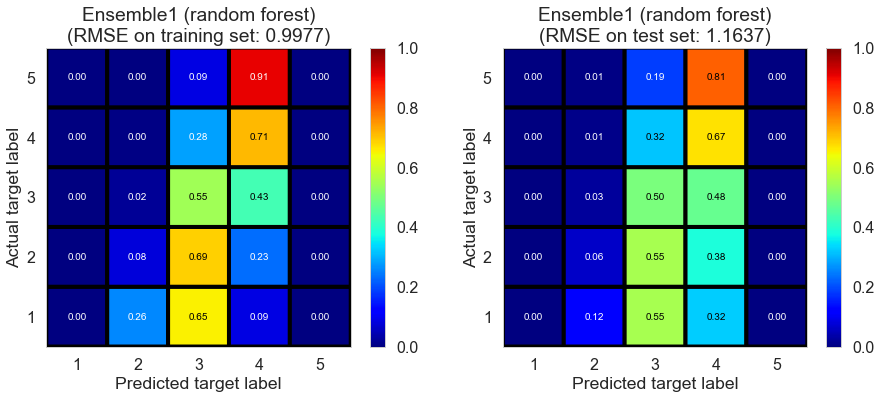

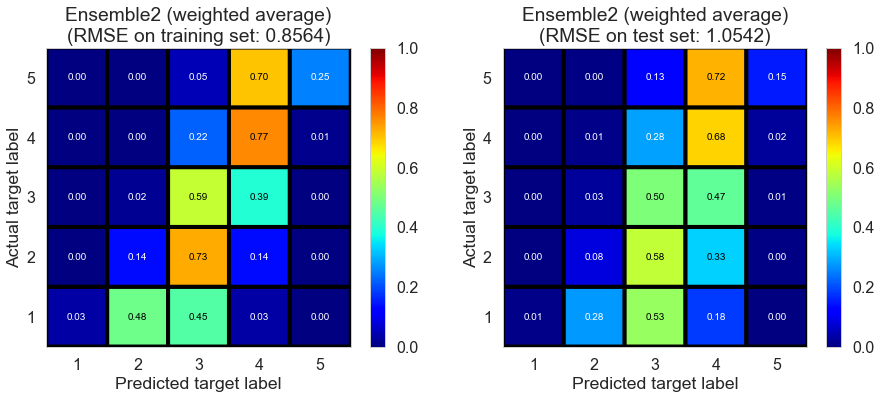

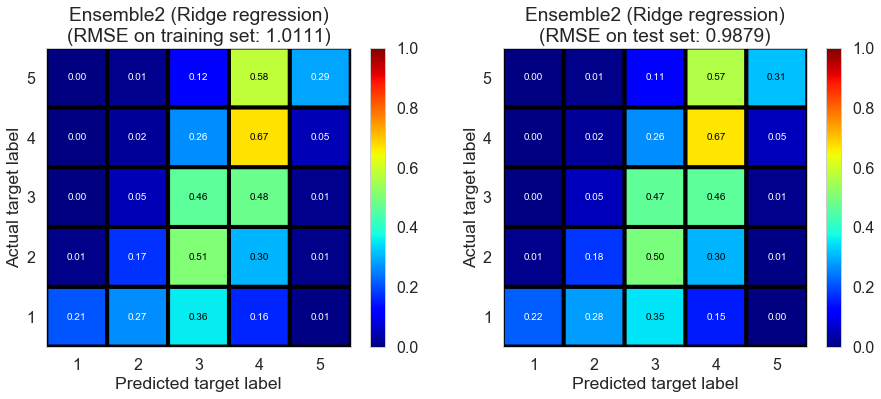

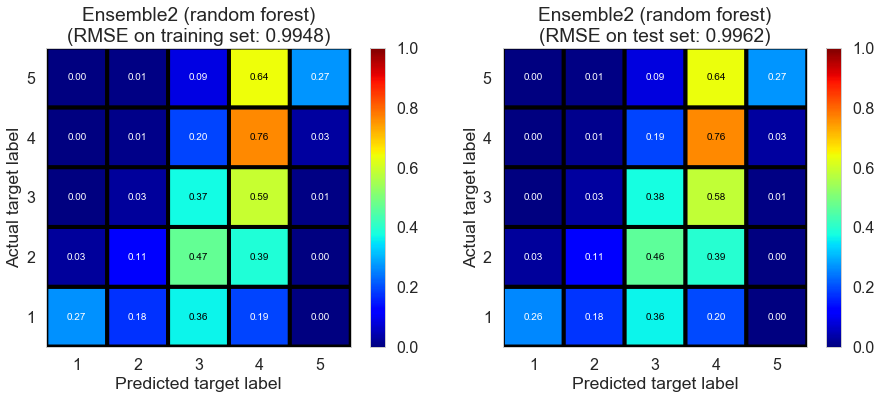

<br><br>

### Las_Vegas <sup>(1280896 reviews, 20434 restaurants, 429363 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.9060,1.9073,-0.7549,-0.7578
Normal predictor*,5.3933,1.8565,1.8573,-0.6649,-0.6667
Baseline (mean),1.1371,0.9990,1.4148,0.5179,0.0329
Baseline (regression),5.9963,1.0732,1.2612,0.4436,0.2314
Baseline (ALS)*,6.9174,1.1880,1.2696,0.3182,0.2211
SVD-ALS1,652.1173,0.4264,1.2794,0.9122,0.2091
SVD-ALS2,674.9286,0.4283,1.2862,0.9114,0.2007
SVD-SGD*,70.6220,0.7758,1.2827,0.7093,0.2050
SVD++-SGD*,333.8711,0.8046,1.3020,0.6873,0.1809
NMF-SGD*,92.4893,0.4178,1.4916,0.9157,-0.0750


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,5.0093,1.1216,1.1226,0.3923,0.3911
Random forest,154.2278,1.1008,1.1029,0.4146,0.4122


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.7633,1.2648,0.7185,0.2270
Ensemble1 (Ridge regression),0.1270,1.0514,1.2600,0.4660,0.2329
Ensemble1 (random forest),13.2948,1.0838,1.2617,0.4326,0.2308
Ensemble2 (weighted average),0.0000,0.8674,1.1697,0.6366,0.3389
Ensemble2 (Ridge regression),0.1520,1.1144,1.1016,0.4001,0.4136
Ensemble2 (random forest),16.9300,1.1061,1.1082,0.4090,0.4066


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

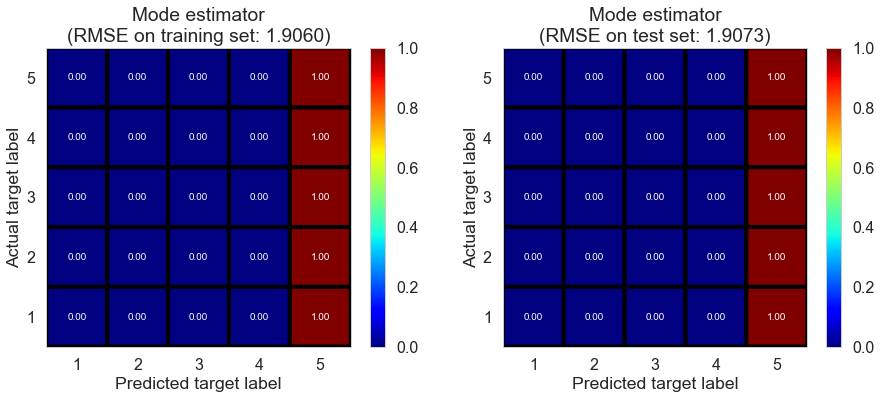

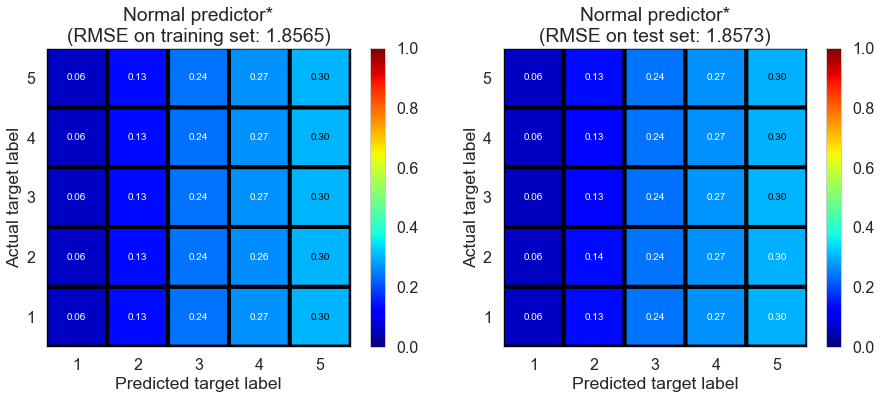

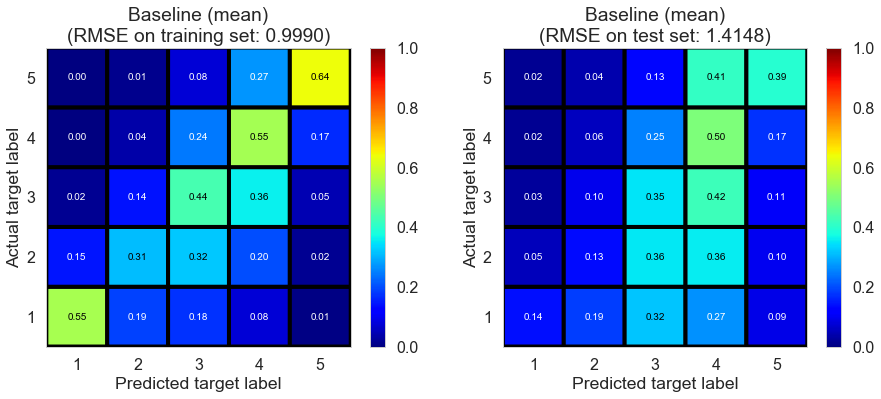

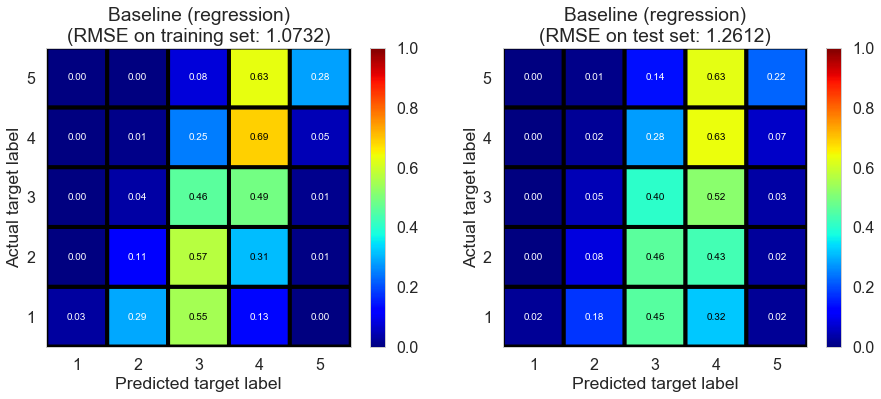

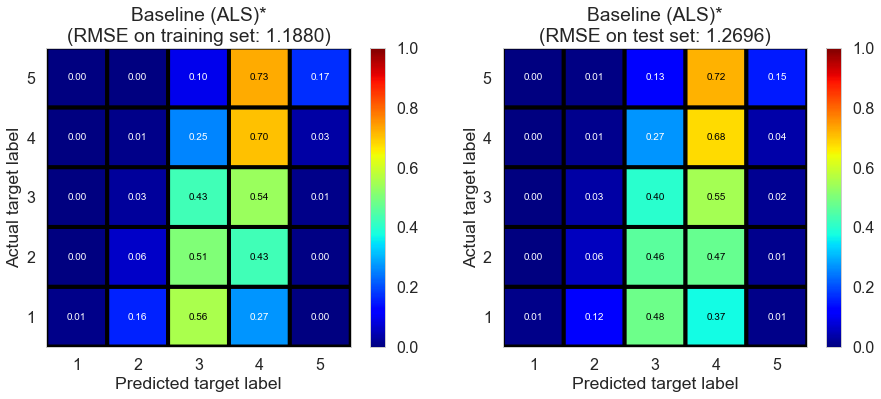

...

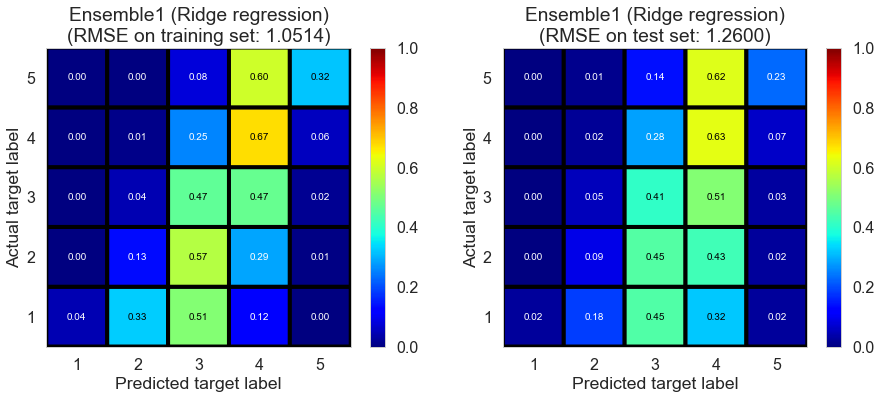

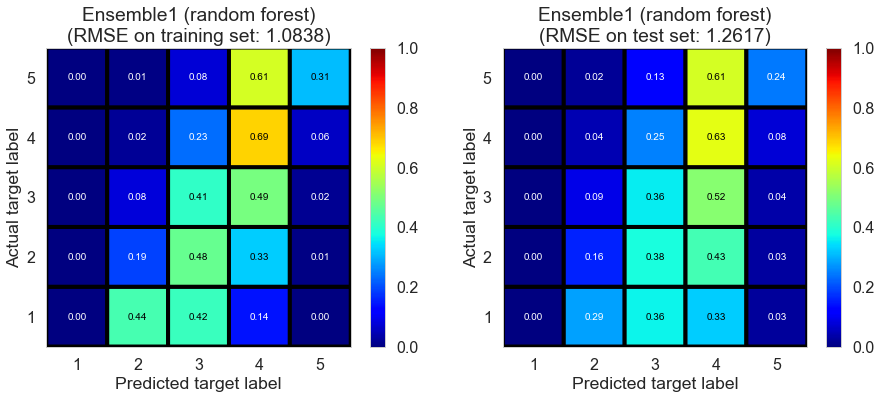

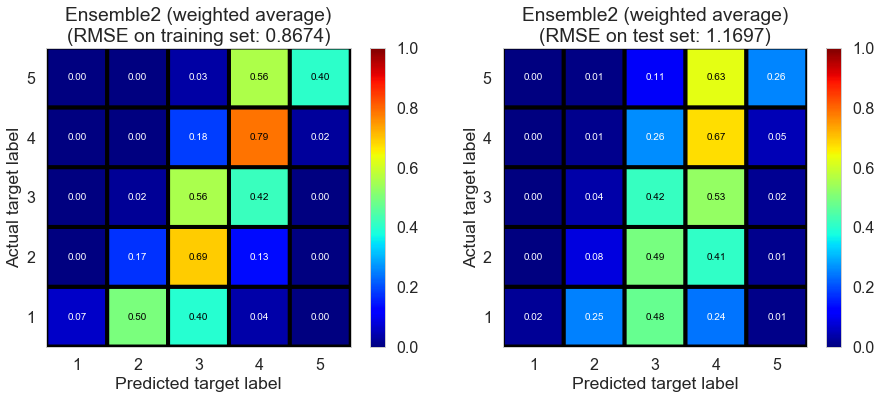

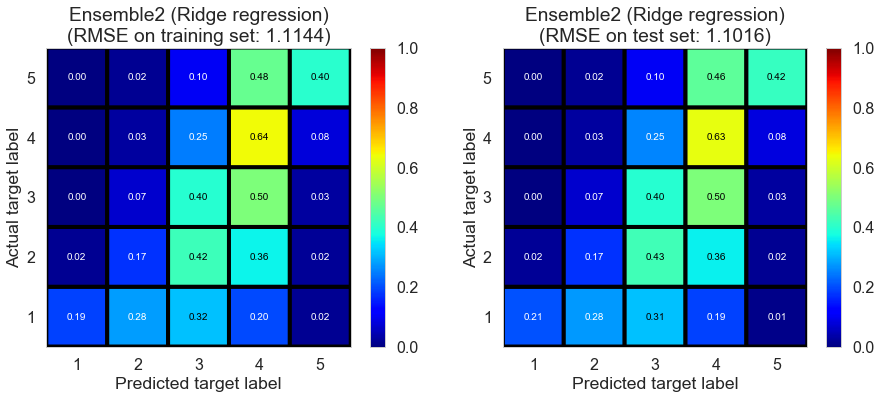

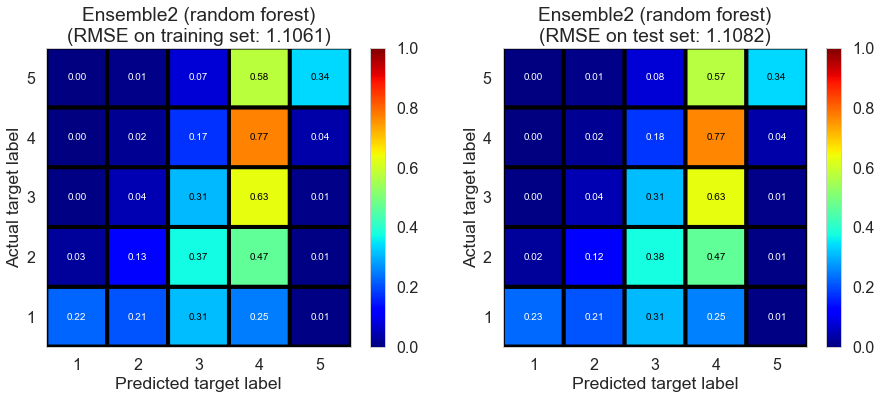

<br><br>

### Full <sup>(4166778 reviews, 131025 restaurants, 1117891 users)</sup>

Collaborative filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Mode estimator,0.0000,1.8974,1.8985,-0.7803,-0.7799
Normal predictor*,19.3631,1.8394,1.8405,-0.6729,-0.6727
Baseline (mean),4.6053,1.0178,1.4063,0.4878,0.0234
Baseline (regression),21.4822,1.0642,1.2529,0.4400,0.2248
Baseline (ALS)*,27.2096,1.1754,1.2659,0.3169,0.2086
SVD-ALS1,2153.7902,0.5313,1.2691,0.8604,0.2046
SVD-ALS2,2268.9128,0.5332,1.2756,0.8594,0.1965
SVD-SGD*,242.1499,0.8312,1.2721,0.6584,0.2008
SVD++-SGD*,1473.2923,0.8713,1.2784,0.6246,0.1930
NMF-SGD*,323.9235,0.4277,1.4656,0.9095,-0.0607


<sup>(* shows the algorithms we implemented by wrapping around     methods in scikit-surprise python package)</sup>

Content filtering,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ridge regression,17.1610,1.0857,1.0869,0.4171,0.4167
Random forest,663.2849,1.0639,1.0653,0.4403,0.4396


Ensemble estimators,fitting time (s),train RMSE,test RMSE,train $R^2$,test $R^2$
Ensemble1 (weighted average),0.0000,0.8161,1.2572,0.6706,0.2195
Ensemble1 (Ridge regression),0.4160,1.0550,1.2520,0.4496,0.2260
Ensemble1 (random forest),56.0282,1.0652,1.2542,0.4389,0.2233
Ensemble2 (weighted average),0.0000,0.8864,1.1434,0.6115,0.3545
Ensemble2 (Ridge regression),0.5530,1.0865,1.0623,0.4163,0.4427
Ensemble2 (random forest),69.6950,1.0689,1.0703,0.4351,0.4343


<sup>(Ensemble1 represents the ensemble of collaborative filtering models;     Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>

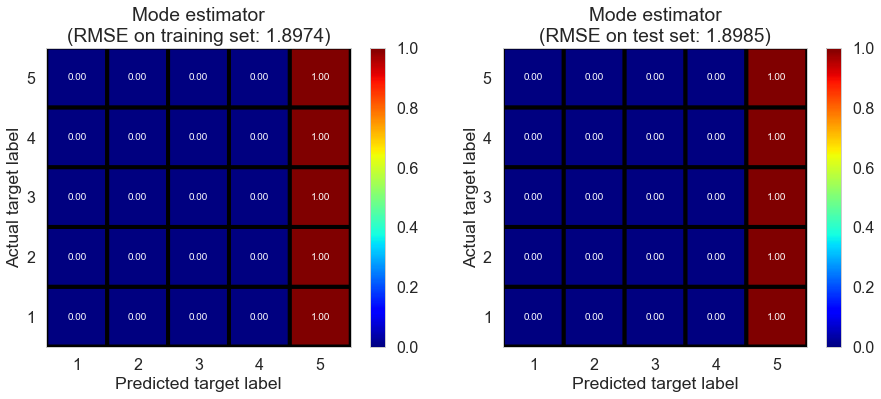

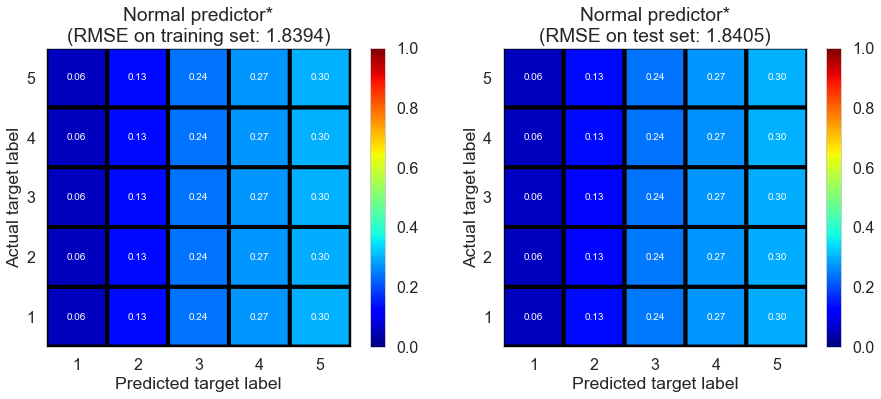

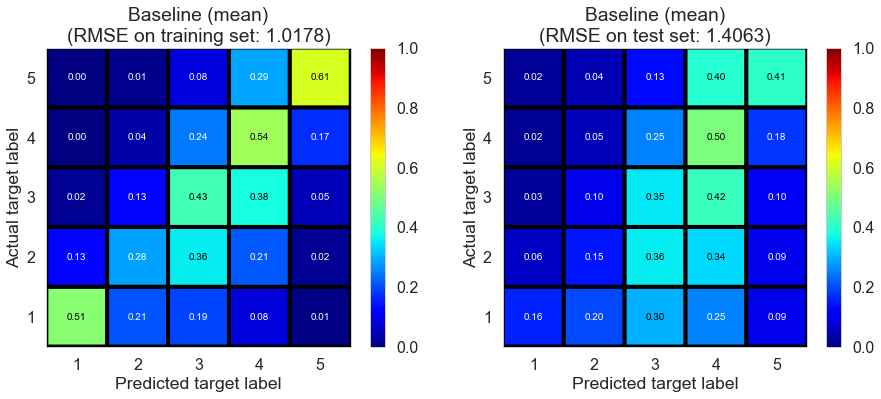

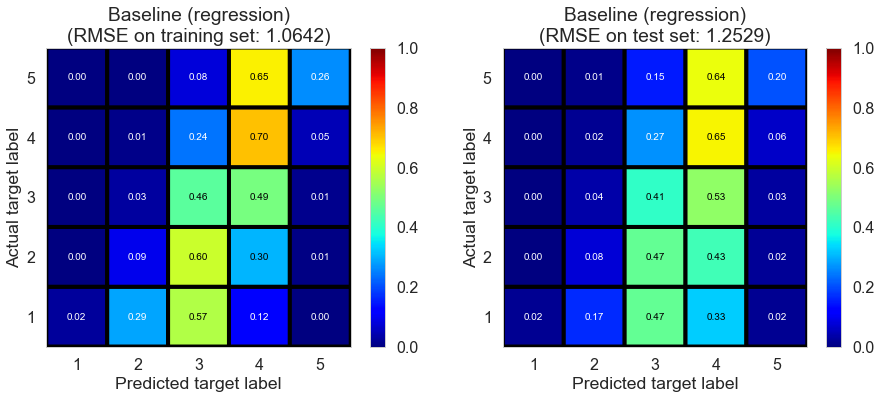

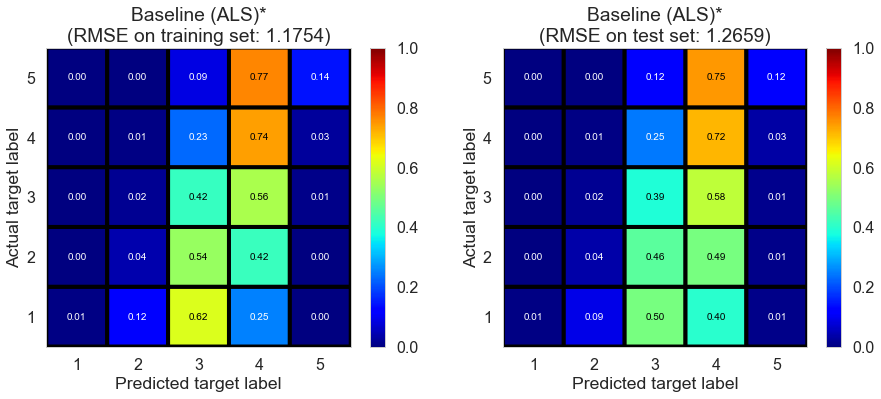

...

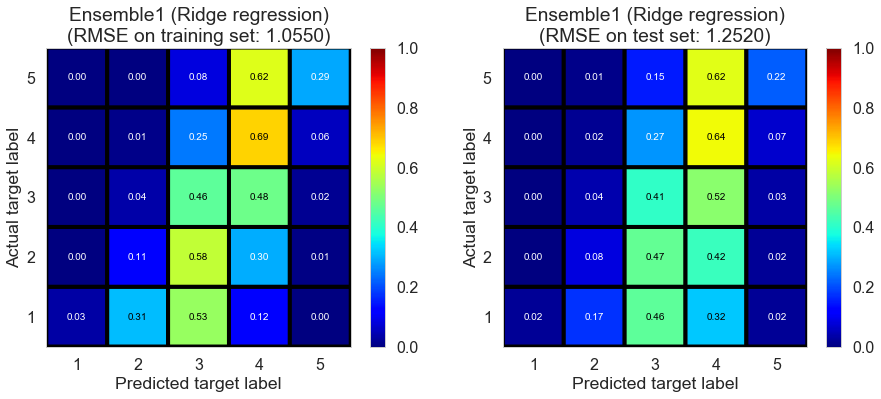

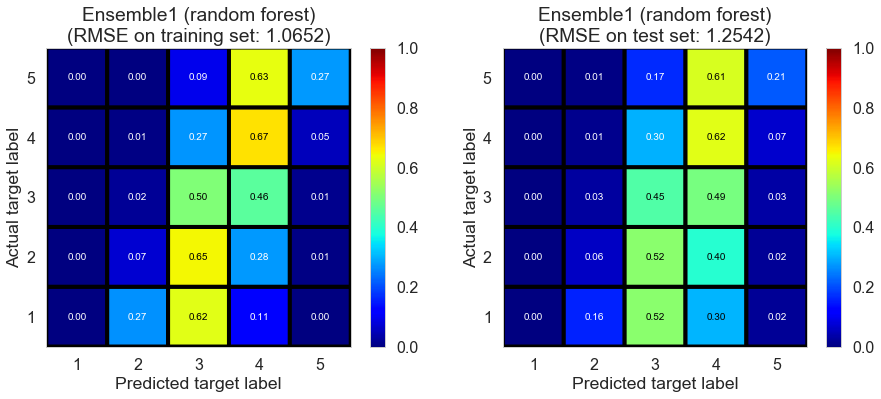

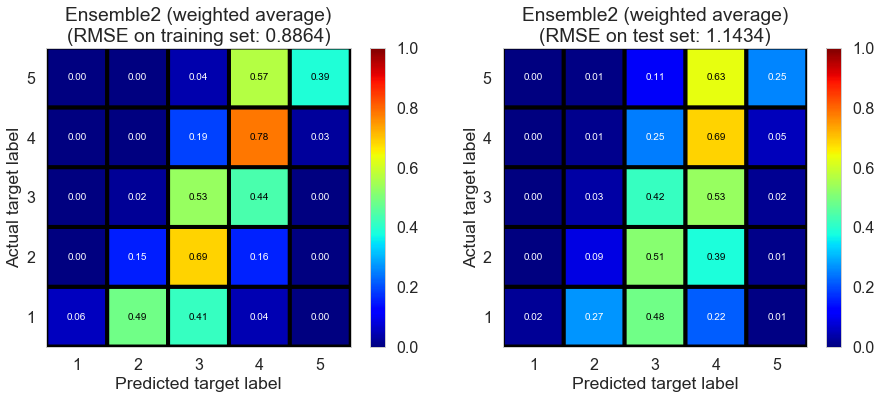

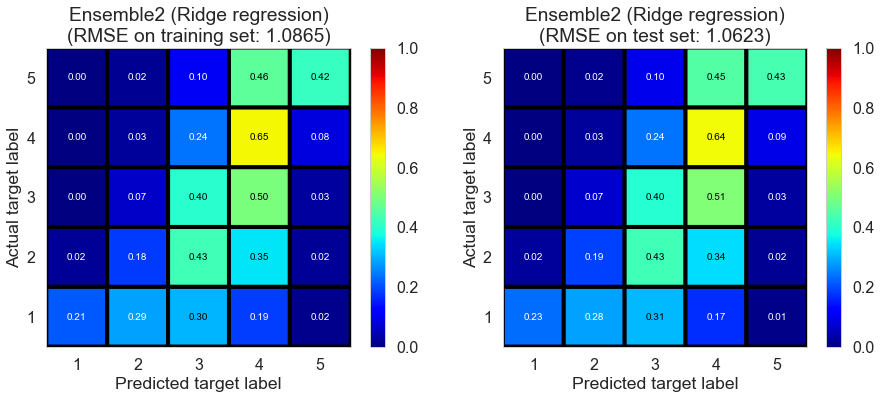

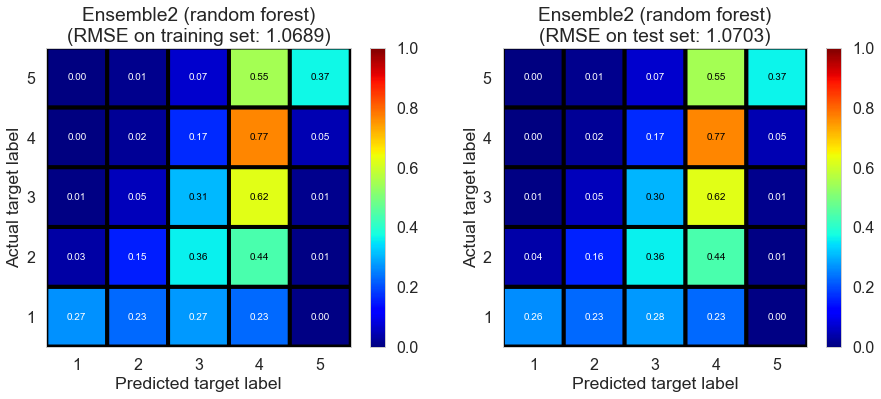

<br><br>

In [2]:
cities = ['Champaign', 'Cleveland', 'Pittsburgh', 'Toronto', 'Las_Vegas', 'Full']

for city in cities:
    data_dir = 'data/{}/'.format(city)
    model_names = IO(data_dir + 'results/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results/is_successful.pkl').read_pickle()
    sizes = IO(data_dir + 'sizes.pkl').read_pickle()
    
    display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                 format(city, sizes[0], sizes[1], sizes[2])))
    #display(Markdown('**Collaborative filtering**'))
    show_summaries(model_names, results, is_successful, title='Collaborative filtering')
    display(Markdown('<sup>(* shows the algorithms we implemented by wrapping around \
    methods in scikit-surprise python package)</sup>'))
    
    model_names = IO(data_dir + 'results05/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results05/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results05/is_successful.pkl').read_pickle()
    #sizes = IO(data_dir + 'sizes.pkl').read_pickle()

    #display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                     #format(city, sizes[0], sizes[1], sizes[2])))
    #display(Markdown('**Content filtering**'))
    show_summaries(model_names, results, is_successful, title='Content filtering')
    
    model_names = IO(data_dir + 'results06/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results06/results.pkl').read_pickle()
    is_successful = IO(data_dir + 'results06/is_successful.pkl').read_pickle()
    #sizes = IO(data_dir + 'sizes.pkl').read_pickle()

    #display(Markdown('### {} <sup>({} reviews, {} restaurants, {} users)</sup>'.\
                     #format(city, sizes[0], sizes[1], sizes[2])))
    #display(Markdown('**Ensemble**'))
    show_summaries(model_names, results, is_successful, title='Ensemble estimators')
    display(Markdown('<sup>(Ensemble1 represents the ensemble of collaborative filtering models; \
    Ensemble2 represents the ensemble of collaborative filtering and content filtering models)</sup>'))
    
    # confusion matrix
    
    is_successful = IO(data_dir + 'results/is_successful.pkl').read_pickle()
    datanames = IO(data_dir + 'results/datanames.pkl').read_pickle()
    model_names = IO(data_dir + 'results/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results/results.pkl').read_pickle()
    X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + 'data_split.pkl').read_pickle()

    for i in range(len(is_successful)):
        if is_successful[i]:
            model = IO(datanames[i]).read_pickle()
            show_results(model, model_names[i], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, \
                         results=results[i], show_cv=False, print_=False, show_title=False)
            del model
    
    is_successful = IO(data_dir + 'results05/is_successful.pkl').read_pickle()
    datanames = IO(data_dir + 'results05/datanames.pkl').read_pickle()
    model_names = IO(data_dir + 'results05/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results05/results.pkl').read_pickle()
    X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + '05_data_split.pkl').read_pickle()

    for i in range(len(is_successful)):
        if is_successful[i]:
            model = IO(datanames[i]).read_pickle()
            show_results(model, model_names[i], X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, \
                         results=results[i], show_cv=False, print_=False, show_title=False)
            del model
            
    is_successful = IO(data_dir + 'results06/is_successful.pkl').read_pickle()
    datanames = IO(data_dir + 'results06/datanames.pkl').read_pickle()
    model_names = IO(data_dir + 'results06/model_names.pkl').read_pickle()
    results = IO(data_dir + 'results06/results.pkl').read_pickle()
    X_train, y_train, X_test, y_test, X_cv, y_cv = IO(data_dir + 'data_split.pkl').read_pickle()

    for i in range(len(is_successful)):
        if is_successful[i]:
            model = IO(datanames[i]).read_pickle()
            show_results(model, model_names[i], None, y_train, None, y_test, results=results[i], \
                         show_cv=False, print_=False, show_title=False)
            del model
    
    display(Markdown('''<br><br>'''))

# Conclusions

## Conclusions

In this project, we implemented and benchmarked several widely used models for recommender systems on 6 different size of datasets sampled from [Yelp academic dataset](https://www.yelp.com/dataset/challenge). We tested several baseline models, collaborative filtering models and content filtering models, and explored several strategies of building ensemble models. Our regression based baseline model performed best on test set among baseline and collaborative filtering models we tried. We found the performance of matrix factorization based latent factor models is generally better than that of neighborhood methods, which is presumably due to the sparsity of the dataset. We recommended random forest for the construction of ensemble estimator from predictions of base estimators. Finally, we demonstrated our models perform robustly on different size of datasets.
<br><br>

## Future work

### Address potential drawbacks in content filtering models

Although the test $R^2$ of our content filtering models is very high, we found the most siginificant predictors are average ratings of user and restaurant instead of user or restaurant profiles, which is fishy. We then realized our assumption that average ratings of user and restaurants are always available might be incorrect since a lot of users / restaurants only sent / recieved one rating, which questioned the validity of our content filtering models.

One potential solution to this issue is to obtain average ratings of users or restaurants by learning from data in the training set as what we did in baseline (mean) model rather than using the average ratings in the user and business tables directly. We expected the test $R^2$ to be lower if we process data in this way. To improve the performance of content filtering models, we need to figure out how to acquire more useful features from user or restaurant profiles.
<br><br>

### Improve the efficiency of SVD-ALS models

We noticed the fitting time of 2 SVD-ALS models we implemented was much longer than other algorithms we tested. And we believed it was mainly due to defects in our implementation since we implemented the algorithms in python, which might not be efficient enough. We could try implementing the algorithms in cython and utilizing parallel computing strategies to speed up computation.
<br><br>

### Take temporal dynamics into account

All models we built in this project were static. We could account for temporal effects such as the change of a restaurant's popularity or user preferences. We could also incorporate incremental learning strategies for our models.
<br><br>

### Implement the user interface of recommender systems

We could implement an user interface which recommends restaurants for users based on the predicted ratings.

# References

## Acknowledgment

We would like to express our sincere appreciation and thanks to all the professors and teaching fellows in AC209. We greatly admire their inspiring guidance, indispensable support and illuminating instruction in this semester as well as the preparation of this report and website.

## References

1. [Yelp Dataset](https://www.yelp.com/dataset) and [Yelp's Academic Dataset Examples](https://github.com/Yelp/dataset-examples)
2. [Oversampling with Bigram Multinomial Naive Bayes to Predict Yelp Review Star Classes](https://kevin11h.github.io/YelpDatasetChallengeDataScienceAndMachineLearningUCSD/), Kevin Hung and Henry Qiu, University of California, San Diego.
3. [Matrix Factorization Techniques for Recommender Systems](https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf), Yehuda Koren, Robert Bell and Chris Volinsky, 2009.
4. [Probabilistic Matrix Factorization](http://papers.nips.cc/paper/3208-probabilistic-matrix-factorization.pdf), Ruslan Salakhutdinov and Andriy Mnih, 2008.
5. [An Efficient Non-Negative Matrix-Factorization-Based Approach to Collaborative Filtering for Recommender Systems](http://ieeexplore.ieee.org.ezp-prod1.hul.harvard.edu/stamp/stamp.jsp?arnumber=6748996&tag=1), Xin Luo, Mengchu Zhou, Yunni Xia and Qingsheng Zhu, 2014.
6. [Slope One Predictors for Online Rating-Based Collaborative Filtering](https://arxiv.org/pdf/cs/0702144.pdf), Daniel Lemire and Anna Maclachlan, 2005.
7. [A Scalable Collaborative Filtering Framework based on Co-clustering](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.113.6458&rep=rep1&type=pdf), Thomas George and Srujana Merugu, 2005.
8. [`scikit-surprise`](http://surpriselib.com/) package.